# Signal Processing and Machine Learning for Finance Coursework

In [307]:
# Imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy import stats

# from statsmodels.tsa.arima_model import ARIMA
# from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.ar_model import AR
import copy
from statsmodels.tsa.api import VAR
import seaborn as sns

from scipy.stats import pearsonr
from sklearn.decomposition import PCA

from scipy.stats import norm
from scipy.stats import gaussian_kde
from scipy.stats import median_abs_deviation
from statsmodels.robust.scale import mad
from scipy.stats import iqr
from sklearn import linear_model
import random

import requests
from bs4 import BeautifulSoup
import networkx as nx
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import StandardScaler
import matplotlib.lines as mlines
from scipy.signal import periodogram


%matplotlib inline

## Section 1 - Regression Methods

### 1.1 Processing stock price data in Python

In [ ]:
save_folder = "Section 1 figures/1.1/"

##### 1.1.1

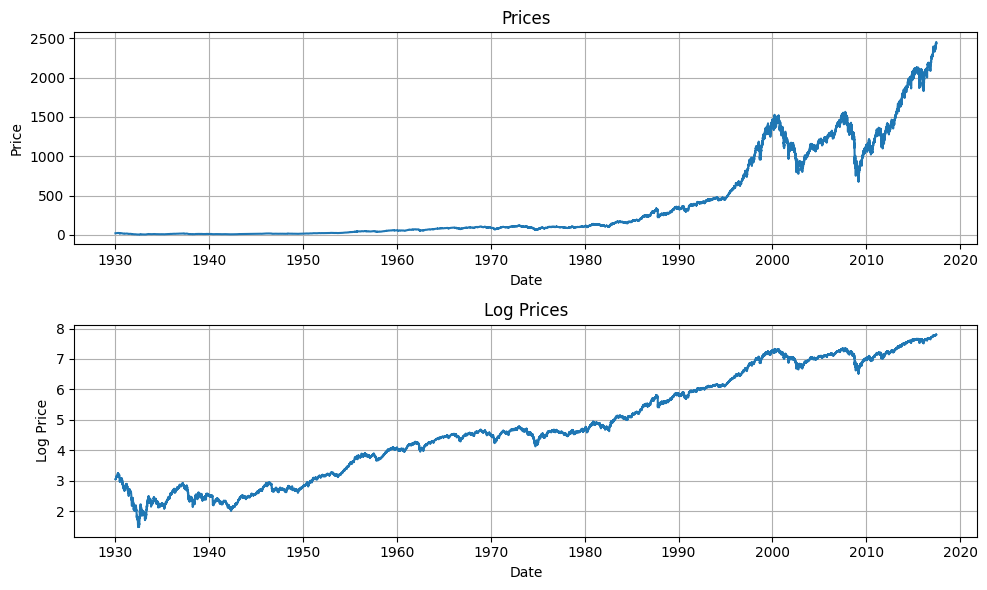

In [411]:
px = pd.read_csv("priceData.csv", header=0)
px.dropna(inplace=True)
px["date"] = pd.to_datetime(px["date"], format="%d/%m/%Y", dayfirst=True)

# Set 'date' column as index
px.set_index("date", inplace=True)

# Calculate logpx
logpx = np.log(px)

# Plotting
fig, axs = plt.subplots(2, figsize=(10, 6))

axs[0].plot(px["SPX Index"])
axs[0].set_title("Prices")
axs[0].set_ylabel("Price")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].plot(logpx)
axs[1].set_title("Log Prices")
axs[1].set_ylabel("Log Price")
axs[1].set_xlabel("Date")
axs[1].grid(True)

plt.tight_layout()
plt.show()

fig.savefig(save_folder + "price&logprices.png")

##### 1.1.2

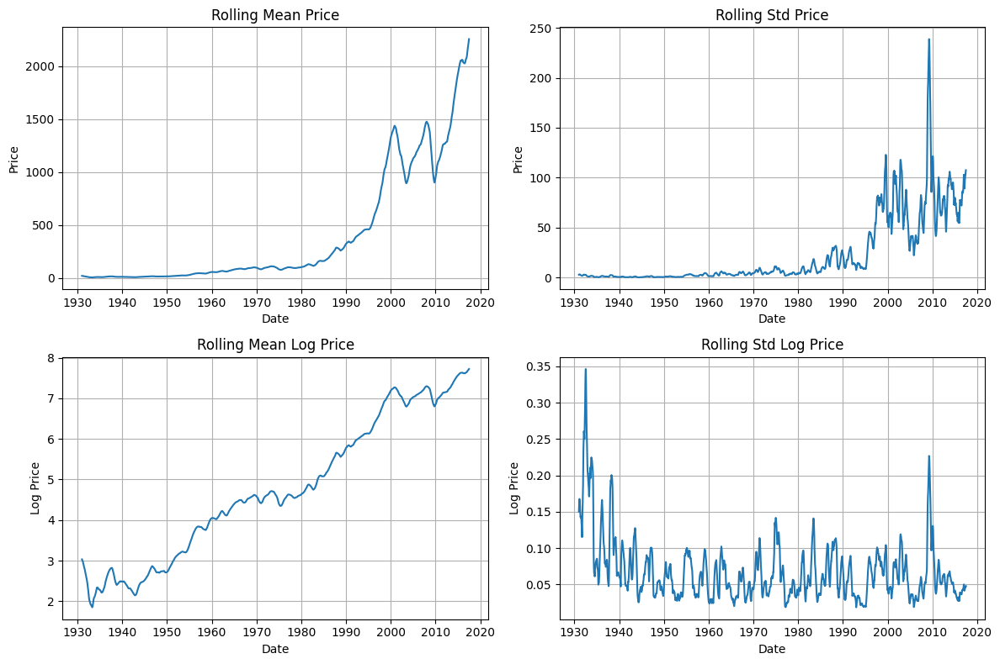

In [412]:
# sliding mean and std
rolling_mean_logpx = logpx.rolling(252).mean()
rolling_std_logpx = logpx.rolling(252).std()
rolling_mean_px = px.rolling(252).mean()
rolling_std_px = px.rolling(252).std()

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

axs[0, 0].plot(rolling_mean_px)
axs[0, 0].set_title("Rolling Mean Price")
axs[0, 0].set_ylabel("Price")
axs[0, 0].set_xlabel("Date")
axs[0, 0].grid(True)

axs[0, 1].plot(rolling_std_px)
axs[0, 1].set_title("Rolling Std Price")
axs[0, 1].set_ylabel("Price")
axs[0, 1].set_xlabel("Date")
axs[0, 1].grid(True)

axs[1, 0].plot(rolling_mean_logpx)
axs[1, 0].set_title("Rolling Mean Log Price")
axs[1, 0].set_ylabel("Log Price")
axs[1, 0].set_xlabel("Date")
axs[1, 0].grid(True)

axs[1, 1].plot(rolling_std_logpx)
axs[1, 1].set_title("Rolling Std Log Price")
axs[1, 1].set_ylabel("Log Price")
axs[1, 1].set_xlabel("Date")
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

fig.savefig(save_folder + "rollingmean&std.png")

The rolling mean has an upwards trend, therefore the price and log-price time series are non-stationary as stationary time series assume a constant mean.

##### 1.1.3

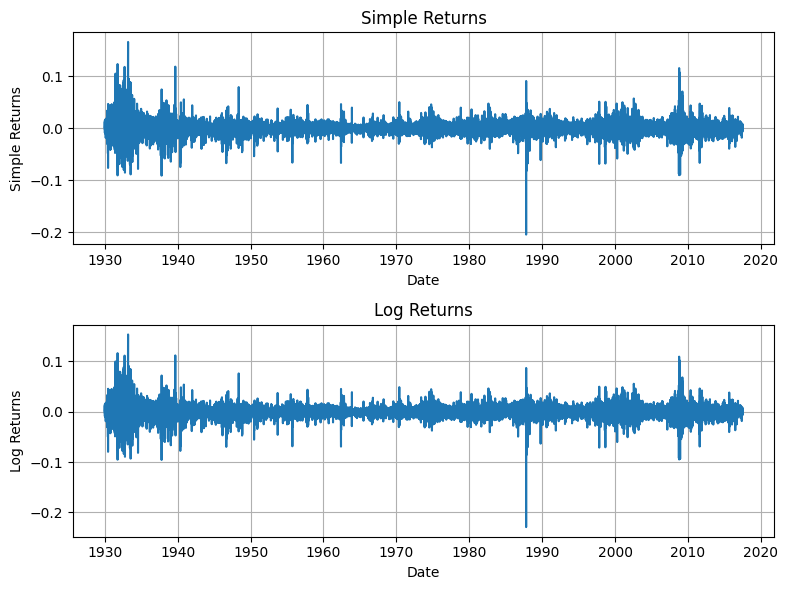

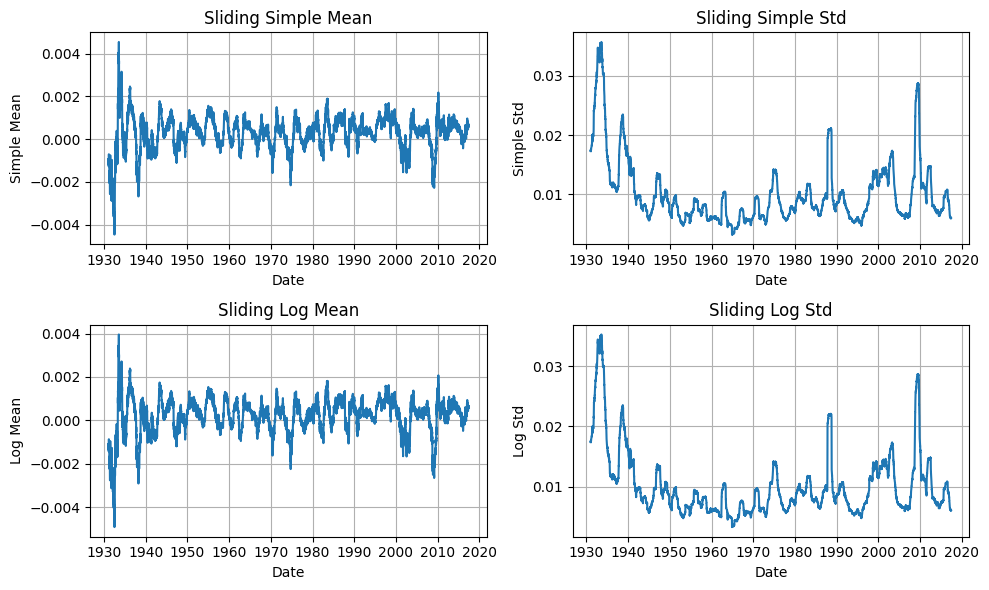

In [413]:
simple_returns = px.pct_change()
log_returns = logpx.diff()

# Plotting
fig, axs = plt.subplots(2, figsize=(8, 6))

axs[0].plot(simple_returns)
axs[0].set_title("Simple Returns")
axs[0].set_ylabel("Simple Returns")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].plot(log_returns)
axs[1].set_title("Log Returns")
axs[1].set_ylabel("Log Returns")
axs[1].set_xlabel("Date")
axs[1].grid(True)

plt.tight_layout()
plt.show()

fig.savefig(save_folder + "simple&log_returns.png")

sliding_simple_mean = simple_returns.rolling(252).mean()
sliding_simple_std = simple_returns.rolling(252).std()
sliding_log_mean = log_returns.rolling(252).mean()
sliding_log_std = log_returns.rolling(252).std()

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].plot(sliding_simple_mean)
axs[0, 0].set_title("Sliding Simple Mean")
axs[0, 0].set_ylabel("Simple Mean")
axs[0, 0].set_xlabel("Date")
axs[0, 0].grid(True)

axs[0, 1].plot(sliding_simple_std)
axs[0, 1].set_title("Sliding Simple Std")
axs[0, 1].set_ylabel("Simple Std")
axs[0, 1].set_xlabel("Date")
axs[0, 1].grid(True)

axs[1, 0].plot(sliding_log_mean)
axs[1, 0].set_title("Sliding Log Mean")
axs[1, 0].set_ylabel("Log Mean")
axs[1, 0].set_xlabel("Date")
axs[1, 0].grid(True)

axs[1, 1].plot(sliding_log_std)
axs[1, 1].set_title("Sliding Log Std")
axs[1, 1].set_ylabel("Log Std")
axs[1, 1].set_xlabel("Date")
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

fig.savefig(save_folder + "sliding_simple&log_returns.png")

The mean of the simple and log returns oscillate around 0; this implies that these are stationary time series.

##### 1.1.4

Simple Returns Jarque-Bera Test SignificanceResult(statistic=257540.0649368358, pvalue=0.0)
Log Returns Jarque-Bera Test SignificanceResult(statistic=309277.64126696065, pvalue=0.0)
Simple Returns Jarque-Bera Test (last 10 points) SignificanceResult(statistic=0.7239589095523757, pvalue=0.6962966732658081)
Log Returns Jarque-Bera Test (last 10 points) SignificanceResult(statistic=0.6975678824907421, pvalue=0.7055455530967545)


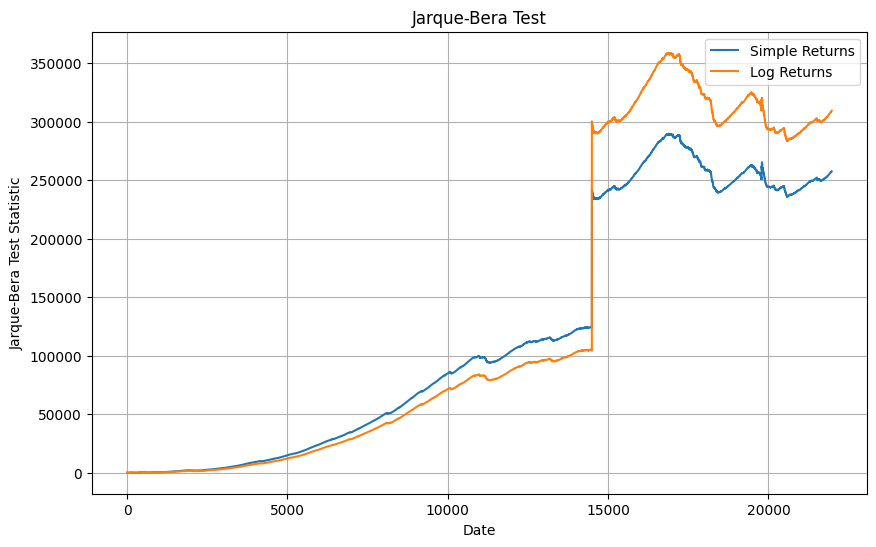

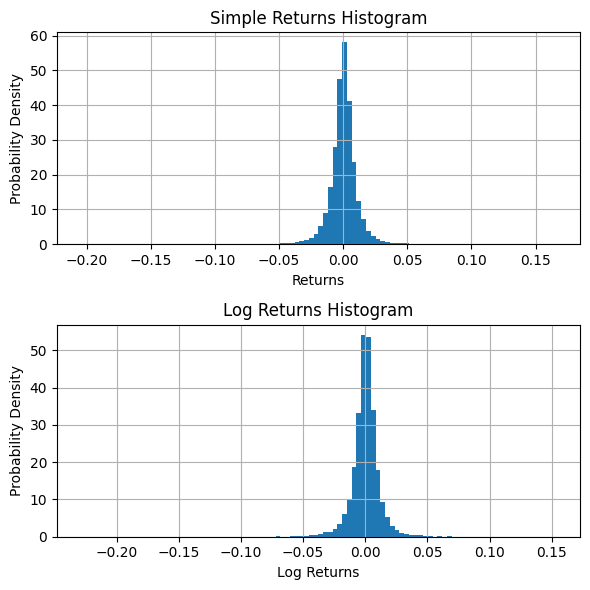

In [414]:
jarque_simple = stats.jarque_bera(simple_returns.dropna())
jarque_log = stats.jarque_bera(log_returns.dropna())

print("Simple Returns Jarque-Bera Test", jarque_simple)
print("Log Returns Jarque-Bera Test", jarque_log)

jarque_simple_10points = stats.jarque_bera(simple_returns.dropna().iloc[-10:])
jarque_log_10points = stats.jarque_bera(log_returns.dropna().iloc[-10:])

print("Simple Returns Jarque-Bera Test (last 10 points)", jarque_simple_10points)
print("Log Returns Jarque-Bera Test (last 10 points)", jarque_log_10points)

jarque_simples = []
# for i in range(len(simple_returns.dropna())):
# jarque_simples.append(stats.jarque_bera(simple_returns.dropna().head(i+1)))

jarque_simples = [
    stats.jarque_bera(simple_returns.dropna()[:i])
    for i in range(1, len(simple_returns.dropna()))
]

jarque_logs = []
for i in range(1, len(log_returns.dropna())):
    jarque_logs.append(stats.jarque_bera(log_returns.dropna()[:i]))


# plotting
plt.figure(figsize=(10, 6))
plt.plot([x[0] for x in jarque_simples], label="Simple Returns")
plt.plot([x[0] for x in jarque_logs], label="Log Returns")
plt.title("Jarque-Bera Test")
plt.ylabel("Jarque-Bera Test Statistic")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
fig.savefig(save_folder + "jarque_bera.png")
plt.show()


# mean and std
mu_simple, std_simple = simple_returns.mean(), simple_returns.std()
mu_log, std_log = log_returns.mean(), log_returns.std()

# x vals
xmin_simple, xmax_simple = simple_returns.min(), simple_returns.max()
xmin_log, xmax_log = log_returns.min(), log_returns.max()
x_simple = np.linspace(xmin_simple, xmax_simple, 100)
x_log = np.linspace(xmin_log, xmax_log, 100)

# PDF
p_simple = stats.norm.pdf(x_simple, mu_simple, std_simple)
p_log = stats.norm.pdf(x_log, mu_log, std_log)

# Plotting
fig, axs = plt.subplots(2, figsize=(6, 6))

axs[0].hist(simple_returns.dropna(), bins=100, density=True)
# axs[0].plot(x_simple, p_simple, color='r')
axs[0].set_title("Simple Returns Histogram")
axs[0].set_ylabel("Probability Density")
axs[0].set_xlabel("Returns")
axs[0].grid(True)

axs[1].hist(log_returns.dropna(), bins=100, density=True)
# axs[1].plot(x_log, p_log, color='r')
axs[1].set_title("Log Returns Histogram")
axs[1].set_ylabel("Probability Density")
axs[1].set_xlabel("Log Returns")
axs[1].grid(True)

plt.tight_layout()
plt.show()

fig.savefig(save_folder + "simple&log_returns_hist.png")

##### 1.1.5 & 1.1.6 are qualitative answers in the report

### 1.2 ARMA vs ARIMA Models for Financial Applications

In [388]:
save_folder = "Section 1 figures/1.2/"

##### 1.2.1

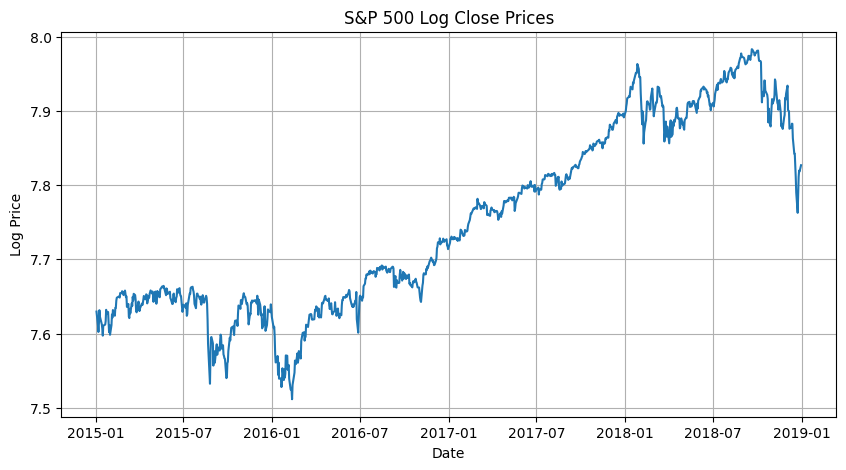

In [415]:
snp = pd.read_csv("snp_500_2015_2019.csv", header=0)
snp["Date"] = pd.to_datetime(snp["Date"], yearfirst=True, format="%Y-%m-%d")
snp.set_index("Date", inplace=True)
snp_close = snp["Close"].to_frame().apply(np.log)

# Plot snp close
plt.figure(figsize=(10, 5))
plt.plot(snp_close)
plt.title("S&P 500 Log Close Prices")
plt.ylabel("Log Price")
plt.xlabel("Date")
plt.grid(True)
plt.savefig(save_folder + "snp_close_logprices.png")
plt.show()

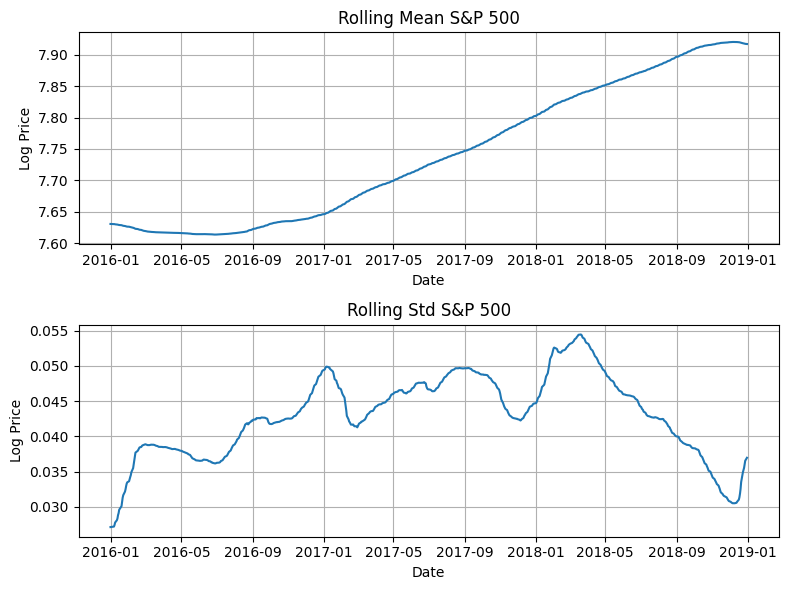

In [416]:
w = 252

# Calculate rolling mean and std
rolling_mean_snp = snp_close.rolling(w).mean()
rolling_std_snp = snp_close.rolling(w).std()


fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(rolling_mean_snp)
axs[0].set_title("Rolling Mean S&P 500")
axs[0].set_ylabel("Log Price")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].plot(rolling_std_snp)
axs[1].set_title("Rolling Std S&P 500")
axs[1].set_ylabel("Log Price")
axs[1].set_xlabel("Date")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "rollingmean&std_snp.png")
plt.show()

#### 1.2.2

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarnin

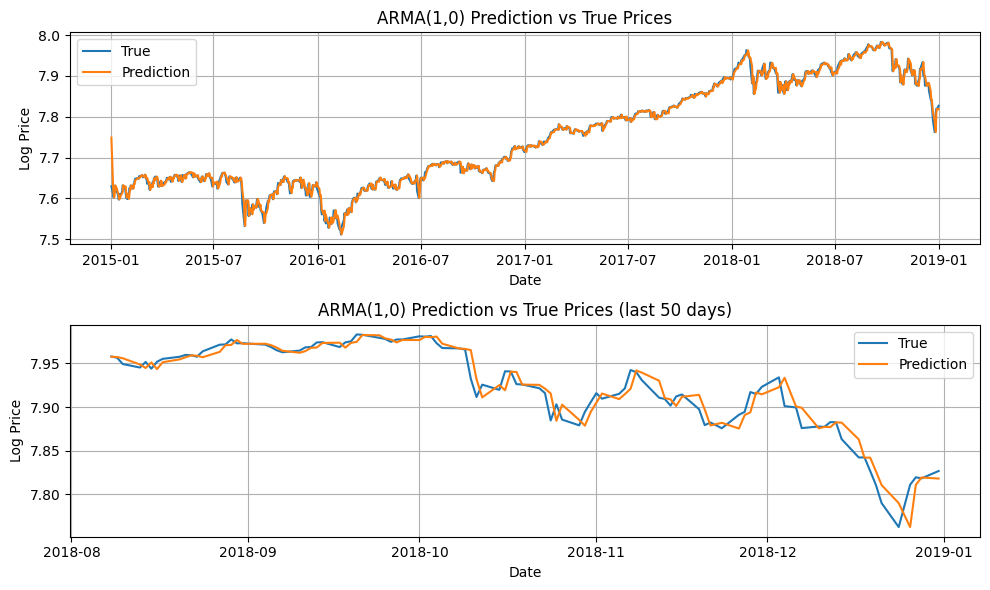

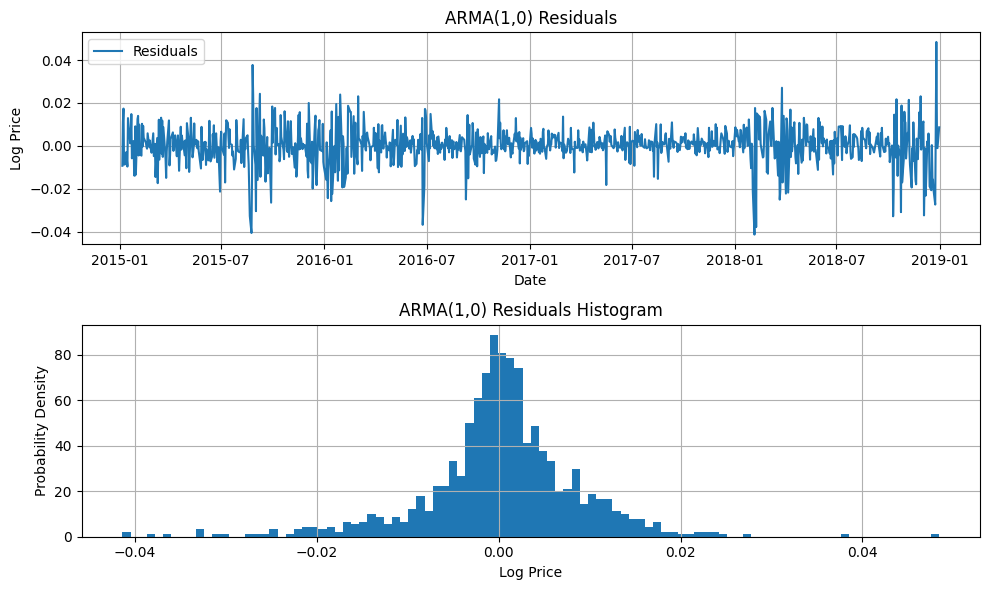

ARMA params:  
 const     7.748867
ar.L1     0.997354
sigma2    0.000074
dtype: float64


In [417]:
snp_arma = copy.deepcopy(snp_close)
snp_arma.columns = ["True"]
snp_arma["Res"] = ARIMA(snp_arma, order=(1, 0, 0)).fit().resid
snp_arma["Prediction"] = snp_arma["True"] - snp_arma["Res"]

arma10 = ARIMA(snp_arma["True"], order=(1, 0, 0)).fit()

# plot prediction and true signal

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

axs[0].plot(snp_arma["True"], label="True")
axs[0].plot(snp_arma["Prediction"], label="Prediction")
axs[0].set_title("ARMA(1,0) Prediction vs True Prices")
axs[0].set_ylabel("Log Price")
axs[0].set_xlabel("Date")
axs[0].legend()
axs[0].grid(True)

axs[1].plot(snp_arma["True"].tail(100), label="True")
axs[1].plot(snp_arma["Prediction"].tail(100), label="Prediction")
axs[1].set_title("ARMA(1,0) Prediction vs True Prices (last 50 days)")
axs[1].set_ylabel("Log Price")
axs[1].set_xlabel("Date")
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "snp_true&prediction_ARMA(1,0)_withzoom.png")
plt.show()


# plot residuals

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

axs[0].plot(snp_arma["Res"][2:], label="Residuals")
axs[0].set_title("ARMA(1,0) Residuals")
axs[0].set_ylabel("Log Price")
axs[0].set_xlabel("Date")
axs[0].legend()
axs[0].grid(True)

axs[1].hist(snp_arma["Res"][2:], bins=100, density=True)
axs[1].set_title("ARMA(1,0) Residuals Histogram")
axs[1].set_ylabel("Probability Density")
axs[1].set_xlabel("Log Price")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "snp_residuals_ARMA(1,0).png")
plt.show()

print("ARMA params: ", "\n", arma10.params)

##### 1.2.3

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarnin

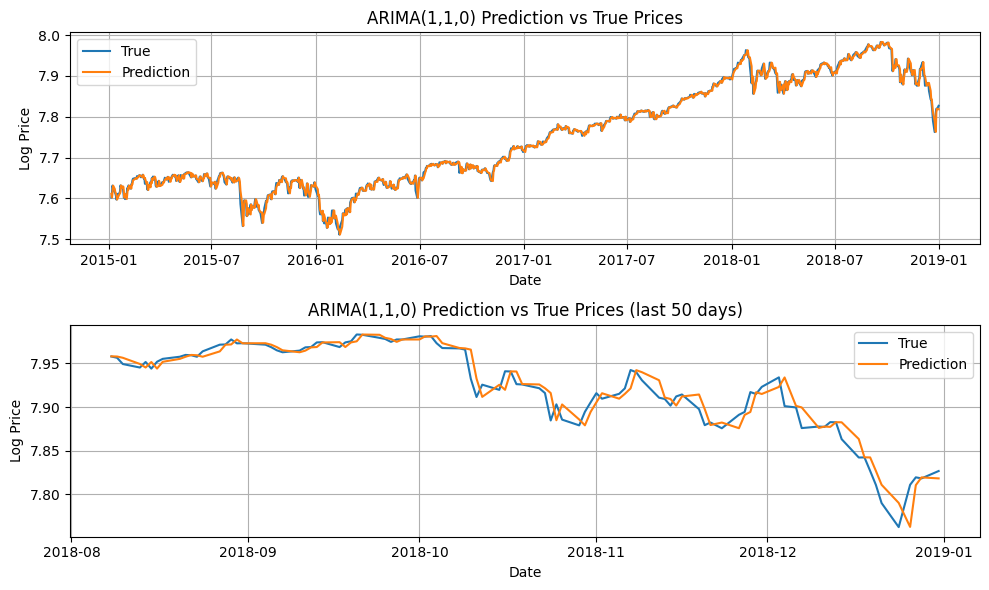

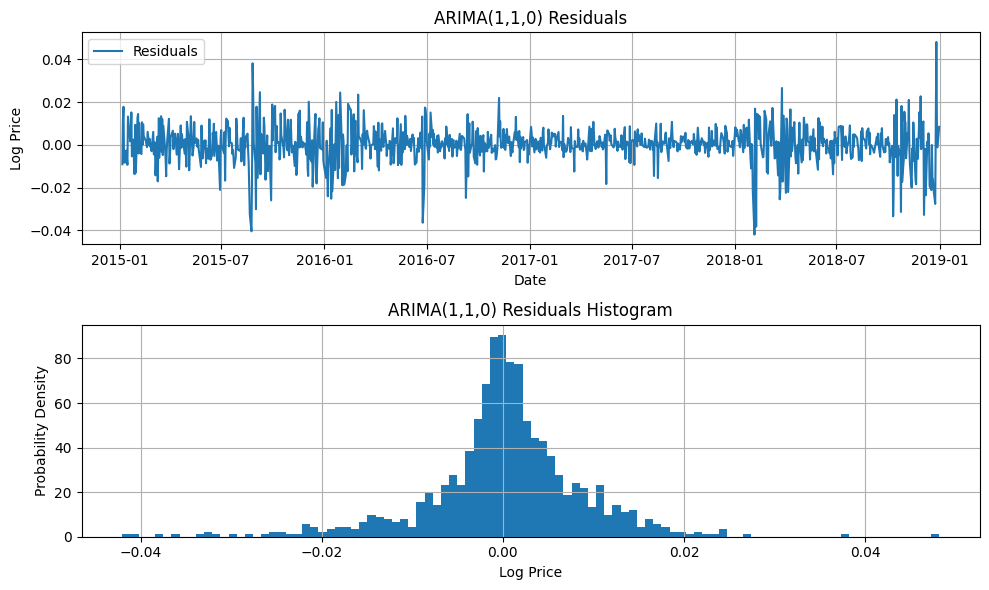

ARIMA params:  
 ar.L1    -0.008170
sigma2    0.000074
dtype: float64


In [418]:
snp_arima = copy.deepcopy(snp_close)
snp_arima.columns = ["True"]
snp_arima["Res"] = ARIMA(snp_arima, order=(1, 1, 0)).fit().resid
snp_arima["Prediction"] = snp_arima["True"] - snp_arima["Res"]

arima10 = ARIMA(snp_arima["True"], order=(1, 1, 0)).fit()

# plot prediction and true signal

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

axs[0].plot(snp_arima["True"][2:], label="True")
axs[0].plot(snp_arima["Prediction"][2:], label="Prediction")
axs[0].set_title("ARIMA(1,1,0) Prediction vs True Prices")
axs[0].set_ylabel("Log Price")
axs[0].set_xlabel("Date")
axs[0].legend()
axs[0].grid(True)

axs[1].plot(snp_arima["True"].tail(100), label="True")
axs[1].plot(snp_arima["Prediction"].tail(100), label="Prediction")
axs[1].set_title("ARIMA(1,1,0) Prediction vs True Prices (last 50 days)")
axs[1].set_ylabel("Log Price")
axs[1].set_xlabel("Date")
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "snp_true&prediction_ARIMA(1,1,0)_withzoom.png")
plt.show()

# plot residuals

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

axs[0].plot(snp_arima["Res"][2:], label="Residuals")
axs[0].set_title("ARIMA(1,1,0) Residuals")
axs[0].set_ylabel("Log Price")
axs[0].set_xlabel("Date")
axs[0].legend()
axs[0].grid(True)

axs[1].hist(snp_arima["Res"][2:], bins=100, density=True)
axs[1].set_title("ARIMA(1,1,0) Residuals Histogram")
axs[1].set_ylabel("Probability Density")
axs[1].set_xlabel("Log Price")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "snp_residuals_ARIMA(1,1,0).png")
plt.show()

print("ARIMA params: ", "\n", arima10.params)

##### 1.2.4

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


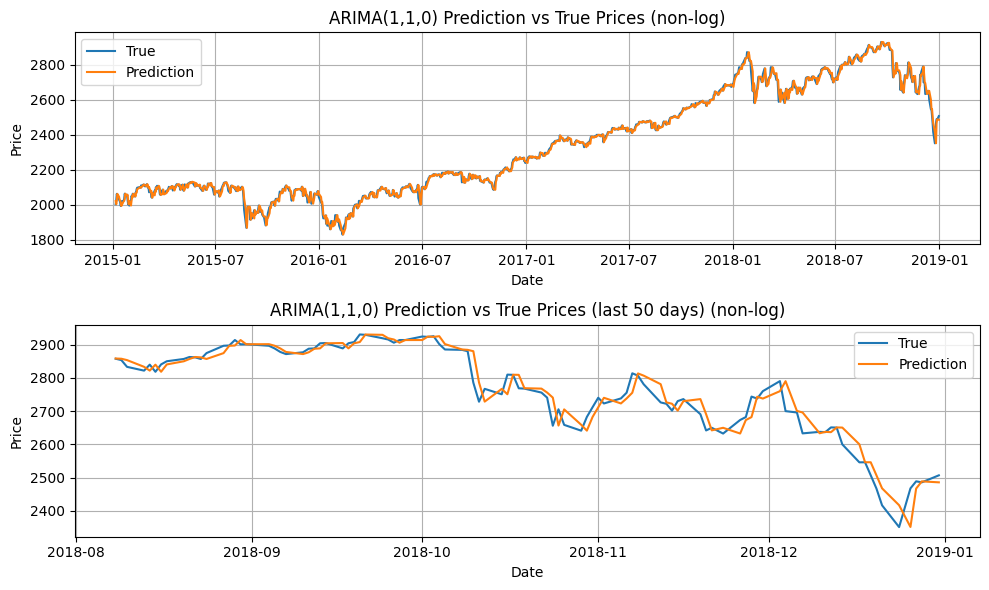

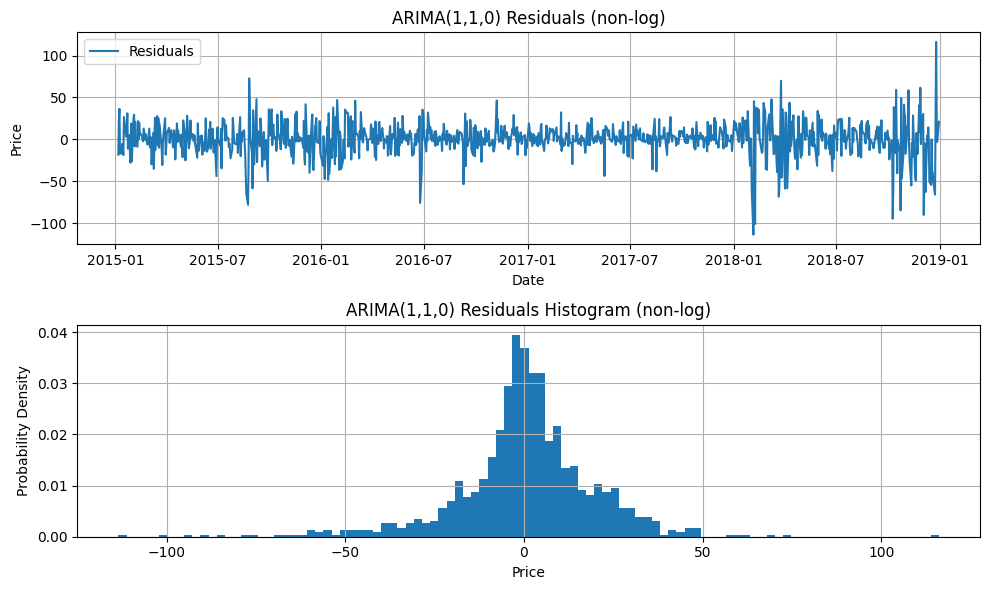

Mean difference between true and prediction non log arima:  2.494580396906667
Mean difference between true and prediction log arima:  0.00019774844471202638


In [420]:
snp_close_nonlog = snp["Close"].to_frame()
snp_arima_nonlog = copy.deepcopy(snp_close_nonlog)
snp_arima_nonlog.columns = ["True"]
snp_arima_nonlog["Res"] = ARIMA(snp_arima_nonlog, order=(1, 1, 0)).fit().resid
snp_arima_nonlog["Prediction"] = snp_arima_nonlog["True"] - snp_arima_nonlog["Res"]


# plot prediction and true signal

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

axs[0].plot(snp_arima_nonlog["True"][2:], label="True")
axs[0].plot(snp_arima_nonlog["Prediction"][2:], label="Prediction")
axs[0].set_title("ARIMA(1,1,0) Prediction vs True Prices (non-log)")
axs[0].set_ylabel("Price")
axs[0].set_xlabel("Date")
axs[0].legend()
axs[0].grid(True)

axs[1].plot(snp_arima_nonlog["True"].tail(100), label="True")
axs[1].plot(snp_arima_nonlog["Prediction"].tail(100), label="Prediction")
axs[1].set_title("ARIMA(1,1,0) Prediction vs True Prices (last 50 days) (non-log)")
axs[1].set_ylabel("Price")
axs[1].set_xlabel("Date")
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "snp_nonlogtrue&prediction_ARIMA(1,1,0)_withzoom.png")
plt.show()

# plot residuals

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

axs[0].plot(snp_arima_nonlog["Res"][2:], label="Residuals")
axs[0].set_title("ARIMA(1,1,0) Residuals (non-log)")
axs[0].set_ylabel("Price")
axs[0].set_xlabel("Date")
axs[0].legend()
axs[0].grid(True)

axs[1].hist(snp_arima_nonlog["Res"][2:], bins=100, density=True)
axs[1].set_title("ARIMA(1,1,0) Residuals Histogram (non-log)")
axs[1].set_ylabel("Probability Density")
axs[1].set_xlabel("Price")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "snp_nonlogresiduals_ARIMA(1,1,0).png")
plt.show()

print(
    "Mean difference between true and prediction non log arima: ",
    np.mean(snp_arima_nonlog["True"] - snp_arima_nonlog["Prediction"]),
)
print(
    "Mean difference between true and prediction log arima: ",
    np.mean(snp_arima[1:]["True"] - snp_arima[1:]["Prediction"]),
)

### 1.3 Vector Autoregressive (VAR) Models

In [ ]:
save_folder = "Section 1 figures/1.3/"

##### 1.3.1, 1.3.2 and 1.3.3 in report

##### 1.3.4

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 08, Apr, 2024
Time:                     20:11:55
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                  -0.646748
Nobs:                     86.0000    HQIC:                  -1.15835
Log likelihood:          -515.518    FPE:                   0.222733
AIC:                     -1.50292    Det(Omega_mle):        0.158978
--------------------------------------------------------------------
Results for equation CAG
            coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------
const          0.143943         0.158856            0.906           0.365
L1.CAG         0.872786         0.058323           14.965           0.000
L1.MAR        -0.063745         0.032407           -1.967           0.049
L1.LIN         0

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


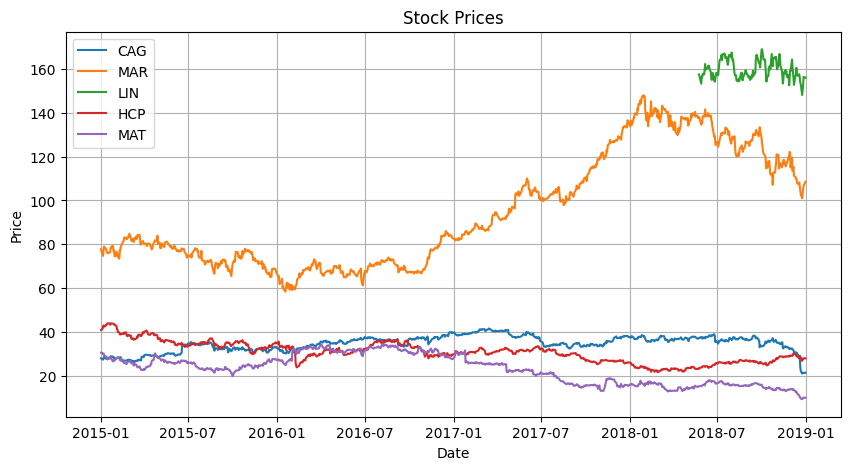

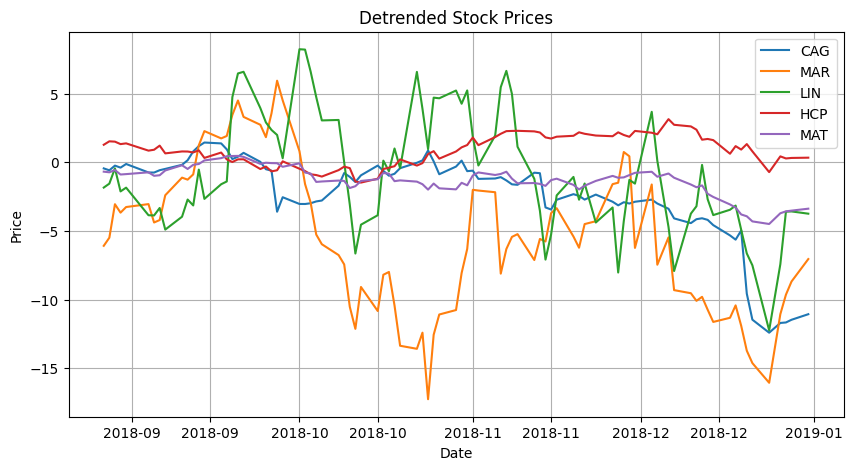

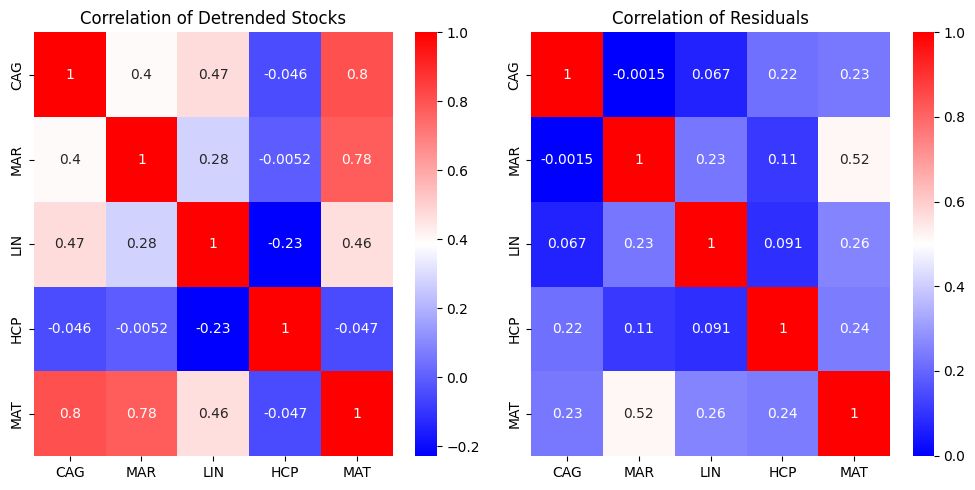

In [421]:
df = pd.read_csv(
    "snp_allstocks_2015_2019.csv"
)  # daily closing prices of all stocks in the S&P 500
df = df.set_index("Date")
df.index = pd.to_datetime(df.index, yearfirst=True, format="%Y-%m-%d")


info = pd.read_csv("snp_info.csv")  # information about the stocks
info.drop(columns=info.columns[0], inplace=True)

tickers = ["CAG", "MAR", "LIN", "HCP", "MAT"]
stocks = df[tickers]
stocks_ma = stocks.rolling(window=66).mean()  # 66 for one quarter
stocks_detrended = stocks.sub(stocks_ma).dropna()  # subtract mean

# fit VAR(1)

model = VAR(stocks_detrended)
results = model.fit(1)
A = results.params[1:].values
eigA, _ = np.linalg.eig(A)

print(results.summary())

print("Model parameters: \n", results.params, "\n")

print("Eigenvalues of A: \n", [e for e in eigA])
print("Absolute values of eigenvalues of A: \n", [abs(e) for e in eigA], "\n")
print("Sector of each stock: \n")
for s in tickers:
    print(s, info[info["Symbol"] == s]["GICS Sector"].values[0])

# plot stocks

plt.figure(figsize=(10, 5))
for i in range(len(tickers)):
    plt.plot(stocks[tickers[i]], label=tickers[i])
plt.title("Stock Prices")
plt.ylabel("Price")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.savefig(save_folder + "stock_prices.png")
plt.show()

plt.figure(figsize=(10, 5))
for i in range(len(tickers)):
    plt.plot(stocks_detrended[tickers[i]], label=tickers[i])
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
plt.title("Detrended Stock Prices")
plt.ylabel("Price")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.savefig(save_folder + "detrended_stock_prices.png")
plt.show()

# correlation of detrended stocks and residuals
corr = stocks_detrended.corr()
residuals = results.resid
corr_res = residuals.corr()


# plot correlations
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(corr, annot=True, cmap="bwr", ax=axs[0])
axs[0].set_title("Correlation of Detrended Stocks")

sns.heatmap(corr_res, annot=True, cmap="bwr", ax=axs[1])
axs[1].set_title("Correlation of Residuals")

plt.tight_layout()
fig.savefig(save_folder + "correlations.png")
plt.show()

##### 1.3.5

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Highest 3 abs correlations in Industrials 
 PH   ROK    0.922885
MMM  ITW    0.886917
RTN  NOC    0.880926
dtype: float64
Lowest 3 abs correlations in Industrials 
 AME  GE      0.001310
HRS  ALK     0.002601
ITW  NLSN    0.003731
dtype: float64
Highest 3 abs correlations in Health Care 
 IDXX  ALGN    0.927620
ISRG  ILMN    0.925703
AGN   CERN    0.925482
dtype: float64
Lowest 3 abs correlations in Health Care 
 ABMD  TMO     0.000037
ZTS   INCY    0.001006
AGN   MCK     0.001833
dtype: float64
Highest 3 abs correlations in Information Technology 
 LRCX  AMAT    0.915511
MA    V       0.880706
      ADBE    0.839538
dtype: float64


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarnin

Lowest 3 abs correlations in Information Technology 
 QCOM  INTC    0.000014
KEYS  RHT     0.000104
RHT   MSI     0.000160
dtype: float64
Highest 3 abs correlations in Communication Services 
 GOOG  GOOGL    0.995032
FOX   FOXA     0.994564
NWS   NWSA     0.990377
dtype: float64
Lowest 3 abs correlations in Communication Services 
 T      GOOGL    0.000147
GOOGL  CBS      0.000853
EA     DIS      0.002256
dtype: float64
Highest 3 abs correlations in Consumer Discretionary 
 UA   UAA    0.959560
MAR  HLT    0.904670
LOW  HD     0.859467
dtype: float64
Lowest 3 abs correlations in Consumer Discretionary 
 VFC   WHR    0.000230
CPRI  CMG    0.000310
HRB   MHK    0.000464
dtype: float64
Highest 3 abs correlations in Utilities 
 AEE  LNT    0.968614
CMS  WEC    0.958105
XEL  ES     0.957941
dtype: float64
Lowest 3 abs correlations in Utilities 
 CMS  EIX    0.003059
ED   AES    0.004814
CNP  EIX    0.005000
dtype: float64


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarnin

Highest 3 abs correlations in Financials 
 BAC  JPM     0.972226
STI  KEY     0.969340
KEY  HBAN    0.960286
dtype: float64
Lowest 3 abs correlations in Financials 
 ETFC  GS      0.000988
GS    CME     0.001895
TRV   SPGI    0.002120
dtype: float64
Highest 3 abs correlations in Materials 
 PKG  WRK     0.978698
     IP      0.971195
SHW  DWDP    0.967710
dtype: float64
Lowest 3 abs correlations in Materials 
 SEE  ALB    0.014120
MLM  AVY    0.014386
SHW  MLM    0.017808
dtype: float64
Highest 3 abs correlations in Real Estate 
 FRT  REG    0.915363
AVB  UDR    0.908013
KIM  FRT    0.887626
dtype: float64
Lowest 3 abs correlations in Real Estate 
 MAA   CBRE    0.003425
MAC   ESS     0.006209
CBRE  FRT     0.007889
dtype: float64
Highest 3 abs correlations in Consumer Staples 
 PG   CLX    0.818984
CLX  HSY    0.801651
KMB  CLX    0.780095
dtype: float64
Lowest 3 abs correlations in Consumer Staples 
 EL   MO     0.001909
SYY  WBA    0.003189
EL   PM     0.005343
dtype: float64
Highes

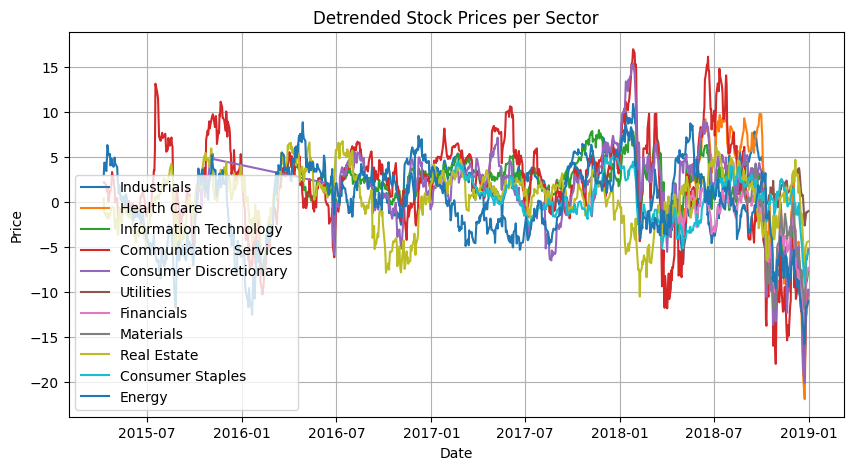

In [422]:
sectors = info["GICS Sector"].unique()
max_abs_eigenvalues = {}
detrended_prices_per_sector = []

for sector in sectors:
    sector_tickers = info.loc[info["GICS Sector"] == sector]["Symbol"].tolist()
    sector_stocks = df[sector_tickers]
    sector_ma = sector_stocks.rolling(window=66).mean()  # 66 for one quarter
    sector_detrended = sector_stocks.sub(sector_ma).dropna()  # subtract mean

    sector_model = VAR(sector_detrended)
    sector_results = sector_model.fit(1)
    sector_A = sector_results.params[1:].values
    sector_eigA, _ = np.linalg.eig(sector_A)
    max_abs_eigenvalues[sector] = max([abs(e) for e in sector_eigA])

    # save prices
    detrended_prices_per_sector.append(sector_detrended)

    corr_matrix = sector_detrended.corr()
    np.fill_diagonal(corr_matrix.values, np.nan)
    print(
        "Highest 3 abs correlations in",
        sector,
        "\n",
        corr_matrix.abs()
        .unstack()
        .sort_values(ascending=False)
        .drop_duplicates()
        .head(3),
    )
    print(
        "Lowest 3 abs correlations in",
        sector,
        "\n",
        corr_matrix.abs()
        .unstack()
        .sort_values(ascending=True)
        .drop_duplicates()
        .head(3),
    )


plt.figure(figsize=(10, 5))
for i in range(len(detrended_prices_per_sector)):
    plt.plot(detrended_prices_per_sector[i].mean(axis=1), label=sectors[i])
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
plt.title("Detrended Stock Prices per Sector")
plt.ylabel("Price")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.savefig(save_folder + "detrended_stock_prices_per_sector.png")

print("Max absolute eigenvalues of A for each sector: \n", max_abs_eigenvalues)

## Section 2 - Bond Pricing

### Sections 2.1, 2.2 and 2.3 in report
    

### 2.4

##### 2.4.1

In [2]:
save_folder = "Section 2 figures/2.4/"

In [4]:
df = pd.read_csv("fsp_case_31_BSD.csv", index_col=0, header=[0, 1])
returns = df["ret"].copy().dropna(axis=1)
returns.index = pd.to_datetime(returns.index, format="%Y-%m-%d")
average_returns = returns.mean(1)  # daily average returns
market_mean = average_returns.mean()
market_std = average_returns.std()
print("market mean:", market_mean)
print("market std:", market_std)

market mean: 4.720252923319845e-05
market std: 0.006650324555998092


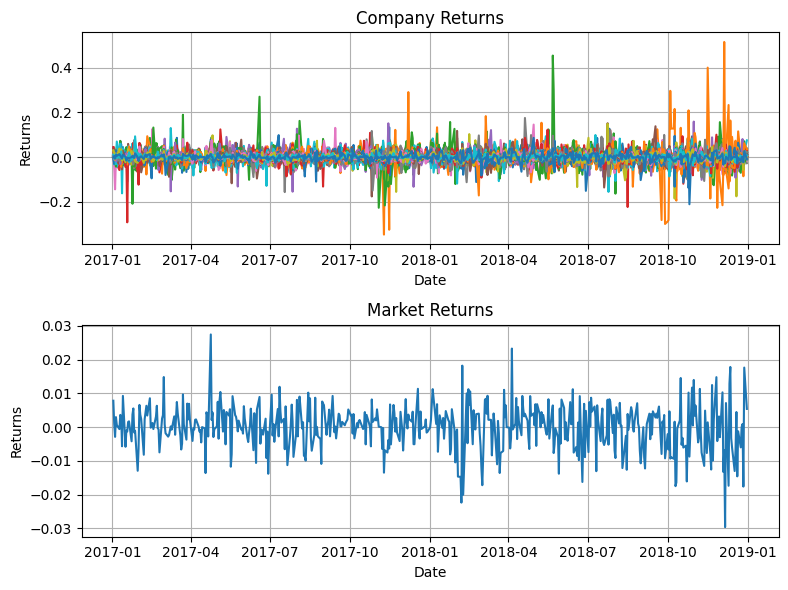

In [61]:
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(returns)
axs[0].set_title("Company Returns")
axs[0].set_ylabel("Returns")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].plot(average_returns)
axs[1].set_title("Market Returns")
axs[1].set_ylabel("Returns")
axs[1].set_xlabel("Date")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "market_returns.png")
plt.show()

##### 2.4.2

In [43]:
w = 22  # rolling window of 22 days (1 month)

returns_market = returns.copy()
returns_market["Market"] = average_returns


betas = pd.DataFrame(index=returns_market.index, columns=returns_market.columns)
betas.drop("Market", axis=1, inplace=True)

for i in range(len(returns_market) - w + 1):
    curr_window = returns_market.iloc[i : i + w]
    curr_cov = curr_window.cov()
    curr_cov_market = curr_cov["Market"]
    curr_betas = curr_cov_market / curr_cov_market["Market"]
    curr_betas.drop("Market", inplace=True)

    betas.iloc[i + w - 1] = curr_betas

betas.dropna(inplace=True)

beta_means = betas.mean(axis=0)
print("Mean beta value:", beta_means.mean())

Mean beta value: 0.9999999999999998


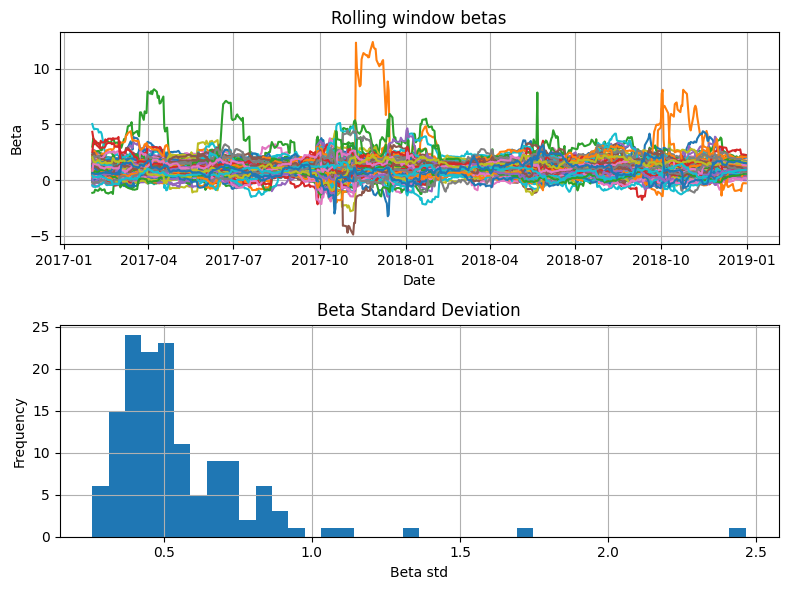

In [11]:
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(betas)
axs[0].set_title("Rolling window betas")
axs[0].set_ylabel("Beta")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].hist(betas.std(0), bins=40)
axs[1].set_title("Beta Standard Deviation")
axs[1].set_ylabel("Frequency")
axs[1].set_xlabel("Beta std")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "RollingWindowBetas.png")
plt.show()

##### 2.4.3

In [19]:
caps = df["mcap"].copy()
caps.index = pd.to_datetime(caps.index, format="%Y-%m-%d")
caps = caps[returns.columns]  # drop na cols in returns

weights = caps.div(caps.sum(axis=1), axis=0)  # weights of each stock in the market

ret_temp = returns.copy()
weighted_returns = ret_temp.mul(weights)
weighted_market_ret = weighted_returns.sum(axis=1)

print("Market weighted returns mean:", weighted_market_ret.mean())
print("Market weighted returns std:", weighted_market_ret.std())

Market weighted returns mean: 0.00018841990142144172
Market weighted returns std: 0.006599318685834846


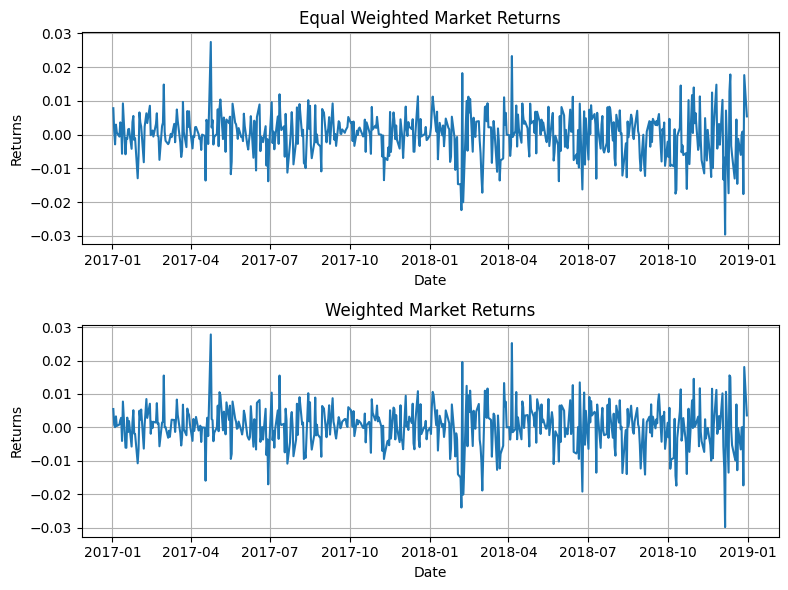

In [25]:
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(average_returns)
axs[0].set_title("Equal Weighted Market Returns")
axs[0].set_ylabel("Returns")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].plot(weighted_market_ret)
axs[1].set_title("Weighted Market Returns")
axs[1].set_ylabel("Returns")
axs[1].set_xlabel("Date")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "weighted_market_returns.png")
plt.show()

##### 2.4.4


In [78]:
w = 22  # rolling window of 22 days (1 month)

w_returns_market = returns.copy()
w_returns_market["Market"] = weighted_market_ret.copy()


betas_rolling = pd.DataFrame(
    index=w_returns_market.index, columns=w_returns_market.columns, dtype="float64"
)
betas_rolling.drop("Market", axis=1, inplace=True)

for i in range(len(weighted_returns) - w + 1):
    curr_window = w_returns_market.iloc[i : i + w]
    curr_cov = curr_window.cov()
    curr_cov_market = curr_cov["Market"]
    curr_betas = curr_cov_market / curr_cov_market["Market"]
    curr_betas.drop("Market", inplace=True)

    betas_rolling.iloc[i + w - 1] = curr_betas

betas_rolling.dropna(inplace=True)

betas_rolling_means = betas_rolling.mean(axis=0)
print("Mean beta value (weighted):", betas_rolling_means.mean())

Mean beta value (weighted): 0.9613858109298643


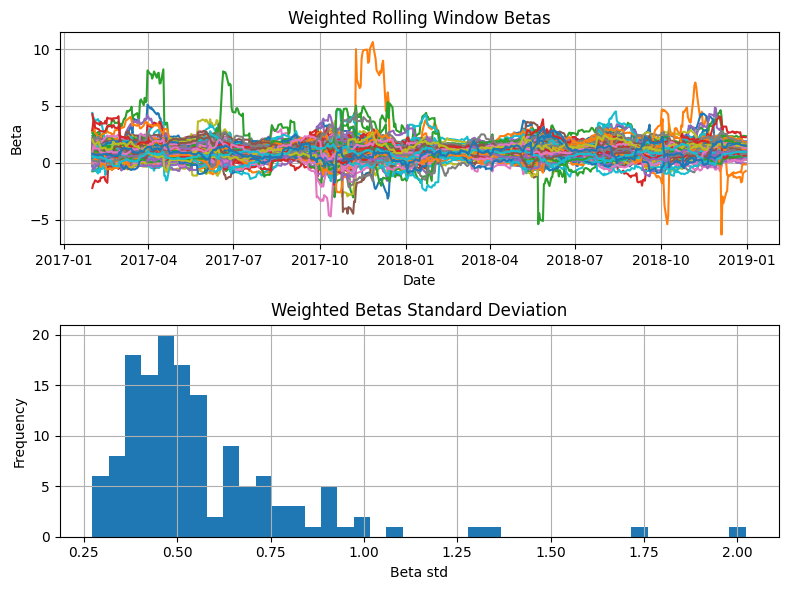

In [38]:
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(betas_rolling)
axs[0].set_title("Weighted Rolling Window Betas")
axs[0].set_ylabel("Beta")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].hist(betas_rolling.std(0), bins=40)
axs[1].set_title("Weighted Betas Standard Deviation")
axs[1].set_ylabel("Frequency")
axs[1].set_xlabel("Beta std")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "WeightedRollingWindowBetas.png")
plt.show()

##### 2.4.5

##### 2.4.5.a

In [88]:
returns_regression = returns.copy()
returns_regression = returns_regression.loc[
    betas_rolling.index
]  # get rid of dates not in windowing

caps_regression = caps.copy()
caps_regression = caps_regression.loc[
    betas_rolling.index
]  # get rid of dates not in windowing

betas_size = np.log(caps_regression)

# np.array vs pd.series - series lets you index by name, array doesn't

Rm = pd.Series(index=returns_regression.index)
Rs = pd.Series(index=returns_regression.index)
a = pd.Series(index=returns_regression.index)
eps = pd.DataFrame(index=returns_regression.index, columns=returns_regression.columns)

# go day by day
for i in returns_regression.index:
    returns_day = returns_regression.loc[i].values.reshape(
        -1, 1
    )  # put into 141x1 array
    betas_day = betas_rolling.loc[i].values.reshape(-1, 1)  # put into 141x1 array
    betas_size_day = betas_size.loc[i].values.reshape(-1, 1)  # put into 141x1 array

    ones = np.ones((len(returns_day), 1))
    X = np.concatenate([ones, betas_day, betas_size_day], axis=1)

    theta = (np.linalg.inv(X.T @ X) @ X.T) @ returns_day

    a[i] = theta[0]
    Rm[i] = theta[1]
    Rs[i] = theta[2]
    eps.loc[i] = (returns_day - X @ theta).reshape(1, -1)  # 141x1 array

##### 2.4.5.b

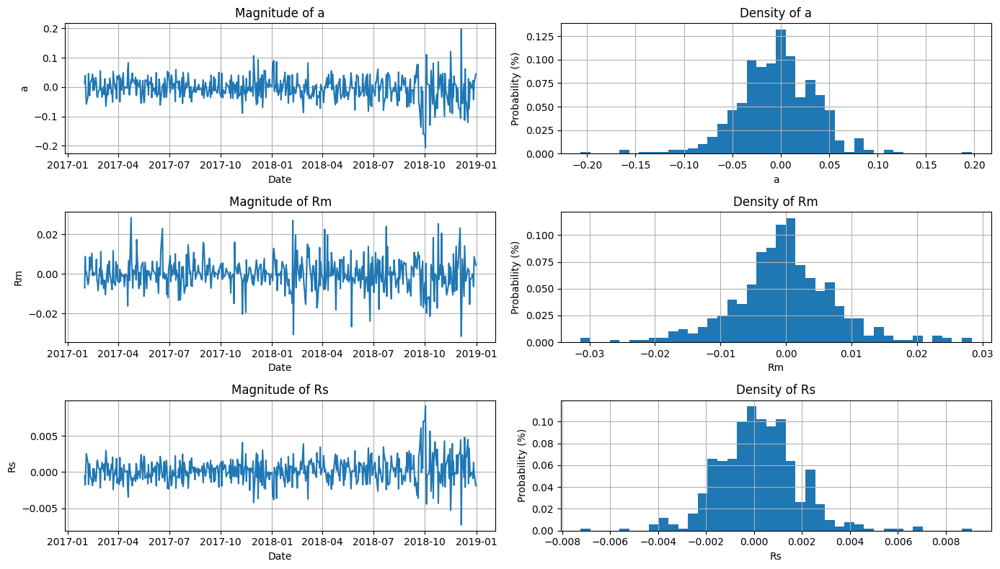

In [115]:
afrequencies, abins = np.histogram(a, bins=40)
aprobabilities = afrequencies / afrequencies.sum()
abin_centers = 0.5 * (abins[1:] + abins[:-1])

rmfrequencies, rmbins = np.histogram(Rm, bins=40)
rmprobabilities = rmfrequencies / rmfrequencies.sum()
rmbin_centers = 0.5 * (rmbins[1:] + rmbins[:-1])

rsfrequencies, rsbins = np.histogram(Rs, bins=40)
rsprobabilities = rsfrequencies / rsfrequencies.sum()
rsbin_centers = 0.5 * (rsbins[1:] + rsbins[:-1])

fig, axs = plt.subplots(3, 2, figsize=(14, 8))

axs[0, 0].plot(a)
axs[0, 0].set_title("Magnitude of a")
axs[0, 0].set_ylabel("a")
axs[0, 0].set_xlabel("Date")
axs[0, 0].grid(True)

axs[1, 0].plot(Rm)
axs[1, 0].set_title("Magnitude of Rm")
axs[1, 0].set_ylabel("Rm")
axs[1, 0].set_xlabel("Date")
axs[1, 0].grid(True)

axs[2, 0].plot(Rs)
axs[2, 0].set_title("Magnitude of Rs")
axs[2, 0].set_ylabel("Rs")
axs[2, 0].set_xlabel("Date")
axs[2, 0].grid(True)

axs[0, 1].bar(abin_centers, aprobabilities, align="center", width=np.diff(abins))
axs[0, 1].set_title("Density of a")
axs[0, 1].set_ylabel("Probability (%)")
axs[0, 1].set_xlabel("a")
axs[0, 1].grid(True)

axs[1, 1].bar(rmbin_centers, rmprobabilities, align="center", width=np.diff(rmbins))
axs[1, 1].set_title("Density of Rm")
axs[1, 1].set_ylabel("Probability (%)")
axs[1, 1].set_xlabel("Rm")
axs[1, 1].grid(True)

axs[2, 1].bar(rsbin_centers, rsprobabilities, align="center", width=np.diff(rsbins))
axs[2, 1].set_title("Density of Rs")
axs[2, 1].set_ylabel("Probability (%)")
axs[2, 1].set_xlabel("Rs")
axs[2, 1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "magnitudeandhistofreturns.png")
plt.show()

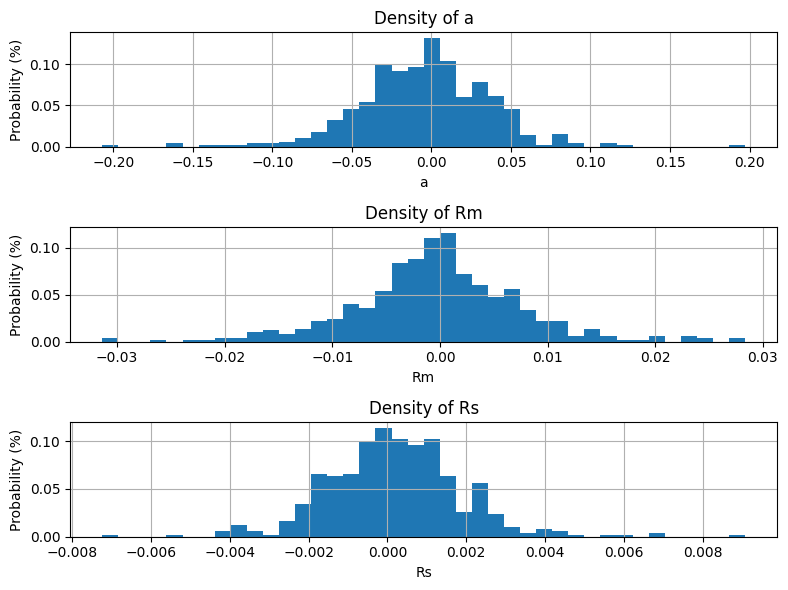

In [113]:
afrequencies, abins = np.histogram(a, bins=40)
aprobabilities = afrequencies / afrequencies.sum()
abin_centers = 0.5 * (abins[1:] + abins[:-1])

rmfrequencies, rmbins = np.histogram(Rm, bins=40)
rmprobabilities = rmfrequencies / rmfrequencies.sum()
rmbin_centers = 0.5 * (rmbins[1:] + rmbins[:-1])

rsfrequencies, rsbins = np.histogram(Rs, bins=40)
rsprobabilities = rsfrequencies / rsfrequencies.sum()
rsbin_centers = 0.5 * (rsbins[1:] + rsbins[:-1])

fig, axs = plt.subplots(3, 1, figsize=(8, 6))

axs[0].bar(abin_centers, aprobabilities, align="center", width=np.diff(abins))
axs[0].set_title("Density of a")
axs[0].set_ylabel("Probability (%)")
axs[0].set_xlabel("a")
axs[0].grid(True)

axs[1].bar(rmbin_centers, rmprobabilities, align="center", width=np.diff(rmbins))
axs[1].set_title("Density of Rm")
axs[1].set_ylabel("Probability (%)")
axs[1].set_xlabel("Rm")
axs[1].grid(True)

axs[2].bar(rsbin_centers, rsprobabilities, align="center", width=np.diff(rsbins))
axs[2].set_title("Density of Rs")
axs[2].set_ylabel("Probability (%)")
axs[2].set_xlabel("Rs")
axs[2].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "histogramofreturns.png")
plt.show()

##### 2.4.5.c

In [140]:
specific_returns_corr = pd.Series(index=eps.columns)
for company in eps.columns:
    q = returns_regression[company]
    correl = pearsonr(eps[company], returns_regression[company])  # corrcoef didn't work
    specific_returns_corr[company] = correl[0]

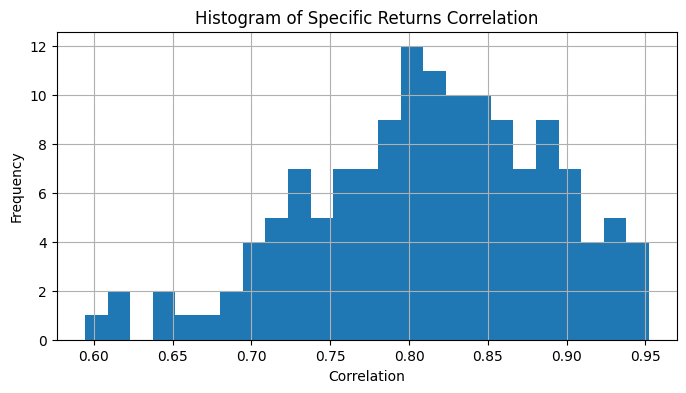

In [153]:
plt.figure(figsize=(8, 4))
plt.hist(specific_returns_corr, bins=25)
plt.title("Histogram of Specific Returns Correlation")
plt.ylabel("Frequency")
plt.xlabel("Correlation")
plt.grid(True)
plt.savefig(save_folder + "specific_returns_corr_hist.png")
plt.show()

##### 2.4.5.d

In [220]:
w = 22

R = pd.DataFrame({"Rm": Rm, "Rs": Rs})

cov_R_rolling = []

for i in range(len(R) - w + 1):
    curr_window = R.iloc[i : i + w]
    curr_cov = curr_window.cov()  # is a dataframe, cant put into another df
    cov_R_rolling.append(curr_cov)

cov_R_rolling_array = np.stack(cov_R_rolling, axis=0)  # 479x2x2 - a 2x2 cov per day

mag = []
stability = []
stability2 = []
stab3 = []
for j in range(cov_R_rolling_array.shape[0]):
    mag.append(np.linalg.norm(cov_R_rolling_array[j]))
    stability.append(np.linalg.eig(cov_R_rolling_array[j])[0])
    stability2.append(np.linalg.cond(cov_R_rolling_array[j]))
    try:
        stab3.append(np.linalg.det(cov_R_rolling_array[j]))
    except:
        print("cant invert covar matrix")

mag = pd.Series(mag, index=R.index[w - 1 :])
stability = np.array(stability).reshape(-1, 1)
stability2 = np.array(stability2)
print("Mean magnitude of covariance matrix:", mag.mean())
print("Mean eigenvalue:", stability.mean())
print("Mean condition number:", stability2.mean())

Mean magnitude of covariance matrix: 6.479041445797203e-05
Mean eigenvalue: 3.358660066470629e-05
Mean condition number: 32.99745131835632


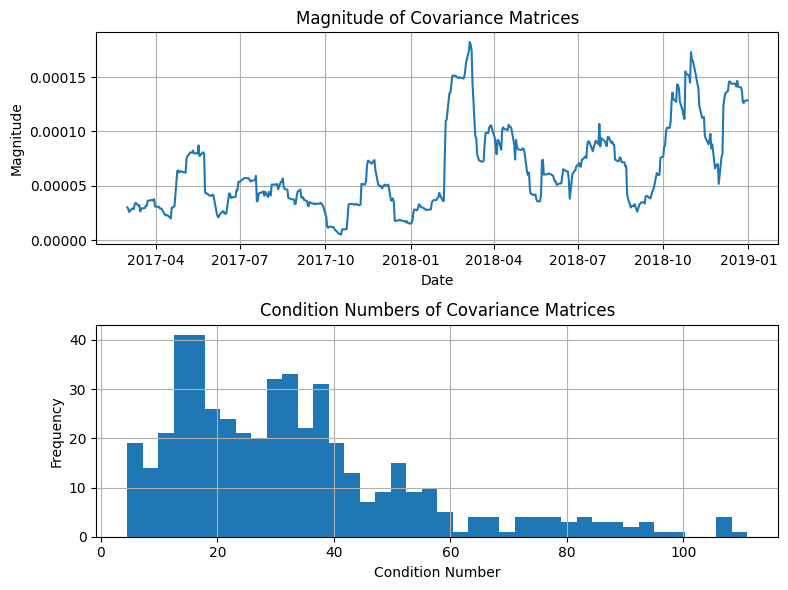

In [217]:
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(mag)
axs[0].set_title("Magnitude of Covariance Matrices")
axs[0].set_ylabel("Magnitude")
axs[0].set_xlabel("Date")
axs[0].grid(True)

axs[1].hist(stability2, bins=40)
axs[1].set_title("Condition Numbers of Covariance Matrices")
axs[1].set_ylabel("Frequency")
axs[1].set_xlabel("Condition Number")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "magnitude&condnums_covariance.png")
plt.show()

##### 2.4.5.e

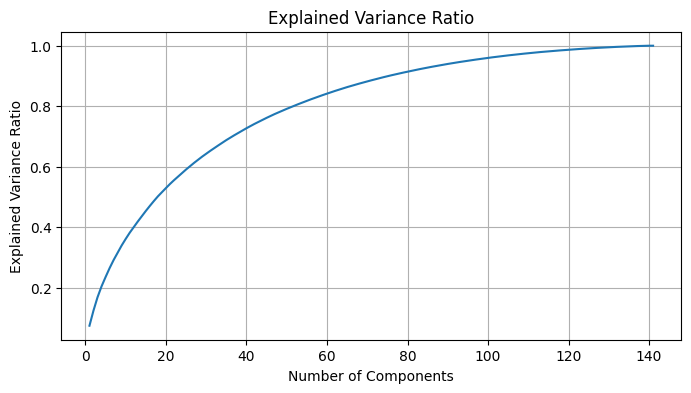

[0.07372197373910958, 0.12385264575781843, 0.16775597967060923, 0.20387516967668928, 0.2346853029108432, 0.2641691469320745, 0.291074680697075, 0.3155262582868253, 0.339274180417606, 0.3608927547908563, 0.38136951585929746, 0.40012989544299515, 0.41834442847808767, 0.43587856854054124, 0.45338338138905193, 0.47011043568181987, 0.48624427359658406, 0.5016883678537443, 0.5155706723229782, 0.5291910052783441, 0.542624415223996, 0.5551354354938167, 0.5670979971242716, 0.5789329901496597, 0.5905830825384003, 0.601827318231546, 0.6126003582152689, 0.6230779288027005, 0.6331803866722523, 0.6427291251676396, 0.6521826719520087, 0.6613120797408548, 0.670251274543464, 0.6791227328935668, 0.6878602943837677, 0.696099775937573, 0.7040368918766212, 0.7118467476253326, 0.7195492698417041, 0.7270741367458505, 0.7343153944007756, 0.7414227127680811, 0.7481502170167322, 0.7548156128432878, 0.7613918156437078, 0.767855421544671, 0.7739387265304326, 0.7797983115686893, 0.7855600491762552, 0.7912153661621

In [278]:
# in question pdf E is 500x157, but I dropped stocks with nan values meaning I have 141 stocks

E_cov = eps.cov()
eigenvals, eigenvecs = np.linalg.eigh(E_cov)  # use eigh as sorted

# need to use covariance matrix, so cant use sklearn pca
# pca = PCA()
# pca.fit(eps)

# reverse
sorted_inds = np.argsort(eigenvals)[::-1]
sorted_eigenvals = eigenvals[sorted_inds]
total_var = sorted_eigenvals.sum()

var_ratio = []
comps = np.arange(1, 142)  # Up to 141 components

for comp in comps:
    # Sum of the first 'num' eigenvalues
    eigenvals_sum = sorted_eigenvals[:comp].sum()
    # Ratio of explained variance
    ratio = eigenvals_sum / total_var
    var_ratio.append(ratio)


print(var_ratio)

var_first_component = sorted_eigenvals[0] / total_var
var_2_components = sorted_eigenvals[:2].sum() / total_var
print("Percentage variance explained by first component:", var_first_component * 100)
print("Percentage variance explained by first 2 components:", var_2_components * 100)

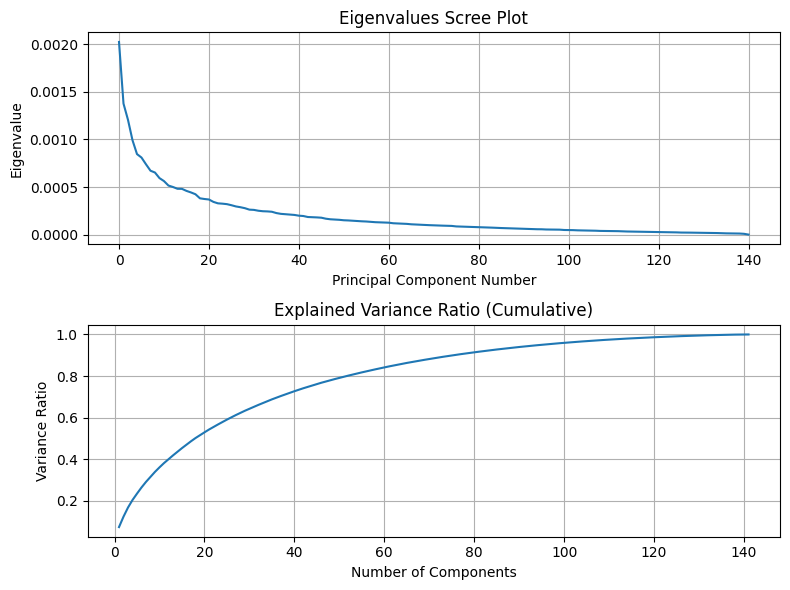

In [290]:
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

axs[0].plot(eigenvals[::-1])
axs[0].set_title("Eigenvalues Scree Plot")
axs[0].set_ylabel("Eigenvalue")
axs[0].set_xlabel("Principal Component Number")
axs[0].grid(True)

axs[1].plot(comps, var_ratio)
axs[1].set_title("Explained Variance Ratio (Cumulative)")
axs[1].set_ylabel("Variance Ratio")
axs[1].set_xlabel("Number of Components")
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "eigenvalues&explained_variance_ratio.png")
plt.show()

## Section 3 - Portfolio Optimization

In [3]:
save_folder = "Section 3 figures/3.1/"

### 3.1

##### 3.1.1 in report

##### 3.1.2

In [4]:
df = pd.read_csv("fsp_case_31_BSD.csv", index_col=0, header=[0, 1])
returns = df["ret"].copy().dropna(axis=1)
returns.index = pd.to_datetime(returns.index, format="%Y-%m-%d")
returns = returns.iloc[:, -10:]  # last 10 stocks

split_point = returns.shape[0] // 2
train = returns.iloc[:split_point, :]
test = returns.iloc[split_point:, :]

In [5]:
# equal weighted portfolio
equal_port_train = train.mean(axis=1)
equal_port_test = test.mean(axis=1)
cumul_equal_port_train = equal_port_train.cumsum().copy()
cumul_equal_port_test = equal_port_test.cumsum().copy()

# min variance portfolio
train_C = train.cov()
train_C_inv = np.linalg.inv(train_C)
ones = np.ones((train_C.shape[0], 1))

opt_weights = (1 / (ones.T @ train_C_inv @ ones)) * train_C_inv @ ones

min_var_port_train = (train @ opt_weights).sum(axis=1)
min_var_port_test = (test @ opt_weights).sum(axis=1)
cumul_min_var_port_train = min_var_port_train.cumsum().copy()
cumul_min_var_port_test = min_var_port_test.cumsum().copy()

equal_train_analysis = pd.Series(
    index=["Mean return", "Cumulative return", "Variance", "Sharpe ratio"]
)
equal_test_analysis = pd.Series(
    index=["Mean return", "Cumulative return", "Variance", "Sharpe ratio"]
)
min_var_train_analysis = pd.Series(
    index=["Mean return", "Cumulative return", "Variance", "Sharpe ratio"]
)
min_var_test_analysis = pd.Series(
    index=["Mean return", "Cumulative return", "Variance", "Sharpe ratio"]
)
theoretical_min_var_train = 1 / (ones.T @ train_C_inv @ ones)


equal_train_analysis["Mean return"] = equal_port_train.mean()
equal_train_analysis["Cumulative return"] = cumul_equal_port_train[-1]
equal_train_analysis["Variance"] = equal_port_train.var()
equal_train_analysis["Sharpe ratio"] = (
    equal_port_train.mean() / equal_port_train.std()
)  # taking a risk-free rate of 0 for ease

equal_test_analysis["Mean return"] = equal_port_test.mean()
equal_test_analysis["Cumulative return"] = cumul_equal_port_test[-1]
equal_test_analysis["Variance"] = equal_port_test.var()
equal_test_analysis["Sharpe ratio"] = equal_port_test.mean() / equal_port_test.std()

min_var_train_analysis["Mean return"] = min_var_port_train.mean()
min_var_train_analysis["Cumulative return"] = cumul_min_var_port_train[-1]
min_var_train_analysis["Variance"] = min_var_port_train.var()
min_var_train_analysis["Sharpe ratio"] = (
    min_var_port_train.mean() / min_var_port_train.std()
)

min_var_test_analysis["Mean return"] = min_var_port_test.mean()
min_var_test_analysis["Cumulative return"] = cumul_min_var_port_test[-1]
min_var_test_analysis["Variance"] = min_var_port_test.var()
min_var_test_analysis["Sharpe ratio"] = (
    min_var_port_test.mean() / min_var_port_test.std()
)

print("Equal weighted portfolio train analysis: \n", equal_train_analysis)
print("Equal weighted portfolio test analysis: \n", equal_test_analysis)
print("Minimum variance portfolio train analysis: \n", min_var_train_analysis)
print("Minimum variance portfolio test analysis: \n", min_var_test_analysis)
print("Theoretical minimum variance for train:", theoretical_min_var_train)

Equal weighted portfolio train analysis: 
 Mean return          0.000860
Cumulative return    0.223484
Variance             0.000037
Sharpe ratio         0.140374
dtype: float64
Equal weighted portfolio test analysis: 
 Mean return         -0.000473
Cumulative return   -0.123503
Variance             0.000079
Sharpe ratio        -0.053126
dtype: float64
Minimum variance portfolio train analysis: 
 Mean return          0.000958
Cumulative return    0.249062
Variance             0.000029
Sharpe ratio         0.179072
dtype: float64
Minimum variance portfolio test analysis: 
 Mean return         -0.000451
Cumulative return   -0.117582
Variance             0.000082
Sharpe ratio        -0.049774
dtype: float64
Theoretical minimum variance for train: [[2.86162941e-05]]


/var/folders/4q/9v2wk3r55hl8qk2pnsrbd1vc0000gn/T/ipykernel_71737/2179145809.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equal_train_analysis['Cumulative return'] = cumul_equal_port_train[-1]
/var/folders/4q/9v2wk3r55hl8qk2pnsrbd1vc0000gn/T/ipykernel_71737/2179145809.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equal_test_analysis['Cumulative return'] = cumul_equal_port_test[-1]
/var/folders/4q/9v2wk3r55hl8qk2pnsrbd1vc0000gn/T/ipykernel_71737/2179145809.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels 

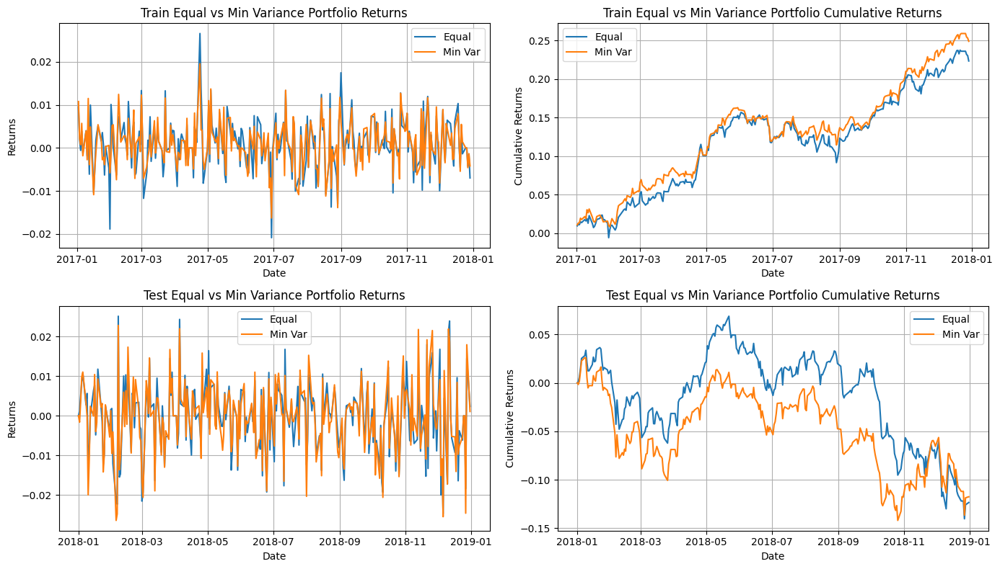

In [341]:
fig, axs = plt.subplots(2, 2, figsize=(14, 8))

axs[0, 0].plot(equal_port_train)
axs[0, 0].plot(min_var_port_train)
axs[0, 0].set_title("Train Equal vs Min Variance Portfolio Returns")
axs[0, 0].set_ylabel("Returns")
axs[0, 0].set_xlabel("Date")
axs[0, 0].legend(["Equal", "Min Var"])
axs[0, 0].grid(True)

axs[0, 1].plot(cumul_equal_port_train)
axs[0, 1].plot(cumul_min_var_port_train)
axs[0, 1].set_title("Train Equal vs Min Variance Portfolio Cumulative Returns")
axs[0, 1].set_ylabel("Cumulative Returns")
axs[0, 1].set_xlabel("Date")
axs[0, 1].legend(["Equal", "Min Var"])
axs[0, 1].grid(True)

axs[1, 0].plot(equal_port_test)
axs[1, 0].plot(min_var_port_test)
axs[1, 0].set_title("Test Equal vs Min Variance Portfolio Returns")
axs[1, 0].set_ylabel("Returns")
axs[1, 0].set_xlabel("Date")
axs[1, 0].legend(["Equal", "Min Var"])
axs[1, 0].grid(True)

axs[1, 1].plot(cumul_equal_port_test)
axs[1, 1].plot(cumul_min_var_port_test)
axs[1, 1].set_title("Test Equal vs Min Variance Portfolio Cumulative Returns")
axs[1, 1].set_ylabel("Cumulative Returns")
axs[1, 1].set_xlabel("Date")
axs[1, 1].legend(["Equal", "Min Var"])
axs[1, 1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "equalvsminvarportfolios.png")
plt.show()

##### 3.1.3

In [44]:
windows = [22, 66, 132, 252]  # 1 month, 3 months, 6 months, 1 year

all_adaptive_port_returns = []
all_adaptive_weights = []
adaptive_port_analysis = pd.DataFrame(
    index=["1 month", "3 months", "6 months", "12 months"],
    columns=["Mean return", "Cumulative return", "Variance", "Sharpe ratio"],
)

for idx, window in enumerate(windows):
    adapt_min_var_port = pd.Series()
    adapt_opt_weights = []
    for t in test.index:
        curr_window = returns.loc[:t].iloc[
            -window - 1 : -1
        ]  # get from returns up to t, then get last window days
        curr_C = curr_window.cov()
        curr_C_inv = np.linalg.inv(curr_C)
        ones = np.ones((curr_C.shape[0], 1))
        curr_opt_weights = (1 / (ones.T @ curr_C_inv @ ones)) * curr_C_inv @ ones

        adapt_opt_weights.append(curr_opt_weights)
        adapt_min_var_port.loc[t] = (test.loc[t] @ curr_opt_weights).sum()

    all_adaptive_port_returns.append(adapt_min_var_port)
    all_adaptive_weights.append(adapt_opt_weights)

    index_labels = {0: "1 month", 1: "3 months", 2: "6 months", 3: "12 months"}
    idx = index_labels[idx]
    adaptive_port_analysis.loc[idx, "Mean return"] = adapt_min_var_port.mean()
    adaptive_port_analysis.loc[idx, "Cumulative return"] = (
        adapt_min_var_port.cumsum().iloc[-1]
    )
    adaptive_port_analysis.loc[idx, "Variance"] = adapt_min_var_port.var()
    adaptive_port_analysis.loc[idx, "Sharpe ratio"] = (
        adapt_min_var_port.mean() / adapt_min_var_port.std()
    )


adaptive_port_variances = [port.var() for port in all_adaptive_port_returns]
adaptive_port_variances = pd.Series(
    adaptive_port_variances, index=["1 month", "3 months", "6 months", "1 year"]
)
print("Adaptive portfolio variances: \n", adaptive_port_variances)

adaptive_port_analysis

'Adaptive portfolio variances: \n'

1 month     0.000108
3 months    0.000074
6 months    0.000070
1 year      0.000066
dtype: float64

,Mean return,Cumulative return,Variance,Sharpe ratio
1 month,0.000286,0.074774,0.000108,0.027537
3 months,0.000104,0.02719,0.000074,0.012113
6 months,-0.000244,-0.063607,0.00007,-0.029152
12 months,-0.000436,-0.113804,0.000066,-0.053534


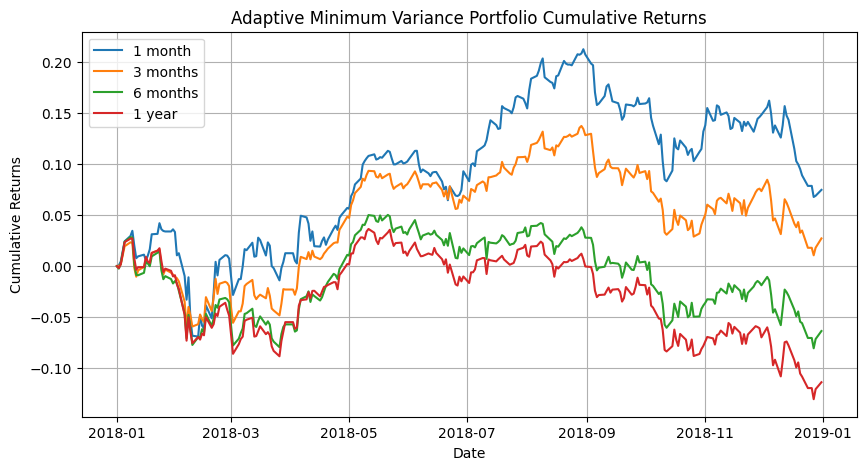

In [422]:
plt.figure(figsize=(10, 5))
plt.plot(test.index, all_adaptive_port_returns[0].cumsum(), label="1 month")
plt.plot(test.index, all_adaptive_port_returns[1].cumsum(), label="3 months")
plt.plot(test.index, all_adaptive_port_returns[2].cumsum(), label="6 months")
plt.plot(test.index, all_adaptive_port_returns[3].cumsum(), label="1 year")
plt.title("Adaptive Minimum Variance Portfolio Cumulative Returns")
plt.ylabel("Cumulative Returns")
plt.xlabel("Date")
plt.legend()
plt.grid(True)

plt.savefig(save_folder + "adaptive_min_var_portfolios.png")
plt.show()

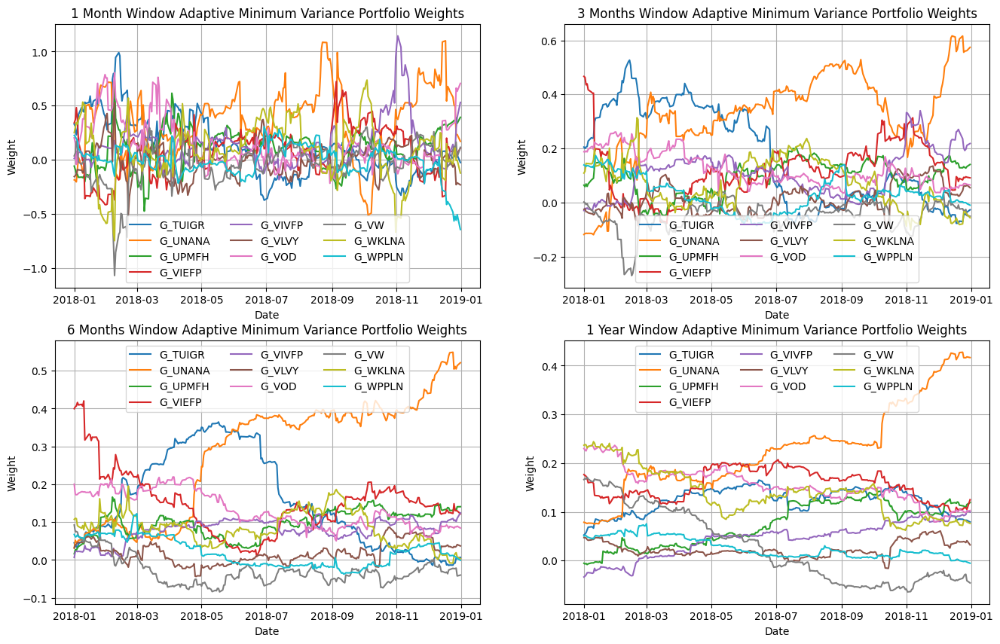

In [448]:
one_month_weights = pd.DataFrame(
    index=test.index,
    columns=test.columns,
    data=np.array(all_adaptive_weights[0]).squeeze(),
)
three_month_weights = pd.DataFrame(
    index=test.index,
    columns=test.columns,
    data=np.array(all_adaptive_weights[1]).squeeze(),
)
six_month_weights = pd.DataFrame(
    index=test.index,
    columns=test.columns,
    data=np.array(all_adaptive_weights[2]).squeeze(),
)
one_year_weights = pd.DataFrame(
    index=test.index,
    columns=test.columns,
    data=np.array(all_adaptive_weights[3]).squeeze(),
)

fig, axs = plt.subplots(2, 2, figsize=(16, 10))

axs[0, 0].plot(one_month_weights)
axs[0, 0].set_title("1 Month Window Adaptive Minimum Variance Portfolio Weights")
axs[0, 0].set_ylabel("Weight")
axs[0, 0].set_xlabel("Date")
axs[0, 0].legend(
    test.columns, loc="lower center", bbox_to_anchor=(0.5, 0), ncol=3, fancybox=True
)
axs[0, 0].grid(True)

axs[0, 1].plot(three_month_weights)
axs[0, 1].set_title("3 Months Window Adaptive Minimum Variance Portfolio Weights")
axs[0, 1].set_ylabel("Weight")
axs[0, 1].set_xlabel("Date")
axs[0, 1].legend(
    test.columns, loc="lower center", bbox_to_anchor=(0.5, 0), ncol=3, fancybox=True
)
axs[0, 1].grid(True)

axs[1, 0].plot(six_month_weights)
axs[1, 0].set_title("6 Months Window Adaptive Minimum Variance Portfolio Weights")
axs[1, 0].set_ylabel("Weight")
axs[1, 0].set_xlabel("Date")
axs[1, 0].legend(
    test.columns, loc="upper center", bbox_to_anchor=(0.5, 1.0), ncol=3, fancybox=True
)
axs[1, 0].grid(True)

axs[1, 1].plot(one_year_weights)
axs[1, 1].set_title("1 Year Window Adaptive Minimum Variance Portfolio Weights")
axs[1, 1].set_ylabel("Weight")
axs[1, 1].set_xlabel("Date")
axs[1, 1].legend(
    test.columns, loc="upper center", bbox_to_anchor=(0.5, 1.0), ncol=3, fancybox=True
)
axs[1, 1].grid(True)

plt.savefig(save_folder + "adaptive_portfolio_weights")
plt.show()

## Section 4 - Robust Statistics and Non Linear Methods

In [138]:
save_folder = "Section 4 figures/4.1/"

### 4.1 Data Import and Exploratory Data Analysis

##### 4.1.1

In [664]:
aapl = pd.read_csv("AAPL.csv", index_col=0)
aapl.index = pd.to_datetime(aapl.index, format="%Y-%m-%d")
ibm = pd.read_csv("IBM.csv", index_col=0)
ibm.index = pd.to_datetime(ibm.index, format="%Y-%m-%d")
jpm = pd.read_csv("JPM.csv", index_col=0)
jpm.index = pd.to_datetime(jpm.index, format="%Y-%m-%d")
dji = pd.read_csv("DJI.csv", index_col=0)
dji.index = pd.to_datetime(dji.index, format="%Y-%m-%d")

tickers = [aapl, ibm, jpm, dji]
tickers_names = ["AAPL", "IBM", "JPM", "DJI"]
desc_stats = {}

for i, ticker in enumerate(tickers):
    stats = pd.DataFrame(
        index=[
            "Mean",
            "Median",
            "Max",
            "Min",
            "25%",
            "75%",
            "IQR",
            "Stddev",
            "Skewness",
            "Kurtosis",
        ],
        columns=ticker.columns,
    )
    stats.loc["Mean"] = ticker.mean()
    stats.loc["Median"] = ticker.median()
    stats.loc["Max"] = ticker.max()
    stats.loc["Min"] = ticker.min()
    stats.loc["25%"] = ticker.quantile(0.25)
    stats.loc["75%"] = ticker.quantile(0.75)
    stats.loc["IQR"] = stats.loc["75%"] - stats.loc["25%"]
    stats.loc["Stddev"] = ticker.std()
    stats.loc["Skewness"] = ticker.skew()
    stats.loc["Kurtosis"] = ticker.kurtosis()
    desc_stats[tickers_names[i]] = stats

    ticker["Returns"] = ticker["Close"].pct_change()  # add returns column

In [84]:
for key in desc_stats.keys():
    print(key)
    display(desc_stats[key])

AAPL


,Open,High,Low,Close,Adj Close,Volume
Mean,187.686694,189.561753,185.823705,187.711953,186.174273,32704750.199203
Median,186.289993,187.399994,184.940002,186.119995,184.351776,29184000.0
Max,230.779999,233.470001,229.779999,232.070007,230.275482,96246700.0
Min,143.979996,145.720001,142.0,142.190002,141.582779,12513900.0
25%,171.319999,173.035004,169.724998,171.004998,170.214981,22887350.0
75%,207.32,209.375,205.784996,207.760002,205.900421,39199050.0
IQR,36.0,36.339996,36.059998,36.755004,35.68544,16311700.0
Stddev,22.145621,22.281577,22.008797,22.160721,21.904664,14179721.592994
Skewness,0.259917,0.300385,0.220489,0.263849,0.29077,1.743317
Kurtosis,-0.912594,-0.924602,-0.917632,-0.932425,-0.928017,4.353182


IBM


,Open,High,Low,Close,Adj Close,Volume
Mean,138.454382,139.492072,137.329243,138.363108,134.902751,5198937.450199
Median,142.809998,143.990005,142.059998,142.710007,138.566391,4237900.0
Max,160.059998,162.0,159.639999,160.910004,153.671936,22063700.0
Min,108.0,111.0,105.940002,107.57,106.331108,1963200.0
25%,131.269996,132.555001,129.224998,130.880005,127.745647,3436050.0
75%,146.649994,147.275002,145.565002,146.385002,141.849586,5389000.0
IQR,15.379998,14.720001,16.340004,15.504997,14.103938,1952950.0
Stddev,12.114308,11.913079,12.204633,12.028123,10.671648,3328955.530426
Skewness,-0.676024,-0.622707,-0.713446,-0.682246,-0.811222,3.192896
Kurtosis,-0.585272,-0.623607,-0.561975,-0.584037,-0.420852,11.796897


JPM


,Open,High,Low,Close,Adj Close,Volume
Mean,108.707689,109.652072,107.682988,108.606574,107.26259,14700689.243028
Median,109.18,110.529999,107.790001,109.019997,107.219269,13633000.0
Max,119.129997,119.239998,118.080002,118.629997,116.856049,41313900.0
Min,92.690002,94.220001,91.110001,92.139999,91.397758,6488400.0
25%,104.554997,105.419998,103.699997,104.509998,104.14,10812900.0
75%,113.365002,114.265,112.544998,113.344997,111.362442,17046500.0
IQR,8.810006,8.845002,8.845001,8.834999,7.222442,6233600.0
Stddev,5.359081,5.20287,5.432537,5.30048,4.833316,5349770.564456
Skewness,-0.420811,-0.376221,-0.377517,-0.374853,-0.344491,1.693457
Kurtosis,-0.322536,-0.544163,-0.2657,-0.396579,-0.105437,4.430197


DJI


,Open,High,Low,Close,Adj Close,Volume
Mean,25001.257268,25142.041965,24846.002226,24999.153581,24999.153581,332889442.231076
Median,25025.580078,25124.099609,24883.039063,25044.289063,25044.289063,313790000.0
Max,26833.470703,26951.810547,26789.080078,26828.390625,26828.390625,900510000.0
Min,21857.730469,22339.869141,21712.529297,21792.199219,21792.199219,155940000.0
25%,24485.610352,24614.274414,24275.590821,24433.089844,24433.089844,270100000.0
75%,25595.044922,25692.090821,25480.009765,25591.245117,25591.245117,379030000.0
IQR,1109.43457,1077.816406,1204.418945,1158.155273,1158.155273,108930000.0
Stddev,858.834708,815.203959,903.302186,859.132105,859.132105,94078038.14115
Skewness,-0.372127,-0.239367,-0.456447,-0.380147,-0.380147,1.73956
Kurtosis,0.485736,0.118153,0.557592,0.400668,0.400668,5.857581


##### 4.1.2

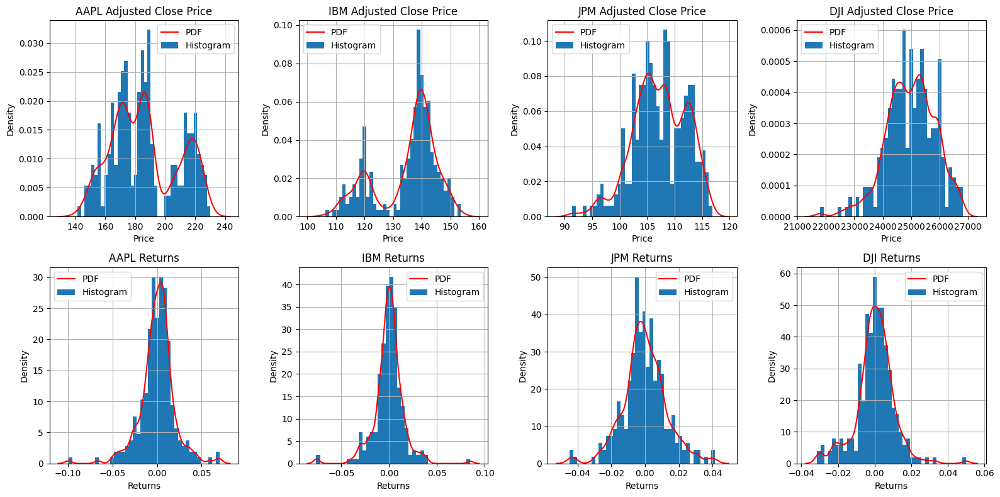

In [155]:
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

for i, ticker in enumerate(tickers):
    adj_close = ticker["Adj Close"]
    adj_close.dropna(inplace=True)
    returns = ticker["Returns"]
    returns.dropna(inplace=True)

    # plot hist for adj close
    axs[0, i].hist(adj_close, bins=40, density=True)
    # plot pdf for adj close
    sns.kdeplot(adj_close, ax=axs[0, i], color="r", bw_adjust=0.6)
    axs[0, i].set_title(tickers_names[i] + " Adjusted Close Price")
    axs[0, i].set_ylabel("Density")
    axs[0, i].set_xlabel("Price")
    axs[0, i].grid(True)
    axs[0, i].legend(["PDF", "Histogram"])

    # plot hist for returns
    axs[1, i].hist(returns, bins=40, density=True)
    # plot pdf for returns
    sns.kdeplot(returns, ax=axs[1, i], color="r", bw_adjust=0.6)
    axs[1, i].set_title(tickers_names[i] + " Returns")
    axs[1, i].set_ylabel("Density")
    axs[1, i].set_xlabel("Returns")
    axs[1, i].grid(True)
    axs[1, i].legend(["PDF", "Histogram"])

plt.tight_layout()
fig.savefig(save_folder + "stocks_histograms.png")
plt.show()

##### 4.1.3

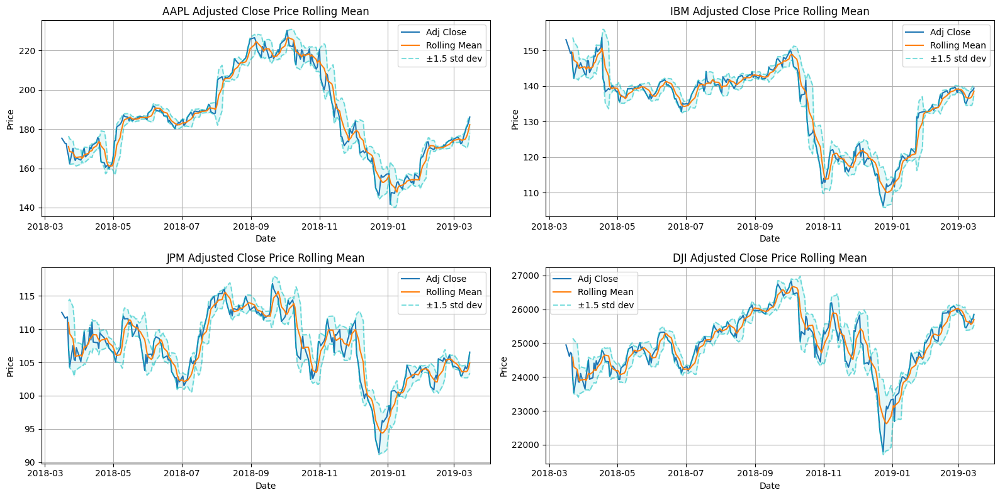

,Outliers
AAPL,30
IBM,31
JPM,33
DJI,30


In [251]:
w = 5

num_outliers_mean = pd.DataFrame(index=tickers_names, columns=["Outliers"])

# rolling mean
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for i, ticker in enumerate(tickers):
    adj_close = ticker["Adj Close"].dropna()
    adj_close_mean = adj_close.rolling(window=w).mean()

    row = i // 2
    col = i % 2

    axs[row, col].plot(adj_close.index, adj_close)
    axs[row, col].plot(adj_close.index, adj_close_mean)
    axs[row, col].plot(
        adj_close.index,
        adj_close_mean + 1.5 * adj_close.rolling(window=w).std(),
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].plot(
        adj_close.index,
        adj_close_mean - 1.5 * adj_close.rolling(window=w).std(),
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].fill_between(
        adj_close.index,
        adj_close.rolling(window=w).mean() + 1.5 * adj_close.rolling(window=w).std(),
        adj_close.rolling(window=w).mean() - 1.5 * adj_close.rolling(window=w).std(),
        color="c",
        alpha=0.1,
    )

    axs[row, col].set_title(tickers_names[i] + " Adjusted Close Price Rolling Mean")
    axs[row, col].set_ylabel("Price")
    axs[row, col].set_xlabel("Date")
    axs[row, col].legend(["Adj Close", "Rolling Mean", "±1.5 std dev"])

    axs[row, col].grid(True)

    num_outliers_mean.loc[tickers_names[i]] = adj_close[
        (adj_close - adj_close_mean).abs() > 1.5 * adj_close.rolling(window=w).std()
    ].shape[0]

plt.tight_layout()
fig.savefig(save_folder + "rolling_mean.png")
plt.show()

num_outliers_mean

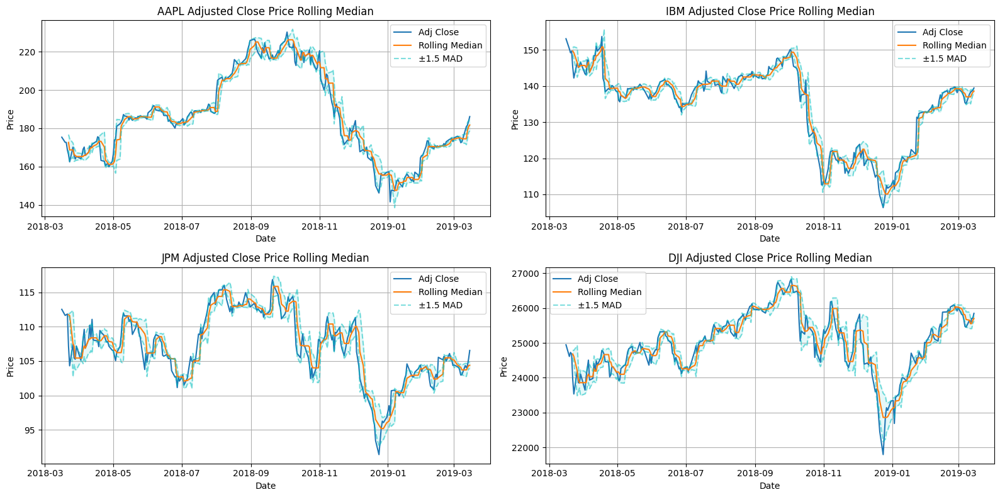

,Outliers
AAPL,103
IBM,94
JPM,105
DJI,97


In [252]:
# rolling median


def mad_(x):
    return median_abs_deviation(x)


num_outliers_median = pd.DataFrame(index=tickers_names, columns=["Outliers"])

fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for i, ticker in enumerate(tickers):
    adj_close = ticker["Adj Close"].dropna()
    adj_close_median = adj_close.rolling(window=w).median()
    MAD = adj_close.rolling(window=w).apply(mad_, raw=True)

    row = i // 2
    col = i % 2

    axs[row, col].plot(adj_close.index, adj_close)
    axs[row, col].plot(adj_close.index, adj_close_median)
    axs[row, col].plot(
        adj_close.index,
        adj_close_median + 1.5 * MAD,
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].plot(
        adj_close.index,
        adj_close_median - 1.5 * MAD,
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].fill_between(
        adj_close.index,
        adj_close_median + 1.5 * MAD,
        adj_close_median - 1.5 * MAD,
        color="c",
        alpha=0.1,
    )

    axs[row, col].set_title(tickers_names[i] + " Adjusted Close Price Rolling Median")
    axs[row, col].set_ylabel("Price")
    axs[row, col].set_xlabel("Date")
    axs[row, col].legend(["Adj Close", "Rolling Median", "±1.5 MAD"])

    axs[row, col].grid(True)

    num_outliers_median.loc[tickers_names[i]] = adj_close[
        (adj_close - adj_close_median).abs() > 1.5 * MAD
    ].shape[0]

plt.tight_layout()
fig.savefig(save_folder + "rolling_median.png")
plt.show()

num_outliers_median

##### 4.1.4

In [256]:
add_dates = ["2018-05-14", "2018-09-14", "2018-12-14", "2019-01-14"]

aug_closes = []
for ticker in tickers:
    aug_adj_close = ticker["Adj Close"].copy()
    max_val = 1.2 * aug_adj_close.max()
    for date in add_dates:
        aug_adj_close.loc[date] = max_val
    aug_closes.append(aug_adj_close)

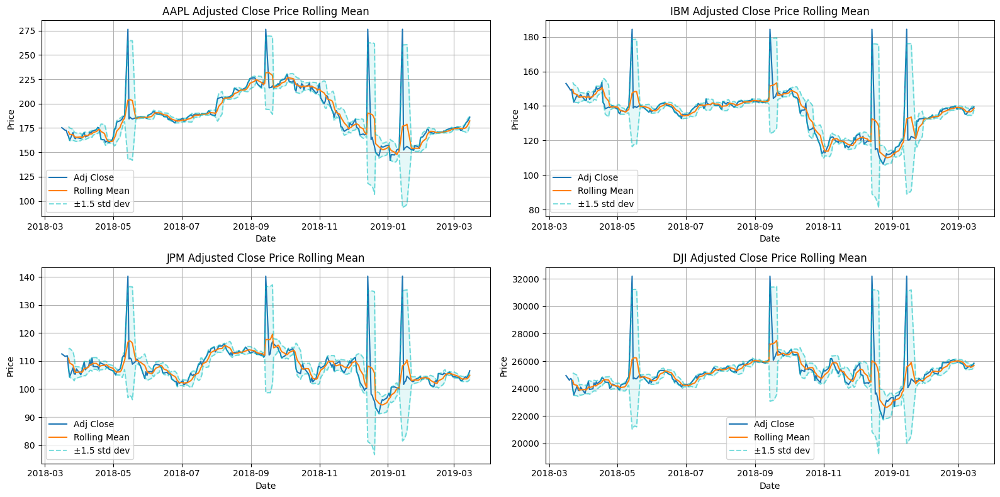

,Outliers
AAPL,32
IBM,31
JPM,33
DJI,29


In [257]:
w = 5

num_outliers_mean_aug = pd.DataFrame(index=tickers_names, columns=["Outliers"])

# rolling mean
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for i, ticker in enumerate(tickers):
    adj_close = aug_closes[i].dropna()
    adj_close_mean = adj_close.rolling(window=w).mean()

    row = i // 2
    col = i % 2

    axs[row, col].plot(adj_close.index, adj_close)
    axs[row, col].plot(adj_close.index, adj_close_mean)
    axs[row, col].plot(
        adj_close.index,
        adj_close_mean + 1.5 * adj_close.rolling(window=w).std(),
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].plot(
        adj_close.index,
        adj_close_mean - 1.5 * adj_close.rolling(window=w).std(),
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].fill_between(
        adj_close.index,
        adj_close.rolling(window=w).mean() + 1.5 * adj_close.rolling(window=w).std(),
        adj_close.rolling(window=w).mean() - 1.5 * adj_close.rolling(window=w).std(),
        color="c",
        alpha=0.1,
    )

    axs[row, col].set_title(tickers_names[i] + " Adjusted Close Price Rolling Mean")
    axs[row, col].set_ylabel("Price")
    axs[row, col].set_xlabel("Date")
    axs[row, col].legend(["Adj Close", "Rolling Mean", "±1.5 std dev"])

    axs[row, col].grid(True)

    num_outliers_mean_aug.loc[tickers_names[i]] = adj_close[
        (adj_close - adj_close_mean).abs() > 1.5 * adj_close.rolling(window=w).std()
    ].shape[0]

plt.tight_layout()
fig.savefig(save_folder + "rolling_mean_outliers.png")
plt.show()

num_outliers_mean_aug

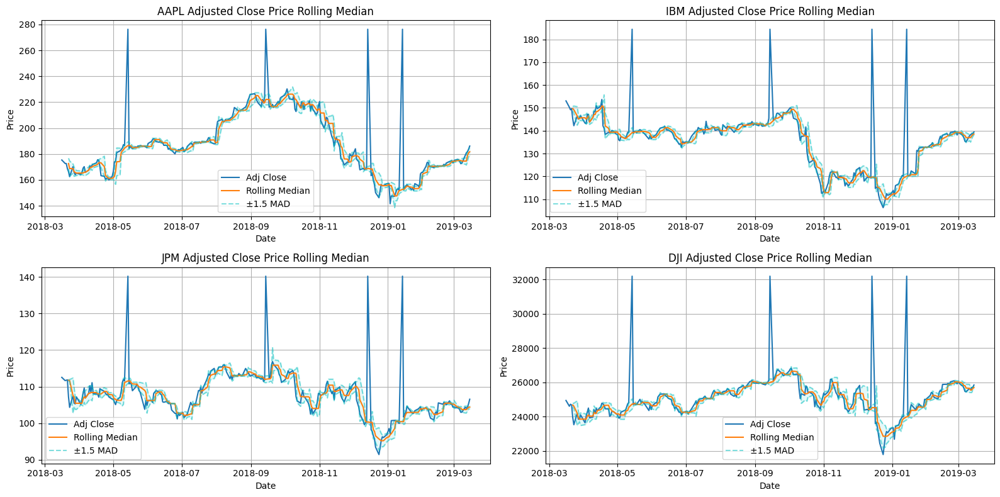

,Outliers
AAPL,102
IBM,93
JPM,101
DJI,96


In [258]:
# rolling median


def mad_(x):
    return median_abs_deviation(x)


num_outliers_median_aug = pd.DataFrame(index=tickers_names, columns=["Outliers"])

fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for i, ticker in enumerate(tickers):
    adj_close = aug_closes[i].dropna()
    adj_close_median = adj_close.rolling(window=w).median()
    MAD = adj_close.rolling(window=w).apply(mad_, raw=True)

    row = i // 2
    col = i % 2

    axs[row, col].plot(adj_close.index, adj_close)
    axs[row, col].plot(adj_close.index, adj_close_median)
    axs[row, col].plot(
        adj_close.index,
        adj_close_median + 1.5 * MAD,
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].plot(
        adj_close.index,
        adj_close_median - 1.5 * MAD,
        linestyle="--",
        color="c",
        alpha=0.5,
    )
    axs[row, col].fill_between(
        adj_close.index,
        adj_close_median + 1.5 * MAD,
        adj_close_median - 1.5 * MAD,
        color="c",
        alpha=0.1,
    )

    axs[row, col].set_title(tickers_names[i] + " Adjusted Close Price Rolling Median")
    axs[row, col].set_ylabel("Price")
    axs[row, col].set_xlabel("Date")
    axs[row, col].legend(["Adj Close", "Rolling Median", "±1.5 MAD"])

    axs[row, col].grid(True)

    num_outliers_median_aug.loc[tickers_names[i]] = adj_close[
        (adj_close - adj_close_median).abs() > 1.5 * MAD
    ].shape[0]

plt.tight_layout()
fig.savefig(save_folder + "rolling_median_outliers.png")
plt.show()

num_outliers_median_aug

##### 4.1.5

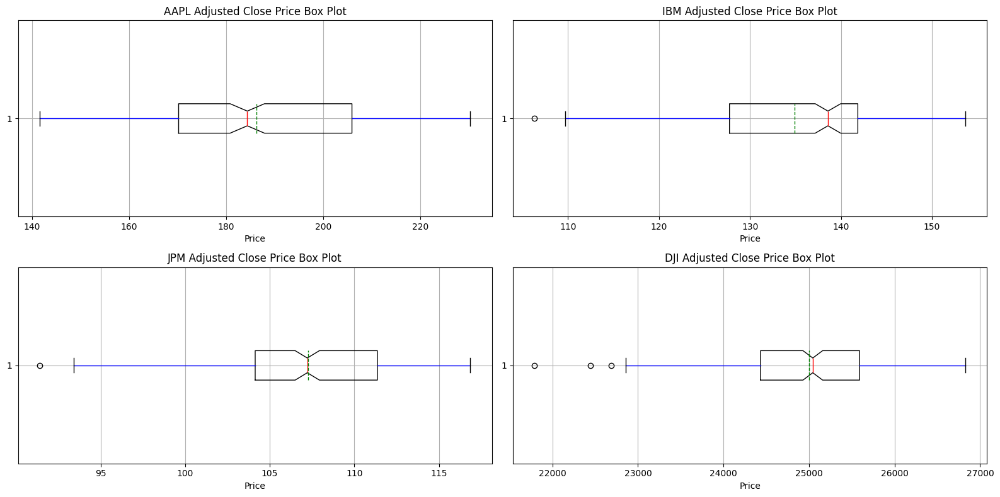

In [288]:
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

for i, ticker in enumerate(tickers):
    adj_close = ticker["Adj Close"].dropna()

    row = i // 2
    col = i % 2

    axs[row, col].boxplot(
        adj_close,
        vert=False,
        notch=True,
        showmeans=True,
        whiskerprops=dict(color="b"),
        medianprops=dict(color="r"),
        meanline=True,
        meanprops=dict(color="g"),
    )
    axs[row, col].set_title(tickers_names[i] + " Adjusted Close Price Box Plot")

    axs[row, col].set_xlabel("Price")
    axs[row, col].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "boxplots.png")
plt.show()

### 4.2 - Robust Estimators

In [443]:
save_folder = "Section 4 figures/4.2/"

##### 4.2.1

In [434]:
def calc_median(x):
    sorted = x.sort_values()
    n = len(sorted)
    if n % 2 == 0:
        median = (
            sorted.iloc[n // 2] + sorted.iloc[n // 2 - 1]
        ) / 2  # average of two middle values
    else:
        median = sorted.iloc[n // 2]  # middle value
    return median


def calc_IQR(x, exclusive=True):
    sorted = x.sort_values().values.astype(float)
    n = len(sorted)

    if n % 2 == 0:
        if exclusive:
            lowerhalf = sorted[: n // 2]
            upperhalf = sorted[n // 2 :]
            q1 = calc_median(pd.Series(lowerhalf))
            q3 = calc_median(pd.Series(upperhalf))
            IQR = q3 - q1
        else:
            # doesnt make much sense to use this - here for completeness but inclusive IQR for even n is not used.
            median = (sorted[n // 2] + sorted[n // 2 - 1]) / 2
            lowerhalf = np.append(sorted[: n // 2], median)
            upperhalf = np.insert(sorted[n // 2 :], 0, median)
            n = len(lowerhalf)
            q1 = (lowerhalf[n // 2] + lowerhalf[n // 2 - 1]) / 2
            q3 = (upperhalf[n // 2] + upperhalf[n // 2 - 1]) / 2
            IQR = q3 - q1

    else:
        if exclusive:
            lowerhalf = sorted[: n // 2]
            upperhalf = sorted[n // 2 + 1 :]
            q1 = lowerhalf[n // 4]
            q3 = upperhalf[n // 4]
            IQR = q3 - q1
        else:
            median = sorted[n // 2]
            lowerhalf = np.append(sorted[: n // 2], median)
            upperhalf = np.insert(sorted[n // 2 + 1 :], 0, median)
            q1 = calc_median(pd.Series(lowerhalf))
            q3 = calc_median(pd.Series(upperhalf))
            IQR = q3 - q1

    return IQR


def calc_MAD(x):
    median = calc_median(x)
    MAD = calc_median((x - median).abs())

    return MAD

In [441]:
compare = pd.DataFrame(
    index=tickers_names,
    columns=[
        "Median",
        "My Median",
        "IQR",
        "My IQR (exclusive)",
        "My IQR (inclusive)",
        "MAD",
        "My MAD",
    ],
)

for i, ticker in enumerate(tickers):
    adj_close = ticker["Adj Close"].dropna()
    median = adj_close.median()
    IQR = iqr(adj_close, interpolation="midpoint")
    MAD = median_abs_deviation(adj_close)
    my_median = calc_median(adj_close)
    my_IQR_exclusive = calc_IQR(adj_close)
    my_IQR_inclusive = calc_IQR(adj_close, exclusive=False)
    my_MAD = calc_MAD(adj_close)

    compare.loc[tickers_names[i]] = [
        median,
        my_median,
        IQR,
        my_IQR_exclusive,
        my_IQR_inclusive,
        MAD,
        my_MAD,
    ]

compare

,Median,My Median,IQR,My IQR (exclusive),My IQR (inclusive),MAD,My MAD
AAPL,184.351776,184.351776,35.68544,35.715225,35.68544,15.476044,15.476044
IBM,138.566391,138.566391,14.103938,14.435798,14.103938,4.493515,4.493515
JPM,107.219269,107.219269,7.222442,7.279045,7.222442,3.450157,3.450157
DJI,25044.289063,25044.289063,1158.155273,1175.480468,1158.155273,590.720703,590.720703


##### 4.2.3 in report

### 4.3 - Robust and OLS Regression

In [444]:
save_folder = "Section 4 figures/4.3/"

##### 4.3.1

,Beta,Alpha
AAPL,1.326490,0.000104
IBM,0.961954,-0.000624
JPM,0.938374,-0.000420


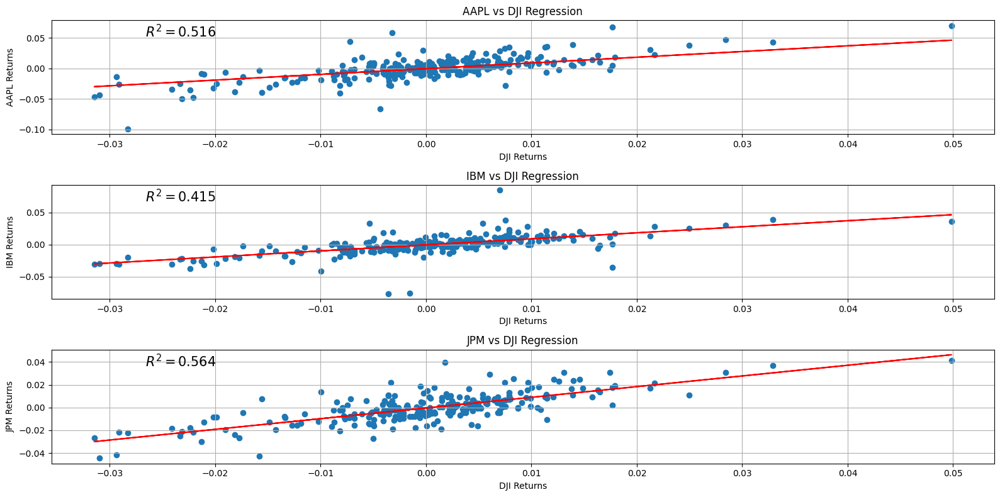

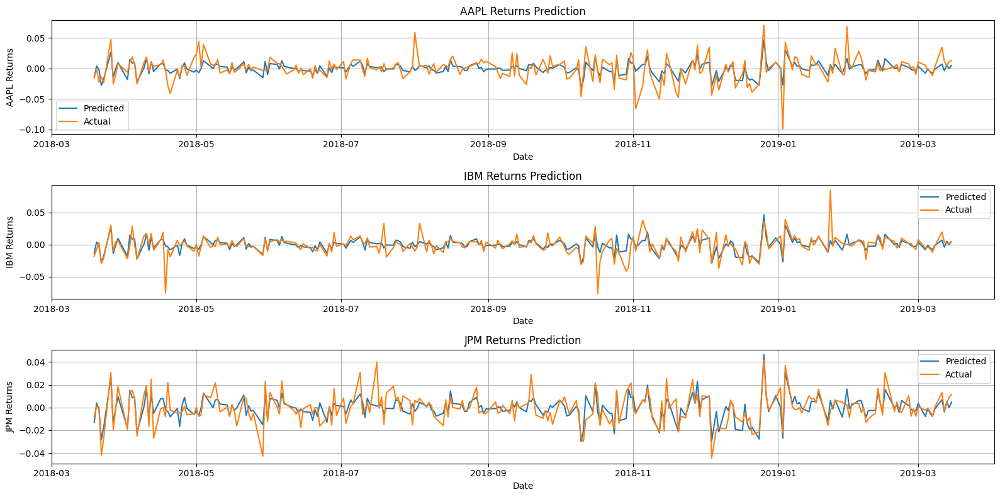

In [507]:
stock_returns = pd.DataFrame(index=aapl.index, columns=["AAPL", "IBM", "JPM", "DJI"])

for i, ticker in enumerate(tickers):
    stock_returns[tickers_names[i]] = ticker["Returns"]

stock_returns.dropna(inplace=True)


# OLS regression stocks vs DJI. (XTX)^-1XTy

dji_returns = stock_returns["DJI"]
stock_returns = stock_returns.drop(columns=["DJI"])

OLS = linear_model.LinearRegression()

betas = []
alphas = []
R2s = []
models = []
for stock in stock_returns.columns:
    OLS.fit(dji_returns.values.reshape(-1, 1), stock_returns[stock].values)
    betas.append(OLS.coef_[0])
    alphas.append(OLS.intercept_)
    models.append(OLS)
    R2s.append(
        OLS.score(dji_returns.values.reshape(-1, 1), stock_returns[stock].values)
    )


OLS_params = pd.DataFrame(index=stock_returns.columns, columns=["Beta", "Alpha"])

OLS_params["Beta"] = betas
OLS_params["Alpha"] = alphas

display(OLS_params)

fig, axs = plt.subplots(3, 1, figsize=(16, 8))

for i, stock in enumerate(stock_returns.columns):
    axs[i].scatter(dji_returns, stock_returns[stock])
    axs[i].plot(
        dji_returns, models[i].predict(dji_returns.values.reshape(-1, 1)), color="r"
    )
    axs[i].set_title(stock + " vs DJI Regression")
    axs[i].set_ylabel(stock + " Returns")
    axs[i].set_xlabel("DJI Returns")
    axs[i].text(
        0.1, 0.85, f"$R^2 = {R2s[i]:.3f}$", transform=axs[i].transAxes, fontsize=15
    )
    axs[i].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "stock_vs_dji_regression.png")
plt.show()

# returns prediction

fig, axs = plt.subplots(3, 1, figsize=(16, 8))

for i, stock in enumerate(stock_returns.columns):
    pred = models[i].predict(dji_returns.values.reshape(-1, 1))
    axs[i].plot(dji_returns.index, pred)
    axs[i].plot(dji_returns.index, stock_returns[stock])
    axs[i].set_title(stock + " Returns Prediction")
    axs[i].set_ylabel(stock + " Returns")
    axs[i].set_xlabel("Date")
    axs[i].legend(["Predicted", "Actual"])
    axs[i].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "stock_vs_dji_regression_prediction.png")
plt.show()

##### 4.3.2

,Beta,Alpha
AAPL,1.280361,0.000066
IBM,0.954721,-0.000471
JPM,0.936419,-0.000554


[0.5158578585193073, 0.41494360995139845, 0.5634034711418505]

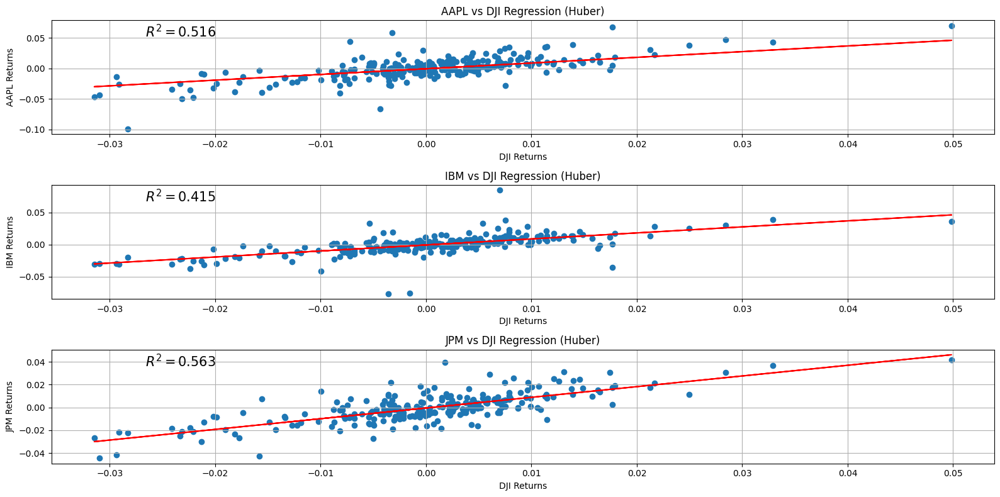

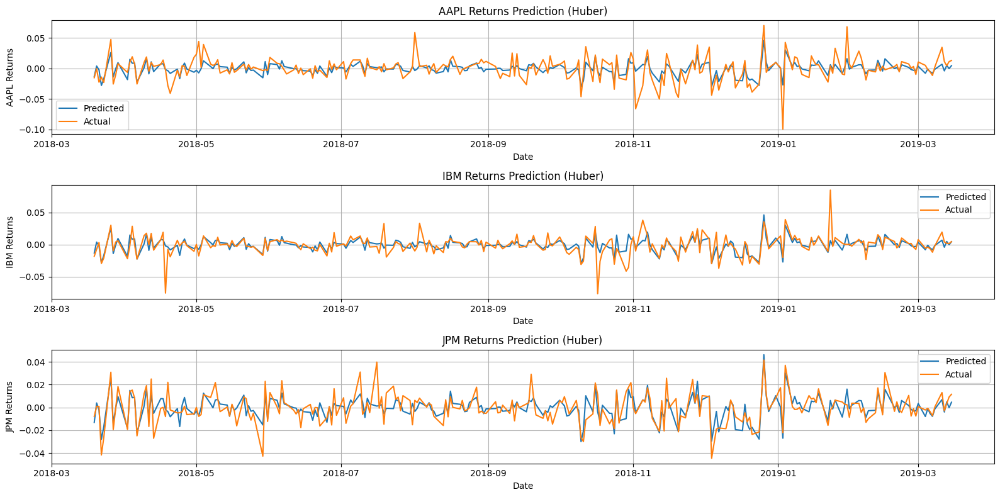

In [519]:
huber = linear_model.HuberRegressor()

h_betas = []
h_alphas = []
h_R2s = []

for stock in stock_returns.columns:
    huber.fit(dji_returns.values.reshape(-1, 1), stock_returns[stock].values)
    h_betas.append(huber.coef_[0])
    h_alphas.append(huber.intercept_)
    h_R2s.append(
        huber.score(dji_returns.values.reshape(-1, 1), stock_returns[stock].values)
    )

Huber_params = pd.DataFrame(index=stock_returns.columns, columns=["Beta", "Alpha"])

Huber_params["Beta"] = h_betas
Huber_params["Alpha"] = h_alphas

display(Huber_params)

fig, axs = plt.subplots(3, 1, figsize=(16, 8))

for i, stock in enumerate(stock_returns.columns):
    axs[i].scatter(dji_returns, stock_returns[stock])
    axs[i].plot(
        dji_returns, huber.predict(dji_returns.values.reshape(-1, 1)), color="r"
    )
    axs[i].set_title(stock + " vs DJI Regression (Huber)")
    axs[i].set_ylabel(stock + " Returns")
    axs[i].set_xlabel("DJI Returns")
    axs[i].text(
        0.1, 0.85, f"$R^2 = {h_R2s[i]:.3f}$", transform=axs[i].transAxes, fontsize=15
    )
    axs[i].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "stock_vs_dji_regression_huber.png")
plt.show()

fig, axs = plt.subplots(3, 1, figsize=(16, 8))

for i, stock in enumerate(stock_returns.columns):
    pred = huber.predict(dji_returns.values.reshape(-1, 1))
    axs[i].plot(dji_returns.index, pred)
    axs[i].plot(dji_returns.index, stock_returns[stock])
    axs[i].set_title(stock + " Returns Prediction (Huber)")
    axs[i].set_ylabel(stock + " Returns")
    axs[i].set_xlabel("Date")
    axs[i].legend(["Predicted", "Actual"])
    axs[i].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "stock_vs_dji_regression_prediction_huber.png")
plt.show()

##### 4.3.3

In [615]:
stocks_outliers = stock_returns.copy()
dji_outliers = dji_returns.copy()


stocks_outliers.loc["2018-08-20", "AAPL"] = 0.1
stocks_outliers.loc["2018-08-20", "IBM"] = 0.1
stocks_outliers.loc["2018-08-20", "JPM"] = 0.1

stocks_outliers.loc["2019-01-31", "AAPL"] = 0.12
stocks_outliers.loc["2019-01-31", "IBM"] = 0.12
stocks_outliers.loc["2019-01-31", "JPM"] = 0.12


dji_outliers.loc["2018-08-20"] = 0.1
dji_outliers.loc["2019-01-31"] = 0.12

'Vertical Outliers Params:'

,Beta,Alpha
AAPL,1.336362,0.000993
IBM,0.970082,0.000241
JPM,0.946763,0.000499


'Leverage Outliers Params:'

,Beta,Alpha
AAPL,0.701762,-0.000382
IBM,0.519353,-0.000988
JPM,0.476620,-0.000743


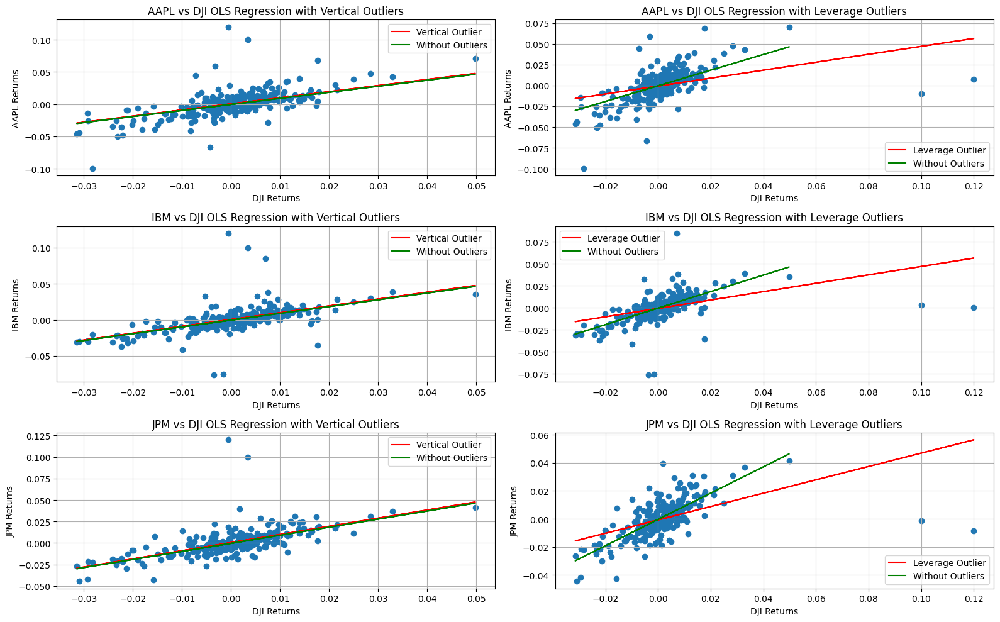

In [629]:
# OLS

OLS_outliers = linear_model.LinearRegression()

betas_o = []
alphas_o = []
R2s_o = []
models_o = []

# vertical outliers :

for stock in stocks_outliers.columns:
    OLS_outliers.fit(dji_returns.values.reshape(-1, 1), stocks_outliers[stock].values)
    betas_o.append(OLS_outliers.coef_[0])
    alphas_o.append(OLS_outliers.intercept_)
    models_o.append(OLS_outliers)
    R2s_o.append(
        OLS_outliers.score(
            dji_returns.values.reshape(-1, 1), stocks_outliers[stock].values
        )
    )


OLS_outliers_params = pd.DataFrame(
    index=stocks_outliers.columns, columns=["Beta", "Alpha"]
)

OLS_outliers_params["Beta"] = betas_o
OLS_outliers_params["Alpha"] = alphas_o

display("Vertical Outliers Params:")
display(OLS_outliers_params)


fig, axs = plt.subplots(3, 2, figsize=(16, 10))

for i, stock in enumerate(stocks_outliers.columns):
    axs[i, 0].scatter(dji_returns, stocks_outliers[stock])
    axs[i, 0].plot(
        dji_returns,
        models_o[i].predict(dji_returns.values.reshape(-1, 1)),
        color="r",
        label="Vertical Outlier",
    )
    axs[i, 0].plot(
        dji_returns,
        models[i].predict(dji_returns.values.reshape(-1, 1)),
        color="g",
        label="Without Outliers",
    )
    axs[i, 0].set_title(stock + " vs DJI OLS Regression with Vertical Outliers")
    axs[i, 0].set_ylabel(stock + " Returns")
    axs[i, 0].set_xlabel("DJI Returns")
    axs[i, 0].legend()
    axs[i, 0].grid(True)


# Leverage outliers :

OLS_outliers = linear_model.LinearRegression()

betas_o = []
alphas_o = []
R2s_o = []
models_o = []

for stock in stock_returns.columns:
    OLS_outliers.fit(dji_outliers.values.reshape(-1, 1), stock_returns[stock].values)
    betas_o.append(OLS_outliers.coef_[0])
    alphas_o.append(OLS_outliers.intercept_)
    models_o.append(OLS_outliers)
    R2s_o.append(
        OLS_outliers.score(
            dji_outliers.values.reshape(-1, 1), stock_returns[stock].values
        )
    )


OLS_outliers_params = pd.DataFrame(
    index=stock_returns.columns, columns=["Beta", "Alpha"]
)

OLS_outliers_params["Beta"] = betas_o
OLS_outliers_params["Alpha"] = alphas_o

display("Leverage Outliers Params:")
display(OLS_outliers_params)

# fig, axs = plt.subplots(3,1, figsize=(16,8))

for i, stock in enumerate(stock_returns.columns):
    axs[i, 1].scatter(dji_outliers, stock_returns[stock])
    axs[i, 1].plot(
        dji_outliers,
        models_o[i].predict(dji_outliers.values.reshape(-1, 1)),
        color="r",
        label="Leverage Outlier",
    )
    axs[i, 1].plot(
        dji_returns,
        models[i].predict(dji_returns.values.reshape(-1, 1)),
        color="g",
        label="Without Outliers",
    )
    axs[i, 1].set_title(stock + " vs DJI OLS Regression with Leverage Outliers")
    axs[i, 1].set_ylabel(stock + " Returns")
    axs[i, 1].set_xlabel("DJI Returns")
    axs[i, 1].legend()
    axs[i, 1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "stock_vs_dji_regression_vert&levoutliers.png")
plt.show()

'Vertical Outliers Params:'

,Beta,Alpha
AAPL,1.275623,-0.000085
IBM,0.972691,-0.000574
JPM,0.918557,-0.000733


'Leverage Outliers Params:'

,Beta,Alpha
AAPL,1.139413,-0.000223
IBM,0.887819,-0.000701
JPM,0.832299,-0.000879


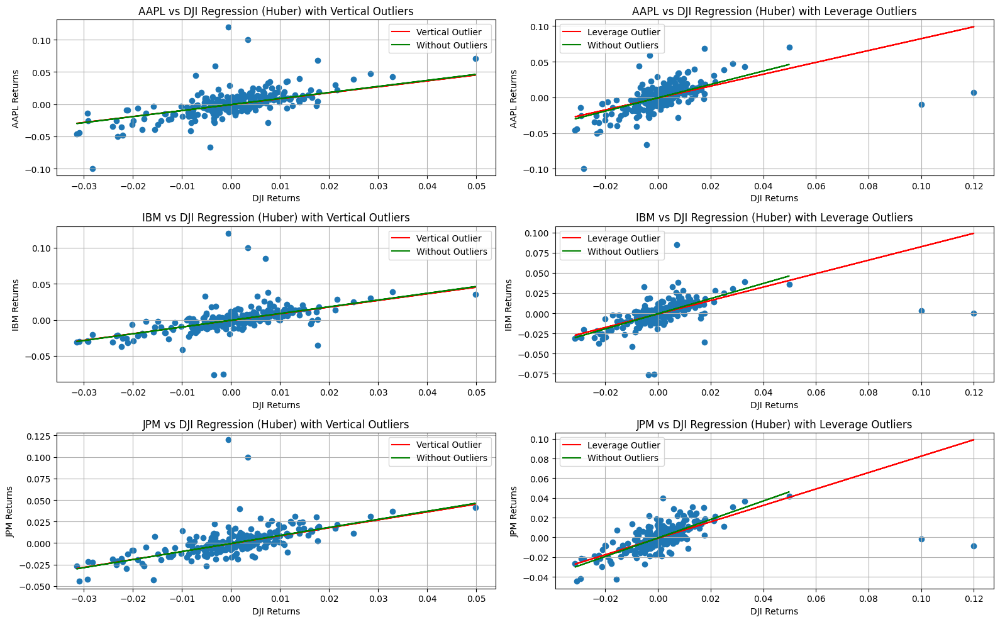

In [633]:
# huber

huber_outliers = linear_model.HuberRegressor()

h_betas_o = []
h_alphas_o = []
h_R2s_o = []

for stock in stocks_outliers.columns:
    huber_outliers.fit(dji_returns.values.reshape(-1, 1), stocks_outliers[stock].values)
    h_betas_o.append(huber_outliers.coef_[0])
    h_alphas_o.append(huber_outliers.intercept_)
    h_R2s_o.append(
        huber_outliers.score(
            dji_returns.values.reshape(-1, 1), stocks_outliers[stock].values
        )
    )

Huber_params_o = pd.DataFrame(index=stocks_outliers.columns, columns=["Beta", "Alpha"])

Huber_params_o["Beta"] = h_betas_o
Huber_params_o["Alpha"] = h_alphas_o

display("Vertical Outliers Params:")
display(Huber_params_o)

fig, axs = plt.subplots(3, 2, figsize=(16, 10))

for i, stock in enumerate(stocks_outliers.columns):
    axs[i, 0].scatter(dji_returns, stocks_outliers[stock])
    axs[i, 0].plot(
        dji_returns,
        huber_outliers.predict(dji_returns.values.reshape(-1, 1)),
        color="r",
        label="Vertical Outlier",
    )
    axs[i, 0].plot(
        dji_returns,
        huber.predict(dji_returns.values.reshape(-1, 1)),
        color="g",
        label="Without Outliers",
    )
    axs[i, 0].set_title(stock + " vs DJI Regression (Huber) with Vertical Outliers")
    axs[i, 0].set_ylabel(stock + " Returns")
    axs[i, 0].set_xlabel("DJI Returns")
    axs[i, 0].legend()
    axs[i, 0].grid(True)


# leverage outlier

huber_outliers = linear_model.HuberRegressor()

h_betas_o = []
h_alphas_o = []
h_R2s_o = []

for stock in stock_returns.columns:
    huber_outliers.fit(dji_outliers.values.reshape(-1, 1), stock_returns[stock].values)
    h_betas_o.append(huber_outliers.coef_[0])
    h_alphas_o.append(huber_outliers.intercept_)
    h_R2s_o.append(
        huber_outliers.score(
            dji_outliers.values.reshape(-1, 1), stock_returns[stock].values
        )
    )

Huber_params_o = pd.DataFrame(index=stock_returns.columns, columns=["Beta", "Alpha"])

Huber_params_o["Beta"] = h_betas_o
Huber_params_o["Alpha"] = h_alphas_o

display("Leverage Outliers Params:")
display(Huber_params_o)


for i, stock in enumerate(stock_returns.columns):
    axs[i, 1].scatter(dji_outliers, stock_returns[stock])
    axs[i, 1].plot(
        dji_outliers,
        huber_outliers.predict(dji_outliers.values.reshape(-1, 1)),
        color="r",
        label="Leverage Outlier",
    )
    axs[i, 1].plot(
        dji_returns,
        huber.predict(dji_returns.values.reshape(-1, 1)),
        color="g",
        label="Without Outliers",
    )
    axs[i, 1].set_title(stock + " vs DJI Regression (Huber) with Leverage Outliers")
    axs[i, 1].set_ylabel(stock + " Returns")
    axs[i, 1].set_xlabel("DJI Returns")
    axs[i, 1].legend()
    axs[i, 1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "stock_vs_dji_regression_huber_vert&levoutliers.png")
plt.show()

### 4.4 Robust Trading Stategies

In [635]:
save_folder = "Section 4 figures/4.4/"

##### 4.4.1

In [728]:
stock_adj_closes = pd.DataFrame(index=aapl.index, columns=["AAPL", "IBM", "JPM", "DJI"])
stock_adj_closes["AAPL"] = aapl["Adj Close"].copy()
stock_adj_closes["IBM"] = ibm["Adj Close"].copy()
stock_adj_closes["JPM"] = jpm["Adj Close"].copy()
stock_adj_closes["DJI"] = dji["Adj Close"].copy()

stock_adj_closes_outliers = stock_adj_closes.copy()

# add random outliers

for i, stock in enumerate(stock_adj_closes_outliers.columns):
    num_outliers_to_add = random.randint(4, 8)
    dates = stock_adj_closes_outliers.index.to_list()
    outlier_dates = random.sample(dates, num_outliers_to_add)
    max_val = stock_adj_closes_outliers[stock].max()
    min_val = stock_adj_closes_outliers[stock].min()
    for date in outlier_dates:
        # Choose either a positive or negative multiplier
        mult_factor = random.choice(
            [random.uniform(1.05, 1.25), random.uniform(0.75, 0.95)]
        )
        if mult_factor < 1:
            mult_val = min_val
        else:
            mult_val = max_val
        stock_adj_closes_outliers.loc[date, stock] = mult_factor * mult_val

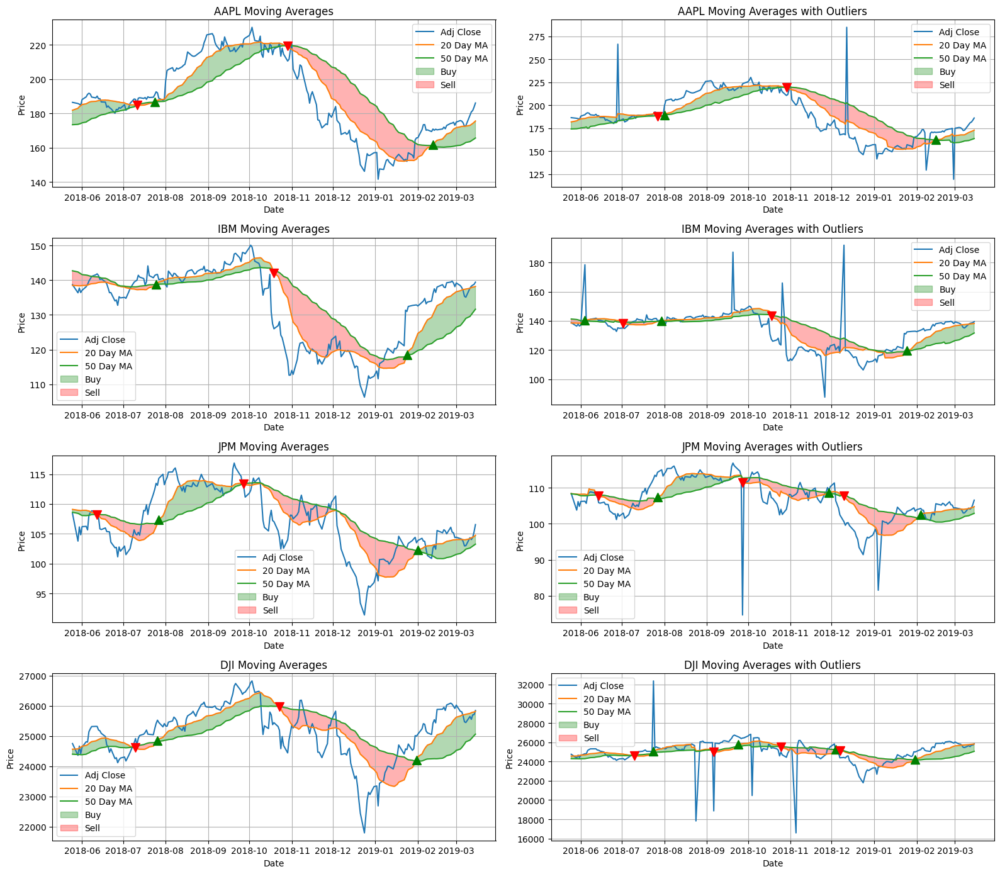

Difference in percentage of time in buy position:


AAPL   -0.014851
IBM    -0.074257
JPM    -0.034653
DJI     0.029703
dtype: float64

Difference in percentage of time in sell position:


AAPL    0.014851
IBM     0.074257
JPM     0.034653
DJI    -0.029703
dtype: float64

In [795]:
fig, axs = plt.subplots(4, 2, figsize=(16, 14))

stock_returns = pd.DataFrame(
    index=stock_adj_closes.index, columns=stock_adj_closes.columns
)
stock_returns = np.log(stock_adj_closes / stock_adj_closes.shift(1))
stock_returns_outliers = pd.DataFrame(
    index=stock_adj_closes_outliers.index, columns=stock_adj_closes_outliers.columns
)
stock_returns_outliers = np.log(
    stock_adj_closes_outliers / stock_adj_closes_outliers.shift(1)
)


ma_returns = pd.DataFrame(
    index=stock_adj_closes.index, columns=stock_adj_closes.columns
)
ma_returns_outliers = pd.DataFrame(
    index=stock_adj_closes_outliers.index, columns=stock_adj_closes_outliers.columns
)

all_ma_positions = pd.DataFrame(
    index=stock_adj_closes.index, columns=stock_adj_closes.columns
)
all_ma_positions_outliers = pd.DataFrame(
    index=stock_adj_closes_outliers.index, columns=stock_adj_closes_outliers.columns
)

for i, stock in enumerate(stock_adj_closes.columns):
    closes = stock_adj_closes[stock]
    closes_outliers = stock_adj_closes_outliers[stock]

    ma20 = closes.rolling(window=20).mean()
    ma50 = closes.rolling(window=50).mean()
    ma20_outliers = closes_outliers.rolling(window=20).mean()
    ma50_outliers = closes_outliers.rolling(window=50).mean()

    ma_position = np.sign((ma20 - ma50).dropna())
    ma_position_outliers = np.sign((ma20_outliers - ma50_outliers).dropna())
    all_ma_positions[stock] = ma_position.dropna()
    all_ma_positions_outliers[stock] = ma_position_outliers.dropna()

    # ma_position = 1 means long, -1 means short

    ma_returns[stock] = (stock_returns[stock] * ma_position).cumsum()
    ma_returns_outliers[stock] = (
        stock_returns_outliers[stock] * ma_position_outliers
    ).cumsum()

    crossover_points = ma_position.diff().abs() > 0
    buy_signals = crossover_points & (ma_position == 1)
    sell_signals = crossover_points & (ma_position == -1)

    axs[i, 0].plot(closes.index[49:], closes[49:], label="Adj Close")
    axs[i, 0].plot(ma20.index[49:], ma20[49:], label="20 Day MA")
    axs[i, 0].plot(ma50.index[49:], ma50[49:], label="50 Day MA")
    axs[i, 0].plot(
        ma20[49:].index[buy_signals], ma20[49:][buy_signals], "g^", markersize=10
    )
    axs[i, 0].plot(
        ma20[49:].index[sell_signals], ma20[49:][sell_signals], "rv", markersize=10
    )
    axs[i, 0].fill_between(
        ma_position.index,
        ma20[49:],
        ma50[49:],
        where=ma_position > 0,
        color="g",
        alpha=0.3,
        label="Buy",
    )
    axs[i, 0].fill_between(
        ma_position.index,
        ma20[49:],
        ma50[49:],
        where=ma_position < 0,
        color="r",
        alpha=0.3,
        label="Sell",
    )
    axs[i, 0].set_title(stock + " Moving Averages")
    axs[i, 0].set_ylabel("Price")
    axs[i, 0].set_xlabel("Date")
    axs[i, 0].legend()
    axs[i, 0].grid(True)

    crossover_points_outliers = ma_position_outliers.diff().abs() > 0
    buy_signals_outliers = crossover_points_outliers & (ma_position_outliers == 1)
    sell_signals_outliers = crossover_points_outliers & (ma_position_outliers == -1)

    axs[i, 1].plot(closes_outliers.index[49:], closes_outliers[49:], label="Adj Close")
    axs[i, 1].plot(ma20_outliers.index[49:], ma20_outliers[49:], label="20 Day MA")
    axs[i, 1].plot(ma50_outliers.index[49:], ma50_outliers[49:], label="50 Day MA")
    axs[i, 1].plot(
        ma20_outliers[49:].index[buy_signals_outliers],
        ma20_outliers[49:][buy_signals_outliers],
        "g^",
        markersize=10,
    )
    axs[i, 1].plot(
        ma20_outliers[49:].index[sell_signals_outliers],
        ma20_outliers[49:][sell_signals_outliers],
        "rv",
        markersize=10,
    )
    axs[i, 1].fill_between(
        ma_position_outliers.index,
        ma20_outliers[49:],
        ma50_outliers[49:],
        where=ma_position_outliers > 0,
        color="g",
        alpha=0.3,
        label="Buy",
    )
    axs[i, 1].fill_between(
        ma_position_outliers.index,
        ma20_outliers[49:],
        ma50_outliers[49:],
        where=ma_position_outliers < 0,
        color="r",
        alpha=0.3,
        label="Sell",
    )
    axs[i, 1].set_title(stock + " Moving Averages with Outliers")
    axs[i, 1].set_ylabel("Price")
    axs[i, 1].set_xlabel("Date")
    axs[i, 1].legend()
    axs[i, 1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "moving_averages_with_outliers.png")
plt.show()

percentage_in_buy = (
    all_ma_positions[all_ma_positions > 0].count() / all_ma_positions.count()
)
percentage_in_sell = (
    all_ma_positions[all_ma_positions < 0].count() / all_ma_positions.count()
)

percentage_in_buy_outliers = (
    all_ma_positions_outliers[all_ma_positions_outliers > 0].count()
    / all_ma_positions_outliers.count()
)
percentage_in_sell_outliers = (
    all_ma_positions_outliers[all_ma_positions_outliers < 0].count()
    / all_ma_positions_outliers.count()
)

print("Difference in percentage of time in buy position:")
display(percentage_in_buy - percentage_in_buy_outliers)
print("Difference in percentage of time in sell position:")
display(percentage_in_sell - percentage_in_sell_outliers)

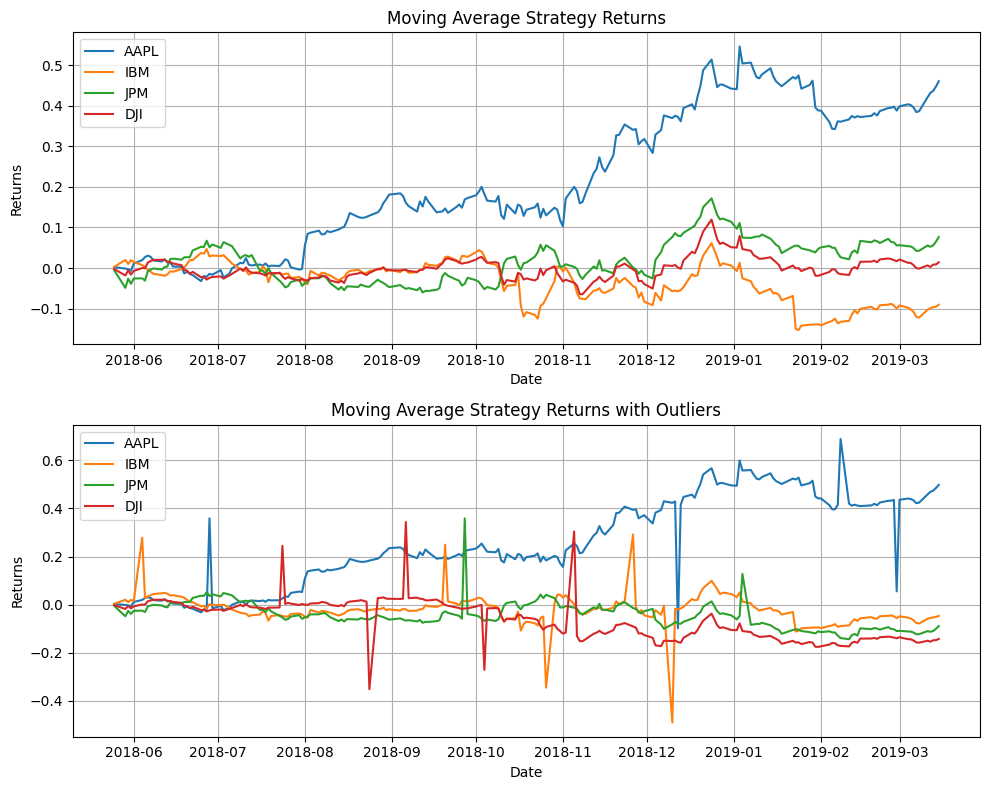

In [792]:
fig, axs = plt.subplots(2, 1, figsize=(10, 8))

axs[0].plot(ma_returns)
axs[0].set_title("Moving Average Strategy Returns")
axs[0].set_ylabel("Returns")
axs[0].set_xlabel("Date")
axs[0].legend(stock_adj_closes.columns)
axs[0].grid(True)

axs[1].plot(ma_returns_outliers)
axs[1].set_title("Moving Average Strategy Returns with Outliers")
axs[1].set_ylabel("Returns")
axs[1].set_xlabel("Date")
axs[1].legend(stock_adj_closes.columns)
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "moving_averages_returns.png")
plt.show()

##### 4.4.2

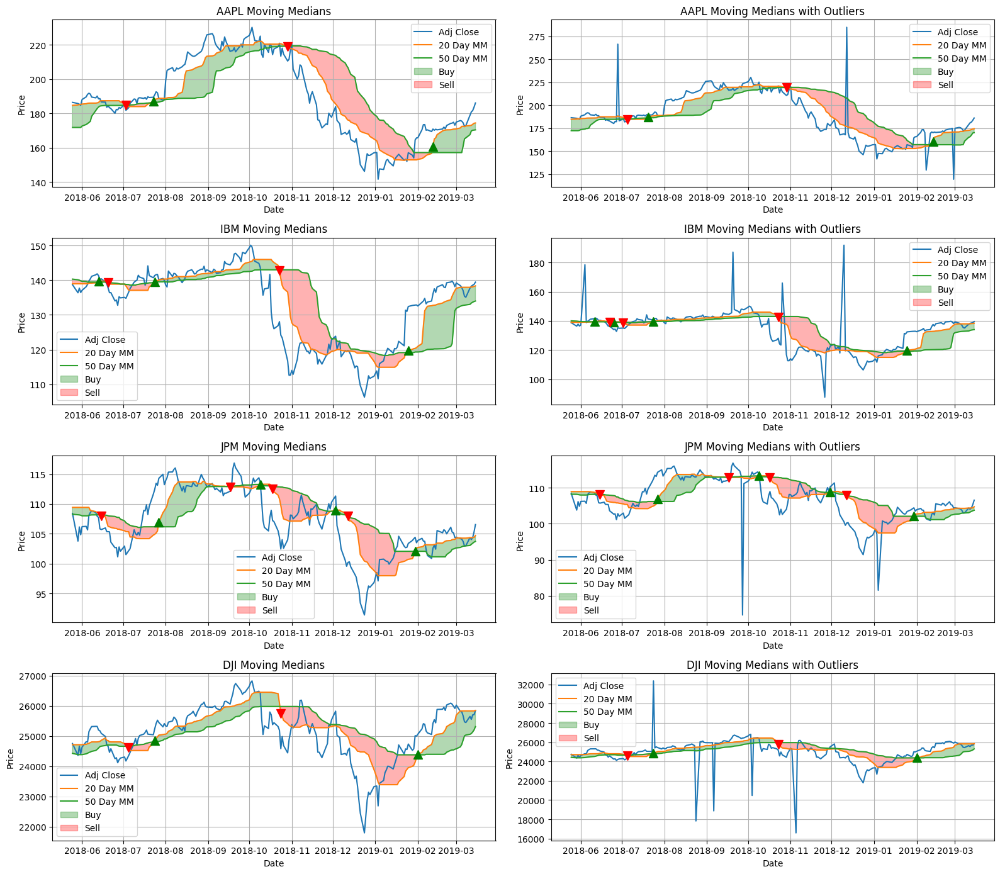

Difference in percentage of time in buy position:


AAPL   -0.004950
IBM    -0.044554
JPM     0.000000
DJI     0.004950
dtype: float64

Difference in percentage of time in sell position:


AAPL    0.004950
IBM     0.044554
JPM     0.000000
DJI    -0.004950
dtype: float64

In [794]:
# rolling median

fig, axs = plt.subplots(4, 2, figsize=(16, 14))

mm_returns = pd.DataFrame(
    index=stock_adj_closes.index, columns=stock_adj_closes.columns
)
mm_returns_outliers = pd.DataFrame(
    index=stock_adj_closes_outliers.index, columns=stock_adj_closes_outliers.columns
)

all_mm_positions = pd.DataFrame(
    index=stock_adj_closes.index, columns=stock_adj_closes.columns
)
all_mm_positions_outliers = pd.DataFrame(
    index=stock_adj_closes_outliers.index, columns=stock_adj_closes_outliers.columns
)

for i, stock in enumerate(stock_adj_closes.columns):
    closes = stock_adj_closes[stock]
    closes_outliers = stock_adj_closes_outliers[stock]

    mm20 = closes.rolling(window=20).median()
    mm50 = closes.rolling(window=50).median()
    mm20_outliers = closes_outliers.rolling(window=20).median()
    mm50_outliers = closes_outliers.rolling(window=50).median()

    mm_position = np.sign((mm20 - mm50).dropna())
    mm_position_outliers = np.sign((mm20_outliers - mm50_outliers).dropna())

    all_mm_positions[stock] = mm_position.dropna()
    all_mm_positions_outliers[stock] = mm_position_outliers.dropna()

    # mm_position = 1 means long, -1 means short

    mm_returns[stock] = (stock_returns[stock] * mm_position).cumsum()
    mm_returns_outliers[stock] = (
        stock_returns_outliers[stock] * mm_position_outliers
    ).cumsum()

    crossover_points = mm_position.diff().abs() > 0
    buy_signals = crossover_points & (mm_position == 1)
    sell_signals = crossover_points & (mm_position == -1)

    axs[i, 0].plot(closes.index[49:], closes[49:], label="Adj Close")
    axs[i, 0].plot(mm20.index[49:], mm20[49:], label="20 Day MM")
    axs[i, 0].plot(mm50.index[49:], mm50[49:], label="50 Day MM")
    axs[i, 0].plot(
        mm20[49:].index[buy_signals], mm20[49:][buy_signals], "g^", markersize=10
    )
    axs[i, 0].plot(
        mm20[49:].index[sell_signals], mm20[49:][sell_signals], "rv", markersize=10
    )
    axs[i, 0].fill_between(
        mm_position.index,
        mm20[49:],
        mm50[49:],
        where=mm_position > 0,
        color="g",
        alpha=0.3,
        label="Buy",
    )
    axs[i, 0].fill_between(
        mm_position.index,
        mm20[49:],
        mm50[49:],
        where=mm_position < 0,
        color="r",
        alpha=0.3,
        label="Sell",
    )
    axs[i, 0].set_title(stock + " Moving Medians")
    axs[i, 0].set_ylabel("Price")
    axs[i, 0].set_xlabel("Date")
    axs[i, 0].legend()
    axs[i, 0].grid(True)

    crossover_points_outliers = mm_position_outliers.diff().abs() > 0
    buy_signals_outliers = crossover_points_outliers & (mm_position_outliers == 1)
    sell_signals_outliers = crossover_points_outliers & (mm_position_outliers == -1)

    axs[i, 1].plot(closes_outliers.index[49:], closes_outliers[49:], label="Adj Close")
    axs[i, 1].plot(mm20_outliers.index[49:], mm20_outliers[49:], label="20 Day MM")
    axs[i, 1].plot(mm50_outliers.index[49:], mm50_outliers[49:], label="50 Day MM")
    axs[i, 1].plot(
        mm20_outliers[49:].index[buy_signals_outliers],
        mm20_outliers[49:][buy_signals_outliers],
        "g^",
        markersize=10,
    )
    axs[i, 1].plot(
        mm20_outliers[49:].index[sell_signals_outliers],
        mm20_outliers[49:][sell_signals_outliers],
        "rv",
        markersize=10,
    )
    axs[i, 1].fill_between(
        mm_position_outliers.index,
        mm20_outliers[49:],
        mm50_outliers[49:],
        where=mm_position_outliers > 0,
        color="g",
        alpha=0.3,
        label="Buy",
    )
    axs[i, 1].fill_between(
        mm_position_outliers.index,
        mm20_outliers[49:],
        mm50_outliers[49:],
        where=mm_position_outliers < 0,
        color="r",
        alpha=0.3,
        label="Sell",
    )
    axs[i, 1].set_title(stock + " Moving Medians with Outliers")
    axs[i, 1].set_ylabel("Price")
    axs[i, 1].set_xlabel("Date")
    axs[i, 1].legend()
    axs[i, 1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "moving_medians_with_outliers.png")
plt.show()

percentage_in_buy = (
    all_mm_positions[all_mm_positions > 0].count() / all_mm_positions.count()
)
percentage_in_sell = (
    all_mm_positions[all_mm_positions < 0].count() / all_mm_positions.count()
)

percentage_in_buy_outliers = (
    all_mm_positions_outliers[all_mm_positions_outliers > 0].count()
    / all_mm_positions_outliers.count()
)
percentage_in_sell_outliers = (
    all_mm_positions_outliers[all_mm_positions_outliers < 0].count()
    / all_mm_positions_outliers.count()
)

print("Difference in percentage of time in buy position:")
display(percentage_in_buy - percentage_in_buy_outliers)
print("Difference in percentage of time in sell position:")
display(percentage_in_sell - percentage_in_sell_outliers)

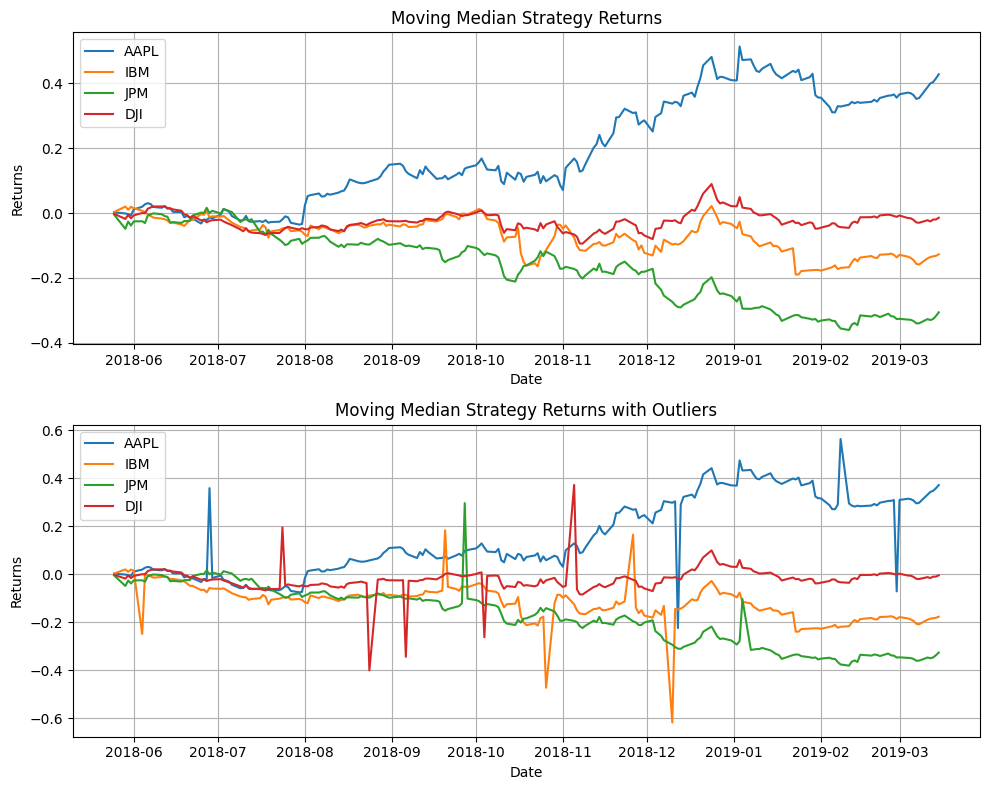

In [761]:
fig, axs = plt.subplots(2, 1, figsize=(10, 8))

axs[0].plot(mm_returns)
axs[0].set_title("Moving Median Strategy Returns")
axs[0].set_ylabel("Returns")
axs[0].set_xlabel("Date")
axs[0].legend(stock_adj_closes.columns)
axs[0].grid(True)

axs[1].plot(mm_returns_outliers)
axs[1].set_title("Moving Median Strategy Returns with Outliers")
axs[1].set_ylabel("Returns")
axs[1].set_xlabel("Date")
axs[1].legend(stock_adj_closes.columns)
axs[1].grid(True)

plt.tight_layout()
fig.savefig(save_folder + "moving_medians_returns.png")
plt.show()

## Section 5 - Graphs in Finance

### 5.1 - Choosing S&P Stocks

In [64]:
save_folder = "Section 5 figures/5.1/"

In [8]:
all_snp = pd.read_csv("snp_allstocks_2015_2019.csv")
all_snp = all_snp.set_index("Date")
all_snp.index = pd.to_datetime(all_snp.index, yearfirst=True, format="%Y-%m-%d")
snp_info = pd.read_csv("snp_info.csv")
snp_info.drop(columns=snp_info.columns[0], inplace=True)

In [9]:
url = "https://web.archive.org/web/20170703231238/https://www.slickcharts.com/sp500"
response = requests.get(url)
web_content = response.content

soup = BeautifulSoup(web_content, "html.parser")
table = soup.find("table", {"id": "example-1"})

# Extracting table headers
headers = [header.text for header in table.find_all("th")]

tickers = []
market_caps = []

# Extract data from each row of the table
for row in table.find("tbody").find_all("tr"):
    ticker_input = row.find("input", {"name": "symbol"})
    if ticker_input:
        tickers.append(ticker_input["value"])

    market_cap_td = row.find_all("td")[2].text
    market_caps.append(market_cap_td)

# Create a DataFrame
mkt_caps = pd.DataFrame(
    {"Ticker": tickers, "Market Cap": market_caps}
)  # market cap is actually weight in S&P 500

snp_info = snp_info.merge(mkt_caps, left_on="Symbol", right_on="Ticker", how="left")
snp_info.drop("Ticker", axis=1, inplace=True)  # drop duplicate column

In [10]:
# tech stocks largely saw good growth in period of 2015-2019
tech_stocks_info = snp_info[snp_info["GICS Sector"] == "Information Technology"]
tech_stocks_info = tech_stocks_info[tech_stocks_info["Market Cap"].notna()]

semiconductors_info = tech_stocks_info[
    tech_stocks_info["GICS Sub Industry"] == "Semiconductors"
]
semiconductors_info = semiconductors_info[semiconductors_info["Market Cap"].notna()]

californian_tech_stocks = tech_stocks_info[
    tech_stocks_info["Headquarters Location"].str.contains("Cali")
]

tech_stocks = all_snp[tech_stocks_info["Symbol"]]
semiconductors = all_snp[semiconductors_info["Symbol"]]

chosen_stock_tickers = [
    "LRCX",
    "AMAT",
    "INTC",
    "NVDA",
    "QCOM",
    "AVGO",
    "ADI",
    "SWKS",
    "TXN",
    "MU",
]
chosen_stocks_info = tech_stocks_info[
    tech_stocks_info["Symbol"].isin(chosen_stock_tickers)
]
# list names of chosen stocks
chosen_stocks_info[
    [
        "Security",
        "Symbol",
        "GICS Sector",
        "GICS Sub Industry",
        "Headquarters Location",
        "Market Cap",
    ]
]  # mcap actually weight

,Security,Symbol,GICS Sector,GICS Sub Industry,Headquarters Location,Market Cap
42,"Analog Devices, Inc.",ADI,Information Technology,Semiconductors,"Norwood, Massachusetts",0.137413
50,Applied Materials Inc.,AMAT,Information Technology,Semiconductor Equipment,"Santa Clara, California",0.213898
82,Broadcom,AVGO,Information Technology,Semiconductors,"San Jose, California",0.449496
252,Intel Corp.,INTC,Information Technology,Semiconductors,"Santa Clara, California",0.764670
288,Lam Research,LRCX,Information Technology,Semiconductor Equipment,"Fremont, California",0.110382
321,Micron Technology,MU,Information Technology,Semiconductors,"Boise, Idaho",0.149126
356,Nvidia Corporation,NVDA,Information Technology,Semiconductors,"Santa Clara, California",0.413936
392,QUALCOMM Inc.,QCOM,Information Technology,Semiconductors,"San Diego, California",0.392207
417,Skyworks Solutions,SWKS,Information Technology,Semiconductors,"Woburn, Massachusetts",0.085308
440,Texas Instruments,TXN,Information Technology,Semiconductors,"Dallas, Texas",0.369813


### 5.2 - Constructing the network

In [12]:
save_folder = "Section 5 figures/5.2/"

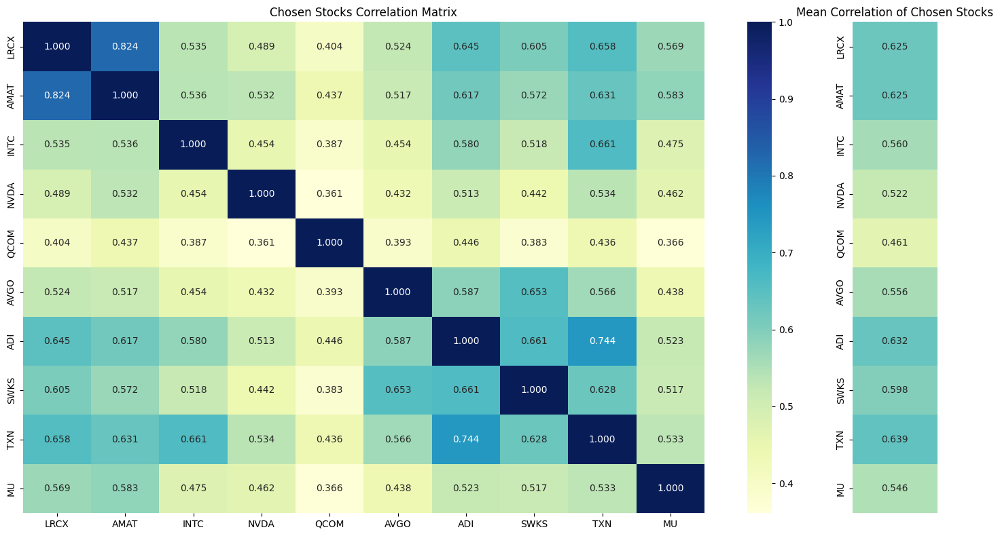

In [13]:
chosen_stocks = all_snp[chosen_stock_tickers]
chosen_stocks_log_ret = np.log(chosen_stocks / chosen_stocks.shift(1)).dropna()

chosen_stocks_corr = chosen_stocks_log_ret.corr()
min_corr = chosen_stocks_corr.min().min()
mean_corr = chosen_stocks_corr.mean()
mean_corr = mean_corr.to_frame()

fig, ax = plt.subplots(figsize=(14, 8), ncols=2, gridspec_kw={"width_ratios": [10, 1]})

# Plotting the correlation matrix heatmap
sns.heatmap(
    chosen_stocks_corr,
    annot=True,
    fmt=".3f",
    cmap="YlGnBu",
    ax=ax[0],
    vmin=min_corr,
    vmax=1,
)
ax[0].set_title("Chosen Stocks Correlation Matrix")

# Plotting the mean correlation heatmap
sns.heatmap(
    mean_corr,
    annot=True,
    fmt=".3f",
    cmap="YlGnBu",
    cbar=False,
    ax=ax[1],
    vmin=min_corr,
    vmax=1,
    xticklabels=False,
)
ax[1].set_title("Mean Correlation of Chosen Stocks")

plt.tight_layout()
plt.savefig(save_folder + "chosen_tech_stocks_and_mean_corr.png")
plt.show()

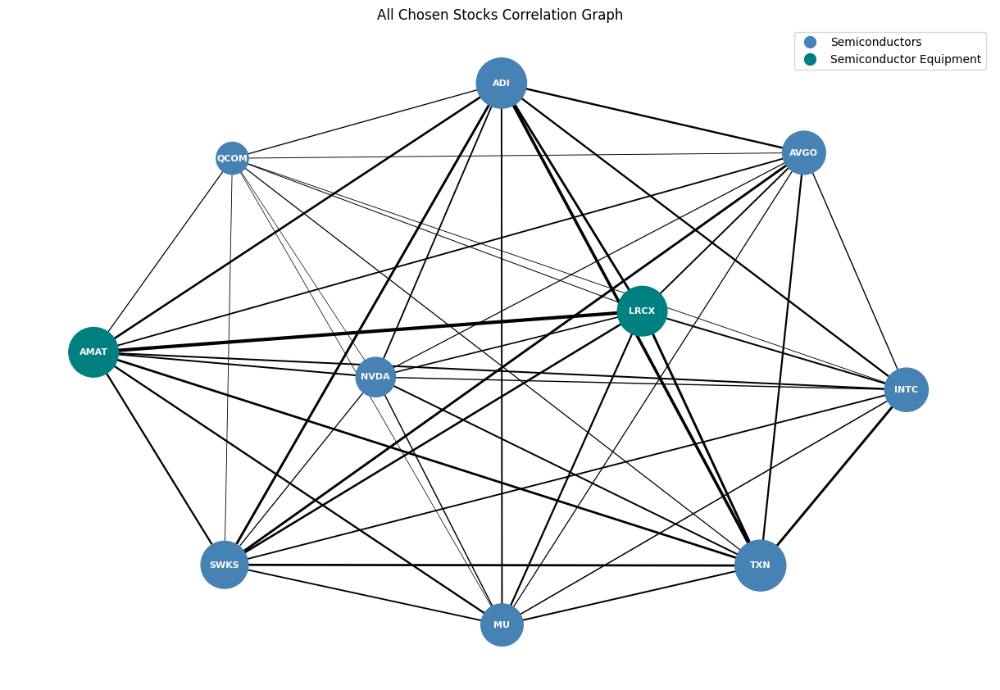

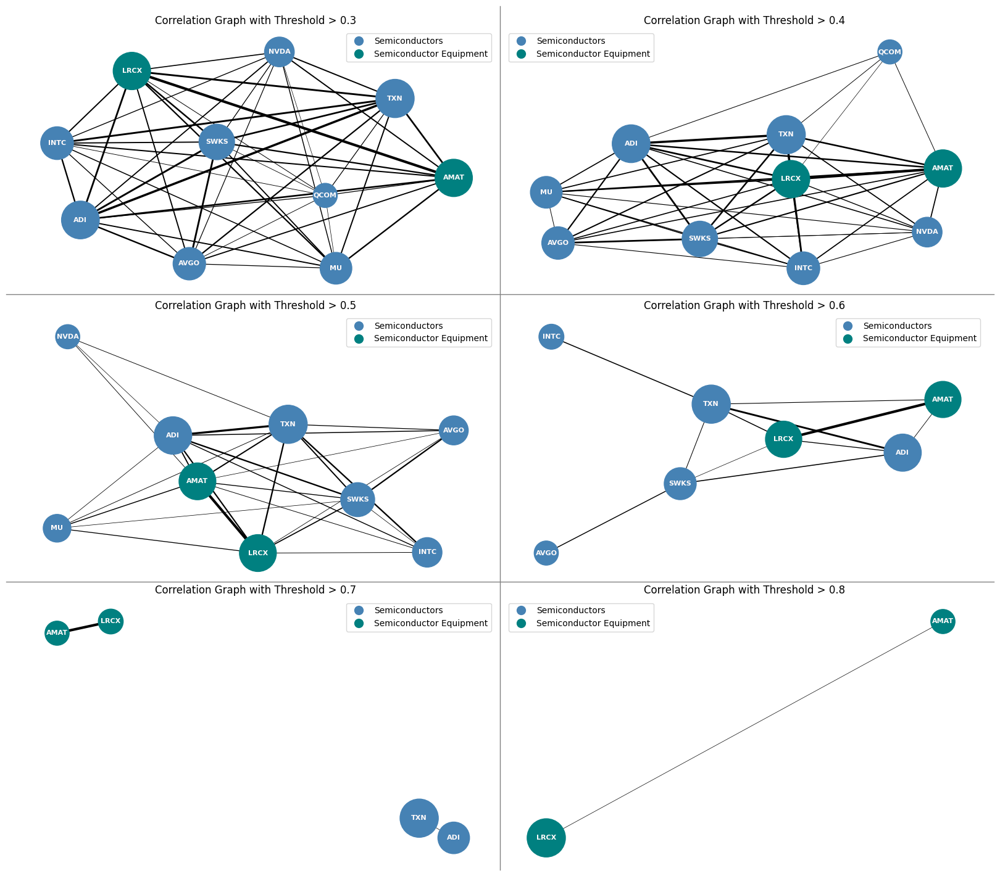

In [146]:
links = chosen_stocks_corr.stack().reset_index()
links.columns = ["stock1", "stock2", "corr"]

keep_threshold = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]

filtered_links = {t: None for t in keep_threshold}

for t in keep_threshold:
    filtered_links[t] = links.loc[
        (links["corr"] > t) & (links["stock1"] != links["stock2"])
    ]

graphs = {
    t: nx.from_pandas_edgelist(filtered_links[t], "stock1", "stock2", ["corr"])
    for t in keep_threshold
}

weights = {t: None for t in keep_threshold}


for t in keep_threshold:
    weights[t] = [graphs[t][u][v]["corr"] for u, v in graphs[t].edges()]
    weights[t] = minmax_scale(weights[t], feature_range=(0.5, 3))

node_sizes = {t: None for t in keep_threshold}

for t in keep_threshold:
    nodes = graphs[t].nodes()
    node_sizes[t] = [mean_corr.loc[n].values[0] for n in nodes]
    node_sizes[t] = minmax_scale(node_sizes[t], feature_range=(800, 2000))

colors = {t: None for t in keep_threshold}
# want steelblue for semiconductors, teal for semiconductor equipment
for t in keep_threshold:
    nodes = graphs[t].nodes()
    colors[t] = [
        "steelblue" if n in semiconductors_info["Symbol"].values else "teal"
        for n in nodes
    ]

# kamada_kawai_layout - spring between all nodes, spring same as graph dist between nodes. edges with large weight longer
# spring_layout (default) - attractive force between connected nodes proportional to the weight of the edge, repulsive force between all nodes. edges with large weight shorter

semiconductor_dot = mlines.Line2D(
    [],
    [],
    color="steelblue",
    marker=".",
    linestyle="None",
    markersize=20,
    label="Semiconductors",
)
equipment_dot = mlines.Line2D(
    [],
    [],
    color="teal",
    marker=".",
    linestyle="None",
    markersize=20,
    label="Semiconductor Equipment",
)
# all correlations above 0.3 so t=0.3 shows all links
plt.figure(figsize=(12, 8))
nx.draw(
    graphs[0.3],
    with_labels=True,
    width=weights[0.3],
    node_size=node_sizes[0.3],
    node_color=colors[0.3],
    font_size=8,
    font_weight="bold",
    font_color="snow",
    edge_color="black",
    pos=nx.spring_layout(graphs[0.3]),
)
plt.title("All Chosen Stocks Correlation Graph")
plt.legend(handles=[semiconductor_dot, equipment_dot])
plt.savefig(save_folder + "all_chosen_stocks_correlation_graph.png")
plt.show()

fig, axs = plt.subplots(3, 2, figsize=(16, 14))

for i, t in enumerate(keep_threshold):
    nx.draw(
        graphs[t],
        with_labels=True,
        width=weights[t],
        node_size=node_sizes[t],
        node_color=colors[t],
        font_size=8,
        font_weight="bold",
        font_color="snow",
        edge_color="black",
        pos=nx.spring_layout(graphs[t]),
        ax=axs[i // 2, i % 2],
    )
    axs[i // 2, i % 2].set_title(f"Correlation Graph with Threshold > {t}")
    axs[i // 2, i % 2].legend(handles=[semiconductor_dot, equipment_dot])
nx.draw_networkx
for i in range(1, 3):
    line = plt.Line2D(
        [0, 1], [i / 3, i / 3], transform=fig.transFigure, color="gray", linewidth=1
    )
    fig.add_artist(line)

# Vertical line
line = plt.Line2D(
    [0.5, 0.5], [0, 1], transform=fig.transFigure, color="gray", linewidth=1
)
fig.add_artist(line)

plt.tight_layout()
fig.savefig(save_folder + "all_correlation_graphs.png")
plt.show()

### 5.3 in report

### 5.4 - Another Metric

In [15]:
save_folder = "Section 5 figures/5.4/"

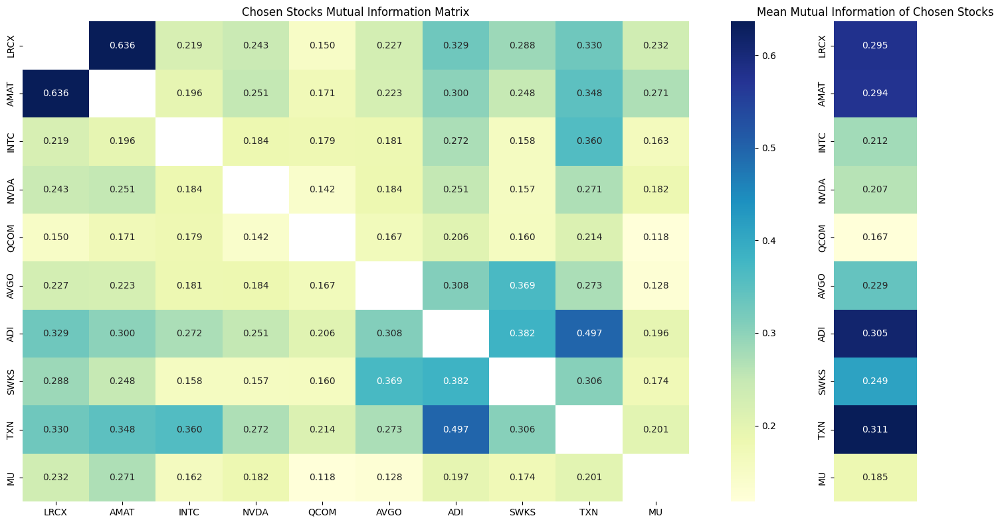

In [199]:
# not used in analysis

from sklearn.feature_selection import mutual_info_regression

MI = pd.DataFrame(
    index=chosen_stocks_log_ret.columns, columns=chosen_stocks_log_ret.columns
)

for stock1 in chosen_stocks_log_ret.columns:
    for stock2 in chosen_stocks_log_ret.columns:
        if stock1 != stock2:
            MI.loc[stock1, stock2] = mutual_info_regression(
                chosen_stocks_log_ret[stock1].values.reshape(-1, 1),
                chosen_stocks_log_ret[stock2].values,
                n_neighbors=10,
            )

mean_MI = MI.mean()
mean_MI = mean_MI.to_frame()
mean_MI = mean_MI.apply(pd.to_numeric)  # workaround for image type data error

fig, ax = plt.subplots(figsize=(14, 8), ncols=2, gridspec_kw={"width_ratios": [10, 1]})

# Plotting the mutual information matrix heatmap
sns.heatmap(MI.astype(float), annot=True, fmt=".3f", cmap="YlGnBu", ax=ax[0])
ax[0].set_title("Chosen Stocks Mutual Information Matrix")

# Plotting the mean mutual information heatmap
sns.heatmap(
    mean_MI,
    annot=True,
    fmt=".3f",
    cmap="YlGnBu",
    cbar=False,
    ax=ax[1],
    xticklabels=False,
)

ax[1].set_title("Mean Mutual Information of Chosen Stocks")

plt.tight_layout()
plt.savefig(save_folder + "chosen_tech_stocks_and_mean_MI.png")
plt.show()

Graph with 10 nodes and 45 edges
Graph with 10 nodes and 38 edges
Graph with 9 nodes and 23 edges
Graph with 7 nodes and 12 edges
Graph with 7 nodes and 6 edges
Graph with 4 nodes and 2 edges


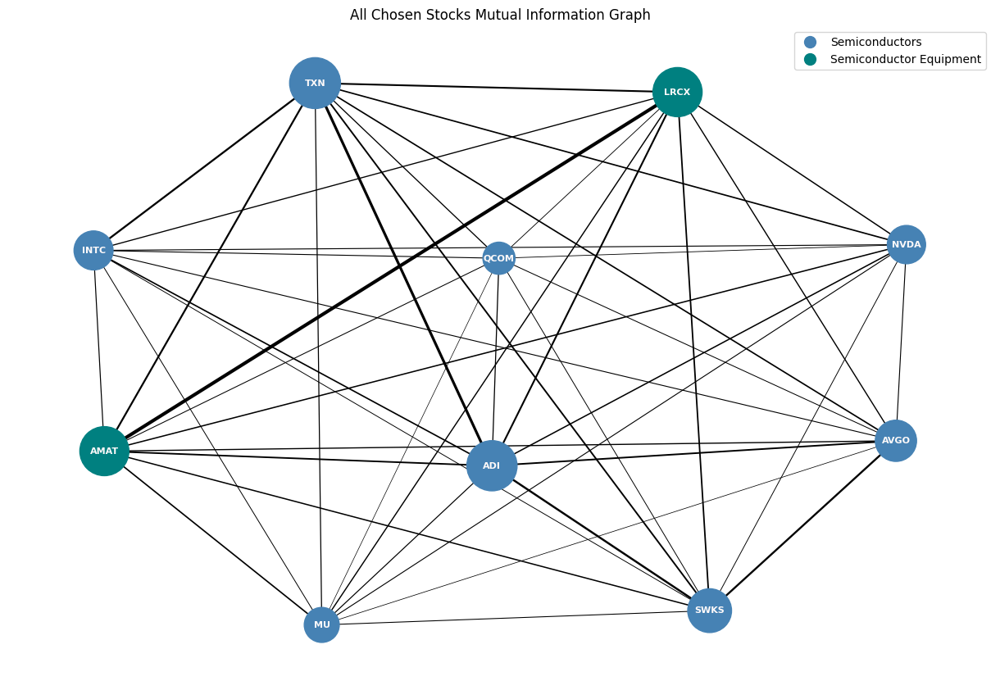

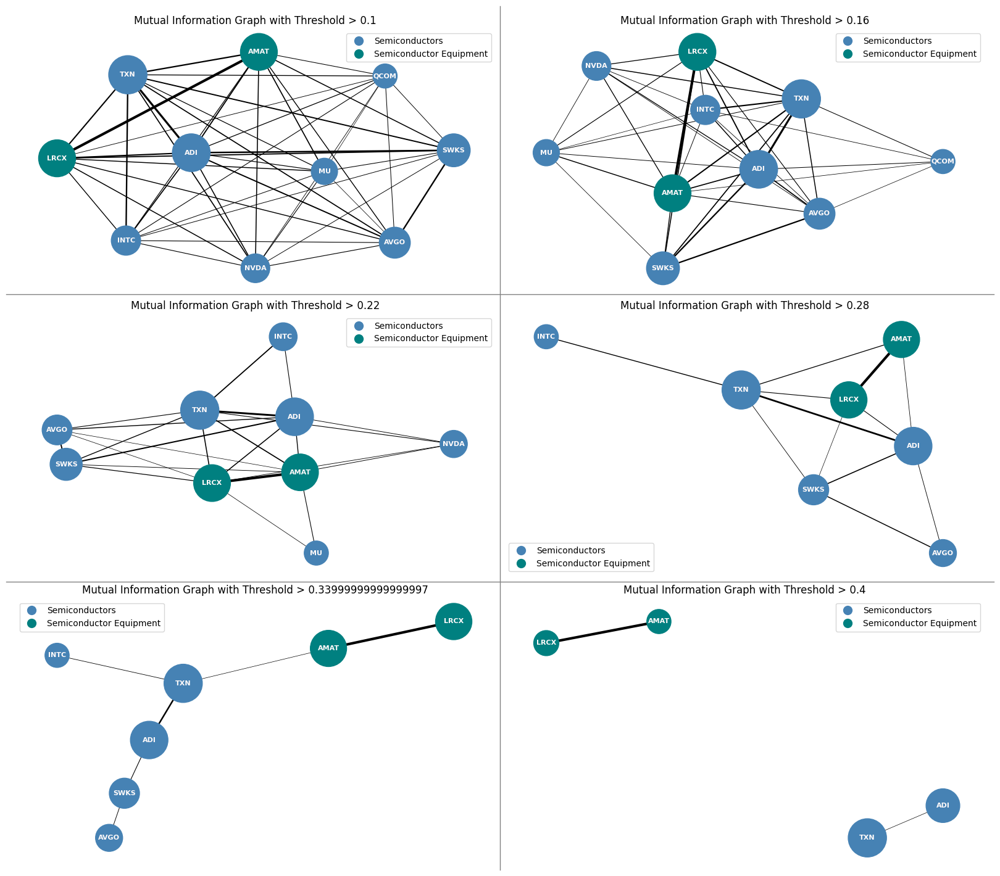

In [194]:
# not used in analysis
links = MI.stack().reset_index()
links.columns = ["stock1", "stock2", "MI"]

keep_threshold = np.arange(0.1, 0.45, 0.06)

filtered_links = {t: None for t in keep_threshold}

for t in keep_threshold:
    filtered_links[t] = links.loc[
        (links["MI"] > t) & (links["stock1"] != links["stock2"])
    ]

graphs = {
    t: nx.from_pandas_edgelist(filtered_links[t], "stock1", "stock2", ["MI"])
    for t in keep_threshold
}

weights = {t: None for t in keep_threshold}

for t in keep_threshold:
    weights[t] = [graphs[t][u][v]["MI"] for u, v in graphs[t].edges()]
    weights[t] = minmax_scale(weights[t], feature_range=(0.5, 3))

node_sizes = {t: None for t in keep_threshold}

for t in keep_threshold:
    nodes = graphs[t].nodes()
    node_sizes[t] = [mean_MI.loc[n] for n in nodes]
    node_sizes[t] = minmax_scale(node_sizes[t], feature_range=(800, 2000))

colors = {t: None for t in keep_threshold}

for t in keep_threshold:
    nodes = graphs[t].nodes()
    colors[t] = [
        "steelblue" if n in semiconductors_info["Symbol"].values else "teal"
        for n in nodes
    ]

plt.figure(figsize=(12, 8))
nx.draw(
    graphs[0.1],
    with_labels=True,
    width=weights[0.1],
    node_size=node_sizes[0.1],
    node_color=colors[0.1],
    font_size=8,
    font_weight="bold",
    font_color="snow",
    edge_color="black",
    pos=nx.spring_layout(graphs[0.1]),
)
plt.title("All Chosen Stocks Mutual Information Graph")
plt.legend(handles=[semiconductor_dot, equipment_dot])
plt.savefig(save_folder + "all_chosen_stocks_mutual_information_graph.png")
plt.show()

fig, axs = plt.subplots(3, 2, figsize=(16, 14))

for i, t in enumerate(keep_threshold):
    nx.draw(
        graphs[t],
        with_labels=True,
        width=weights[t],
        node_size=node_sizes[t],
        node_color=colors[t],
        font_size=8,
        font_weight="bold",
        font_color="snow",
        edge_color="black",
        pos=nx.spring_layout(graphs[t]),
        ax=axs[i // 2, i % 2],
    )
    axs[i // 2, i % 2].set_title(f"Mutual Information Graph with Threshold > {t}")
    axs[i // 2, i % 2].legend(handles=[semiconductor_dot, equipment_dot])

for i in range(1, 3):
    line = plt.Line2D(
        [0, 1], [i / 3, i / 3], transform=fig.transFigure, color="gray", linewidth=1
    )
    fig.add_artist(line)

# Vertical line
line = plt.Line2D(
    [0.5, 0.5], [0, 1], transform=fig.transFigure, color="gray", linewidth=1
)
fig.add_artist(line)

plt.tight_layout()
fig.savefig(save_folder + "all_mutual_information_graphs.png")
plt.show()

# doesnt really show anything diff than corr - trying something else

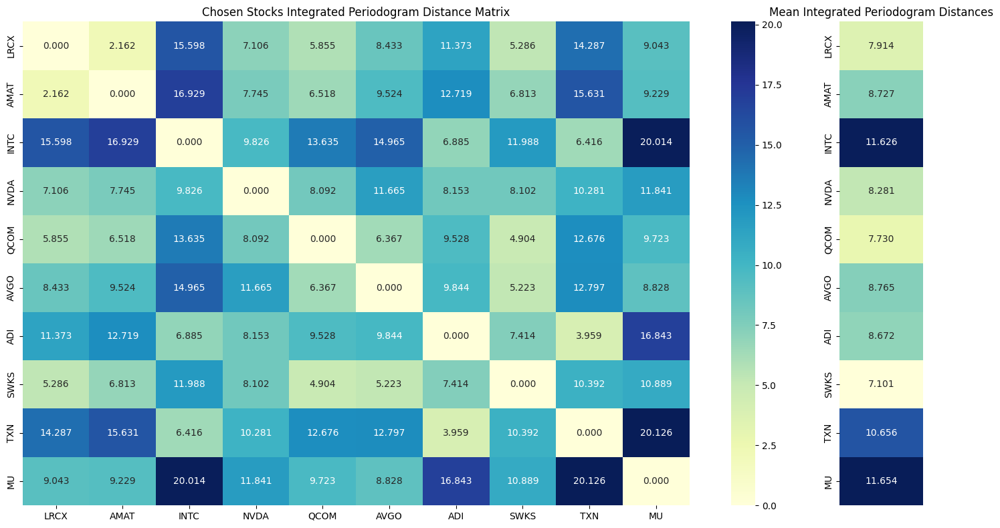

Overall mean integrated periodogram distance: 9.112514781146302


In [375]:
# integrated periodogram dissimilarity


def dist_INT_PER(x, y, normalize=True):
    # Compute periodograms for both time series
    _, Ix = periodogram(x)
    _, Iy = periodogram(y)

    if normalize:
        Cx = np.sum(Ix) if np.sum(Ix) != 0 else 1
        Cy = np.sum(Iy) if np.sum(Iy) != 0 else 1
    else:
        Cx, Cy = 1, 1

    # Calculate the sum of absolute differences of the normalized cumulative sums
    diff_cumsum = np.sum(np.abs(np.cumsum(Ix) / Cx - np.cumsum(Iy) / Cy))

    return diff_cumsum


int_per_dists = pd.DataFrame(
    index=chosen_stocks_log_ret.columns, columns=chosen_stocks_log_ret.columns
)

for stock1 in chosen_stocks_log_ret.columns:
    for stock2 in chosen_stocks_log_ret.columns:
        int_per_dists.loc[stock1, stock2] = dist_INT_PER(
            chosen_stocks_log_ret[stock1].dropna(),
            chosen_stocks_log_ret[stock2].dropna(),
            normalize=True,
        )

fig, ax = plt.subplots(figsize=(14, 8), ncols=2, gridspec_kw={"width_ratios": [10, 1]})
sns.heatmap(int_per_dists.astype(float), annot=True, fmt=".3f", cmap="YlGnBu", ax=ax[0])
ax[0].set_title("Chosen Stocks Integrated Periodogram Distance Matrix")
int_mean_per_dists = int_per_dists.copy().mean()
int_mean_per_dists = int_mean_per_dists.to_frame()
int_mean_per_dists = int_mean_per_dists.apply(pd.to_numeric)

sns.heatmap(
    int_mean_per_dists,
    annot=True,
    fmt=".3f",
    cmap="YlGnBu",
    cbar=False,
    ax=ax[1],
    xticklabels=False,
)
ax[1].set_title("Mean Integrated Periodogram Distances")
plt.tight_layout()

plt.savefig(save_folder + "chosen_tech_stocks_and_mean_int_per_dist.png")
plt.show()

overall_mean_int_per_dists = int_per_dists.mean().mean()
print("Overall mean integrated periodogram distance:", overall_mean_int_per_dists)

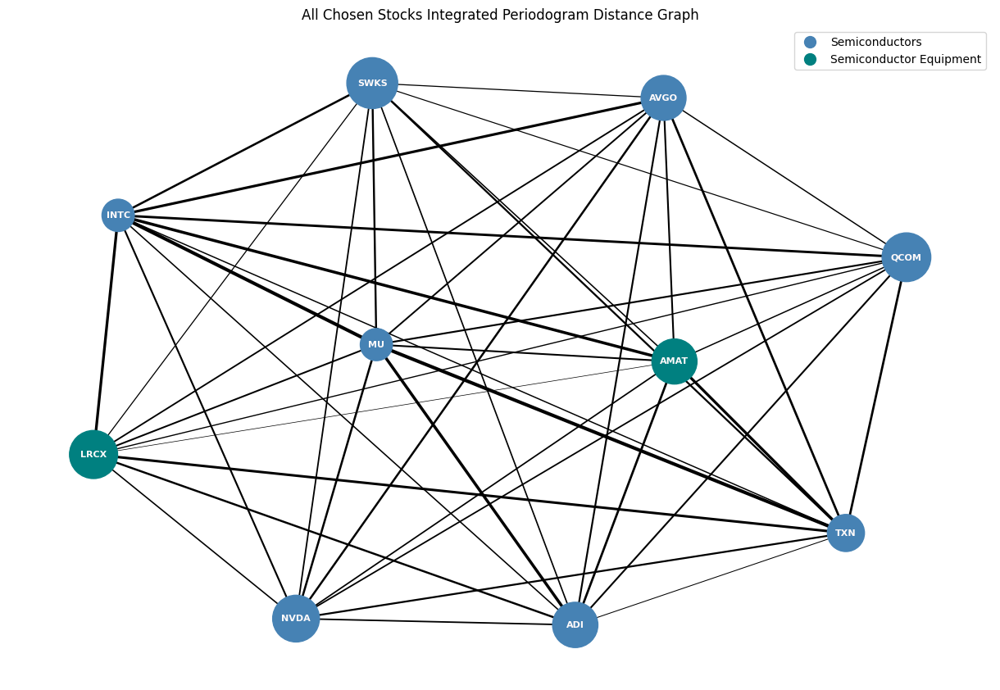

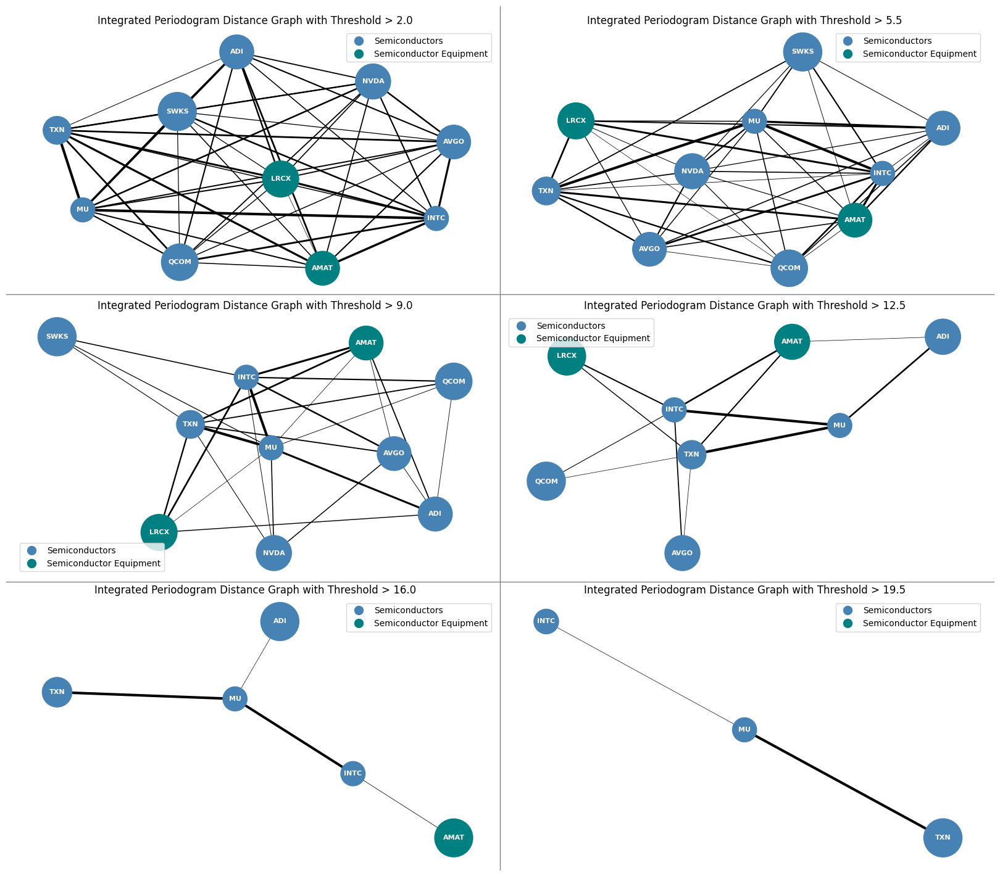

In [376]:
links = int_per_dists.stack().reset_index()
links.columns = ["stock1", "stock2", "dist"]

keep_threshold = np.arange(2, 20, 3.5)

# keep_threshold = np.array([24, 14, 10, 8, 6, 4])

filtered_links = {t: None for t in keep_threshold}

for t in keep_threshold:
    filtered_links[t] = links.loc[
        (links["dist"] > t) & (links["stock1"] != links["stock2"])
    ]

graphs = {
    t: nx.from_pandas_edgelist(filtered_links[t], "stock1", "stock2", ["dist"])
    for t in keep_threshold
}

weights = {t: None for t in keep_threshold}

for t in keep_threshold:
    weights[t] = [graphs[t][u][v]["dist"] for u, v in graphs[t].edges()]
    weights[t] = minmax_scale(weights[t], feature_range=(0.5, 3))

node_sizes = {t: None for t in keep_threshold}

for t in keep_threshold:
    nodes = graphs[t].nodes()

    node_sizes[t] = [1 - int_mean_per_dists.loc[n].values[0] for n in nodes]
    # node_sizes[t] = [int_mean_per_dists.loc[n].values[0] for n in nodes]
    node_sizes[t] = minmax_scale(node_sizes[t], feature_range=(800, 2000))

colors = {t: None for t in keep_threshold}

for t in keep_threshold:
    nodes = graphs[t].nodes()
    colors[t] = [
        "steelblue" if n in semiconductors_info["Symbol"].values else "teal"
        for n in nodes
    ]

final = list(graphs.keys())[0]
plt.figure(figsize=(12, 8))
nx.draw(
    graphs[final],
    with_labels=True,
    width=weights[final],
    node_size=node_sizes[final],
    node_color=colors[final],
    font_size=8,
    font_weight="bold",
    font_color="snow",
    edge_color="black",
    pos=nx.spring_layout(graphs[final]),
)
plt.title("All Chosen Stocks Integrated Periodogram Distance Graph")
plt.legend(handles=[semiconductor_dot, equipment_dot])
plt.savefig(save_folder + "all_chosen_stocks_integrated_periodogram_graph.png")
plt.show()

fig, axs = plt.subplots(3, 2, figsize=(16, 14))

for i, t in enumerate(keep_threshold):
    nx.draw(
        graphs[t],
        with_labels=True,
        width=weights[t],
        node_size=node_sizes[t],
        node_color=colors[t],
        font_size=8,
        font_weight="bold",
        font_color="snow",
        edge_color="black",
        pos=nx.spring_layout(graphs[t]),
        ax=axs[i // 2, i % 2],
    )
    axs[i // 2, i % 2].set_title(
        f"Integrated Periodogram Distance Graph with Threshold > {t.round(3)}"
    )
    axs[i // 2, i % 2].legend(handles=[semiconductor_dot, equipment_dot])

for i in range(1, 3):
    line = plt.Line2D(
        [0, 1], [i / 3, i / 3], transform=fig.transFigure, color="gray", linewidth=1
    )
    fig.add_artist(line)

# Vertical line
line = plt.Line2D(
    [0.5, 0.5], [0, 1], transform=fig.transFigure, color="gray", linewidth=1
)

fig.add_artist(line)

plt.tight_layout()
plt.savefig(save_folder + "all_integrated_periodogram_graphs.png")
plt.show()

# below threshold:
# keeping smaller distances - want most similar periodograms
# smaller mean dist = larger node size
# larger weight = larger edge width

# above threshold:
# keeping larger distances - want most dissimilar periodograms
# larger mean dist = larger node size
# larger weight = larger edge width

### 5.5 - Using prices instead of log returns

In [367]:
save_folder = "Section 5 figures/5.5/"

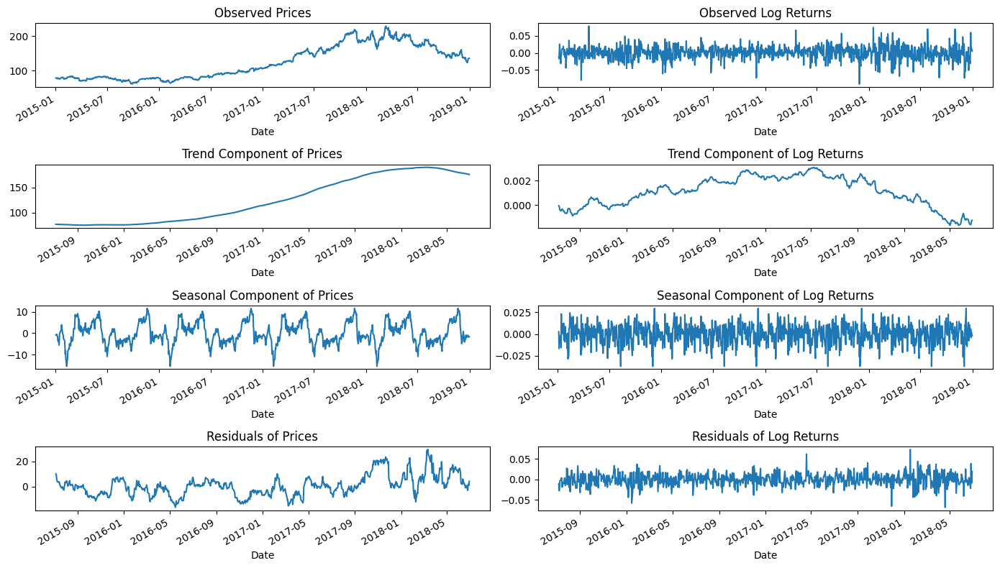

In [386]:
from statsmodels.tsa.seasonal import seasonal_decompose

chosen_stocks_prices = all_snp[chosen_stock_tickers]

decomp = seasonal_decompose(chosen_stocks_prices["LRCX"], model="additive", period=252)

decomp2 = seasonal_decompose(
    chosen_stocks_log_ret["LRCX"], model="additive", period=252
)

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 8))

# First column - Prices
decomp.observed.plot(ax=axes[0, 0], title="Observed Prices")
decomp.trend.plot(ax=axes[1, 0], title="Trend Component of Prices")
decomp.seasonal.plot(ax=axes[2, 0], title="Seasonal Component of Prices")
decomp.resid.plot(ax=axes[3, 0], title="Residuals of Prices")

# Second column - Log Returns
decomp2.observed.plot(ax=axes[0, 1], title="Observed Log Returns")
decomp2.trend.plot(ax=axes[1, 1], title="Trend Component of Log Returns")
decomp2.seasonal.plot(ax=axes[2, 1], title="Seasonal Component of Log Returns")
decomp2.resid.plot(ax=axes[3, 1], title="Residuals of Log Returns")

plt.tight_layout()
plt.savefig(save_folder + "LRCX_decomposition.png")
plt.show()